## <span style="color:#ff5f27">🧬 Train Retrieval Model </span>



## <span style="color:#ff5f27">📝 Imports </span>


In [2]:
import tensorflow as tf
from tensorflow.keras.layers import StringLookup, Normalization
import tensorflow_recommenders as tfrs
import pandas as pd
import numpy as np
import hopsworks
import warnings
import re
warnings.filterwarnings('ignore')



In [ ]:
# # Load feature view and feature groups
# feature_view = fs.get_feature_view(name='event_retrieval', version=1)
# users_df = fs.get_feature_group("users", version=1).read()
# events_df = fs.get_feature_group("events", version=1).read()
# interactions_df = fs.get_feature_group("interactions", version=1).read()

## <span style="color:#ff5f27">🔮 Connect to Hopsworks Feature Store </span>

In [3]:

# Connect to Hopsworks Feature Store
project = hopsworks.login()
fs = project.get_feature_store()



2025-05-21 11:03:29,820 INFO: Initializing external client
2025-05-21 11:03:29,822 INFO: Base URL: https://c.app.hopsworks.ai:443
2025-05-21 11:03:31,079 INFO: Python Engine initialized.

Logged in to project, explore it here https://c.app.hopsworks.ai:443/p/1220788


---

## <span style="color:#ff5f27">🔪 Feature Selection </span>


In [40]:
import tensorflow as tf
import pandas as pd

# Load from Hopsworks feature groups
users_fg = fs.get_feature_group(name="users", version=1)
events_fg = fs.get_feature_group(name="events", version=1)
interactions_fg = fs.get_feature_group(name="interactions", version=1)


In [3]:
import pandas as pd
merged_df = pd.read_csv("/home/nkama/masters_thesis_project/thesis/sythesize_from_scratch/test_merged_data.csv")

In [4]:

# Define features for query and candidate towers (retrieval model only)
QUERY_FEATURES = ["user_id", "user_city", "age", "user_interests"]
CANDIDATE_FEATURES = ["event_id", "title","event_type", "event_city"]

In [41]:

# Join user + event features with interactions
selected_features = interactions_fg.select(["interaction_id"])\
    .join(users_fg.select(QUERY_FEATURES), on="user_id")\
    .join(events_fg.select(CANDIDATE_FEATURES), on="event_id")


## <span style="color:#ff5f27">⚙️ Feature View Creation </span>


In [ ]:

# Create feature view
feature_view = fs.create_feature_view(
    name='event_retrieval',
    version=1,
    query=selected_features,
)


## <span style="color:#ff5f27">🏋️ Training Dataset </span>


In [5]:
feature_view = fs.get_feature_view(
    name='event_retrieval',
    version=1,
)

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import StringLookup, Normalization
import tensorflow_recommenders as tfrs
import pandas as pd
import numpy as np
import hopsworks
import warnings
import re
warnings.filterwarnings('ignore')

# Connect to Hopsworks Feature Store
project = hopsworks.login()
fs = project.get_feature_store()

# Load feature view and feature groups
feature_view = fs.get_feature_view(name='event_retrieval', version=1)
users_df = fs.get_feature_group("users", version=1).read()
events_df = fs.get_feature_group("events", version=1).read()
interactions_df = fs.get_feature_group("interactions", version=1).read()

# Define features for query and candidate towers (retrieval model only)
QUERY_FEATURES = ["user_id", "user_city", "age", "user_interests"]
CANDIDATE_FEATURES = ["event_id", "title","event_type", "event_city"]

# Join user + event features with interactions
selected_features = interactions_fg.select(["interaction_id"])\
    .join(users_fg.select(QUERY_FEATURES), on="user_id")\
    .join(events_fg.select(CANDIDATE_FEATURES), on="event_id")

# Create feature view
feature_view = fs.create_feature_view(
    name='event_retrieval',
    version=1,
    query=selected_features,
)

# Split dataset
train_df, val_df, test_df, _, _, _ = feature_view.train_validation_test_split(
    validation_size=0.1, 
    test_size=0.01,
    description='Event retrieval dataset splits',
)

# Improved Two-Tower Model with Enhanced Regularization
import tensorflow as tf
import tensorflow_recommenders as tfrs
from typing import Dict
import numpy as np

# Prepare vocabulary lists for Lookup & Embedding layers
user_id_list = train_df["user_id"].unique().tolist()
event_id_list = train_df["event_id"].unique().tolist()
user_city_list = train_df["user_city"].unique().tolist()
event_city_list = train_df["event_city"].unique().tolist()
event_type_list = train_df["event_type"].unique().tolist()
user_interest_list = train_df["user_interests"].unique().tolist()
title_list = train_df["title"].unique().tolist()

# Print summary
print(f"✅ Training set size: {len(train_df)}")
print(f"📌 Unique Users: {len(user_id_list)}, Events: {len(event_id_list)}")


# Reduced embedding dimension
EMBED_DIM = 32  # Reduced from 64
BATCH_SIZE = 1024
L2_REG = 0.01  # Increased L2 regularization (10x stronger)
DROPOUT_RATE = 0.5  # Increased dropout rate

# Define features for query and candidate towers
QUERY_FEATURES = ["user_id", "user_city", "age", "user_interests"]
CANDIDATE_FEATURES = ["event_id", "event_city", "event_type", "title"]

# Build tf.data.Dataset with proper tensor shapes
def df_to_ds(df):
    return tf.data.Dataset.from_tensor_slices({
        col: tf.constant(df[col].values) for col in df.columns
    })

# Create datasets with proper batching and shuffling
train_ds = df_to_ds(train_df).batch(BATCH_SIZE).cache().shuffle(BATCH_SIZE * 10)
val_ds = df_to_ds(test_df).batch(BATCH_SIZE).cache()

# Create item dataset with proper tensor shapes
item_df = train_df[CANDIDATE_FEATURES].drop_duplicates(subset="event_id").dropna()
item_ds = tf.data.Dataset.from_tensor_slices({
    col: tf.constant(item_df[col].astype(str).values) for col in CANDIDATE_FEATURES
})

# Query Tower with improved regularization
class QueryTower(tf.keras.Model):
    def __init__(self):
        super().__init__()
        self.emb_dim = EMBED_DIM

        # User ID embedding with stronger L2 regularization
        self.user_embedding = tf.keras.Sequential([
            tf.keras.layers.StringLookup(vocabulary=user_id_list, mask_token=None),
            tf.keras.layers.Embedding(
                len(user_id_list) + 1, 
                self.emb_dim,
                embeddings_regularizer=tf.keras.regularizers.l2(L2_REG),
                embeddings_constraint=tf.keras.constraints.MaxNorm(3)  # Max-norm constraint
            )
        ])

        # Age normalization with batch norm
        self.normalized_age = tf.keras.layers.Normalization(axis=None)
        
        # City embedding with regularization
        self.city_embedding = tf.keras.Sequential([
            tf.keras.layers.StringLookup(vocabulary=user_city_list, mask_token=None),
            tf.keras.layers.Embedding(
                len(user_city_list) + 1, 
                self.emb_dim//2,
                embeddings_regularizer=tf.keras.regularizers.l2(L2_REG),
                embeddings_constraint=tf.keras.constraints.MaxNorm(3)
            )
        ])

        # Text processing with int mode and reduced complexity
        self.interest_vectorizer = tf.keras.layers.TextVectorization(
            max_tokens=100,
            output_mode='multi_hot'
        )

        self.interest_embedding = tf.keras.layers.Embedding(
            input_dim=101,  # max_tokens + 1 for OOV
            output_dim=self.emb_dim//2,  # Reduced dimension
            embeddings_regularizer=tf.keras.regularizers.l2(L2_REG),
            embeddings_constraint=tf.keras.constraints.MaxNorm(3)
        )

        # Simplified network with stronger regularization
        self.fnn = tf.keras.Sequential([
            tf.keras.layers.Dense(
                128,  # Reduced from 256
                activation="relu", 
                kernel_regularizer=tf.keras.regularizers.l2(L2_REG),
                kernel_constraint=tf.keras.constraints.MaxNorm(3)
            ),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Dropout(DROPOUT_RATE),
            tf.keras.layers.Dense(
                self.emb_dim,
                kernel_regularizer=tf.keras.regularizers.l2(L2_REG),
                activity_regularizer=tf.keras.regularizers.l1(1e-5),  # Added activity regularization
                kernel_constraint=tf.keras.constraints.MaxNorm(3)
            )
        ])

    def call(self, inputs: Dict[str, tf.Tensor], training=False) -> tf.Tensor:
        # Process text features
        interests_encoded = self.interest_vectorizer(inputs["user_interests"])
        interests_embedding = self.interest_embedding(interests_encoded)
        pooled_interests = tf.reduce_mean(interests_embedding, axis=1)
        
        # Process city with embedding instead of one-hot
        city_emb = self.city_embedding(inputs["user_city"])
        
        # Add Gaussian noise during training for better generalization
        age_normalized = self.normalized_age(inputs["age"])
        if training:
            age_normalized = age_normalized + tf.random.normal(
                tf.shape(age_normalized), mean=0.0, stddev=0.1
            )
        
        # Concatenate features
        combined = tf.concat([
            self.user_embedding(inputs["user_id"]),
            tf.reshape(age_normalized, (-1, 1)),
            city_emb,
            pooled_interests
        ], axis=1)

        return self.fnn(combined)

# Item Tower with improved regularization
class ItemTower(tf.keras.Model):
    def __init__(self):
        super().__init__()
        self.emb_dim = EMBED_DIM

        # Event ID embedding with stronger L2 regularization
        self.event_embedding = tf.keras.Sequential([
            tf.keras.layers.StringLookup(vocabulary=event_id_list, mask_token=None),
            tf.keras.layers.Embedding(
                len(event_id_list) + 1, 
                self.emb_dim,
                embeddings_regularizer=tf.keras.regularizers.l2(L2_REG),
                embeddings_constraint=tf.keras.constraints.MaxNorm(3)
            )
        ])

        # Type and city embeddings with regularization
        self.type_embedding = tf.keras.Sequential([
            tf.keras.layers.StringLookup(vocabulary=event_type_list, mask_token=None),
            tf.keras.layers.Embedding(
                len(event_type_list) + 1, 
                self.emb_dim//2,
                embeddings_regularizer=tf.keras.regularizers.l2(L2_REG),
                embeddings_constraint=tf.keras.constraints.MaxNorm(3)
            )
        ])
        
        self.city_embedding = tf.keras.Sequential([
            tf.keras.layers.StringLookup(vocabulary=event_city_list, mask_token=None),
            tf.keras.layers.Embedding(
                len(event_city_list) + 1, 
                self.emb_dim//2,
                embeddings_regularizer=tf.keras.regularizers.l2(L2_REG),
                embeddings_constraint=tf.keras.constraints.MaxNorm(3)
            )
        ])

        # Simplified title processing
        self.title_vectorizer = tf.keras.layers.TextVectorization(
            max_tokens=500,  # Reduced from 1000
            output_mode='int',
            output_sequence_length=10  # Reduced from 20
        )
        self.title_embedding = tf.keras.layers.Embedding(
            input_dim=501, 
            output_dim=32,  # Reduced from 64
            embeddings_regularizer=tf.keras.regularizers.l2(L2_REG),
            embeddings_constraint=tf.keras.constraints.MaxNorm(3)
        )
        self.title_pool = tf.keras.layers.GlobalAveragePooling1D()  # Simpler pooling

        # Simplified network with stronger regularization
        self.fnn = tf.keras.Sequential([
            tf.keras.layers.Dense(
                128,  # Reduced from 256
                activation="relu", 
                kernel_regularizer=tf.keras.regularizers.l2(L2_REG),
                kernel_constraint=tf.keras.constraints.MaxNorm(3)
            ),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Dropout(DROPOUT_RATE),
            tf.keras.layers.Dense(
                self.emb_dim,
                kernel_regularizer=tf.keras.regularizers.l2(L2_REG),
                activity_regularizer=tf.keras.regularizers.l1(1e-5),
                kernel_constraint=tf.keras.constraints.MaxNorm(3)
            )
        ])

    def call(self, inputs: Dict[str, tf.Tensor], training=False) -> tf.Tensor:
        # Process text with simpler approach
        title_encoded = self.title_vectorizer(inputs["title"])
        title_embedding = self.title_embedding(title_encoded)
        pooled_title = self.title_pool(title_embedding)
        
        # Process categorical features with embeddings
        type_emb = self.type_embedding(inputs["event_type"])
        city_emb = self.city_embedding(inputs["event_city"])
        
        # Concatenate features
        combined = tf.concat([
            self.event_embedding(inputs["event_id"]),
            type_emb,
            city_emb,
            pooled_title
        ], axis=1)

        return self.fnn(combined)
    
# Initialize models
query_model = QueryTower()
item_model = ItemTower()

# Adapt layers to training data
query_model.normalized_age.adapt(train_df["age"].values)
query_model.interest_vectorizer.adapt(train_df["user_interests"].values)
item_model.title_vectorizer.adapt(item_df["title"].values)

# Initialize models with sample data
query_sample = next(iter(df_to_ds(train_df[QUERY_FEATURES]).batch(1)))
item_sample = next(iter(df_to_ds(item_df[CANDIDATE_FEATURES]).batch(1)))
_ = query_model(query_sample)
_ = item_model(item_sample)

# Fixed Two-Tower Model with proper candidate handling
class TwoTowerModel(tfrs.models.Model):
    def __init__(self, query_model, item_model):
        super().__init__()
        self.query_model = query_model
        self.item_model = item_model
        
        # Temperature parameter for scaling similarity scores
        self.temperature = tf.Variable(0.2, trainable=True)  # Increased from 0.1
        
        # Create candidates dataset with proper batching and mapping
        candidates = item_ds.batch(BATCH_SIZE).map(
            lambda x: (x["event_id"], self.item_model(x))
        )

        
        # Set up retrieval task with factorized top-k
        self.task = tfrs.tasks.Retrieval(
            metrics=tfrs.metrics.FactorizedTopK(
                candidates=candidates
            ),
            temperature=self.temperature
        )
    def call(self, features):
        query_inputs = {k: features[k] for k in QUERY_FEATURES}
        item_inputs = {k: features[k] for k in CANDIDATE_FEATURES}
        return self.query_model(query_inputs), self.item_model(item_inputs)

    
    def compute_loss(self, features, training=False):
        query_inputs = {k: features[k] for k in QUERY_FEATURES}
        item_inputs = {k: features[k] for k in CANDIDATE_FEATURES}

        query_embeddings = self.query_model(query_inputs, training=training)
        item_embeddings = self.item_model(item_inputs, training=training)

        return self.task(query_embeddings, item_embeddings)


# Create and compile model with optimized learning rate
model = TwoTowerModel(query_model, item_model)

# Optimizer with learning rate schedule and weight decay
optimizer = tf.keras.optimizers.AdamW(
    learning_rate=tf.keras.optimizers.schedules.CosineDecay(
        initial_learning_rate=5e-4,  # Reduced from 1e-3
        decay_steps=10000
    ),
    weight_decay=0.01,  # Increased from 0.004
    clipnorm=1.0
)

model.compile(optimizer=optimizer)

# Train with early stopping and learning rate reduction
model_history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10,  # Increased max epochs
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='val_factorized_top_k/top_100_categorical_accuracy',
            patience=100,  # Increased patience
            restore_best_weights=True,
            min_delta=0.001  # Minimum improvement required
        ),
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor='val_factorized_top_k/top_100_categorical_accuracy',
            factor=0.5,
            patience=5,
            min_lr=1e-6,
            verbose=1
        )
        
    ]
)

# Evaluate final performance
eval_results = model.evaluate(
    val_ds,
    return_dict=True
)
print("\nFinal Evaluation Metrics:")
for metric, value in eval_results.items():
    print(f"{metric}: {value:.4f}")

In [6]:

# Split dataset
train_df, val_df, test_df, _, _, _ = feature_view.train_validation_test_split(
    validation_size=0.1, 
    test_size=0.01,
    description='Event retrieval dataset splits',
)


Finished: Reading data from Hopsworks, using Hopsworks Feature Query Service (7.59s) 


In [ ]:
train_df.head()

## <span style="color:#ff5f27">🏰 Two Tower Model </span>


In [6]:
# Improved Two-Tower Model with Enhanced Regularization
import tensorflow as tf
import tensorflow_recommenders as tfrs
from typing import Dict
import pandas as pd
import numpy as np


# Prepare vocabulary lists for Lookup & Embedding layers
user_id_list = train_df["user_id"].unique().tolist()
event_id_list = train_df["event_id"].unique().tolist()
user_city_list = train_df["user_city"].unique().tolist()
event_city_list = train_df["event_city"].unique().tolist()
event_type_list = train_df["event_type"].unique().tolist()
user_interest_list = train_df["user_interests"].unique().tolist()
title_list = train_df["title"].unique().tolist()

# Print summary
print(f"✅ Training set size: {len(train_df)}")
print(f"📌 Unique Users: {len(user_id_list)}, Events: {len(event_id_list)}")

QUERY_FEATURES = ["user_id", "user_city", "age", "user_interests"]
CANDIDATE_FEATURES = ["event_id", "event_city", "event_type", "title"]

# Reduced embedding dimension
EMBED_DIM = 64  # Reduced from 64
BATCH_SIZE = 1024
L2_REG = 0.00001  # Increased L2 regularization (10x stronger)
DROPOUT_RATE = 0.3  # Increased dropout rate


# Build tf.data.Dataset with proper tensor shapes
def df_to_ds(df):
    return tf.data.Dataset.from_tensor_slices({
        col: tf.constant(df[col].values) for col in df.columns
    })

# Create datasets with proper batching and shuffling
train_ds = df_to_ds(train_df).batch(BATCH_SIZE).shuffle(BATCH_SIZE * 10)
val_ds = df_to_ds(val_df).batch(BATCH_SIZE).cache()

# Create item dataset with proper tensor shapes
item_df = train_df[CANDIDATE_FEATURES].drop_duplicates(subset="event_id").dropna()
item_ds = tf.data.Dataset.from_tensor_slices({
    col: tf.constant(item_df[col].astype(str).values) for col in CANDIDATE_FEATURES
})

# Query Tower with improved regularization
class QueryTower(tf.keras.Model):
    def __init__(self):
        super().__init__()
        self.emb_dim = EMBED_DIM

        # User ID embedding with stronger L2 regularization
        self.user_embedding = tf.keras.Sequential([
            tf.keras.layers.StringLookup(vocabulary=user_id_list, mask_token=None),
            tf.keras.layers.Embedding(
                len(user_id_list) + 1, 
                self.emb_dim,
                embeddings_regularizer=tf.keras.regularizers.l2(L2_REG),
                embeddings_constraint=tf.keras.constraints.MaxNorm(3)  # Max-norm constraint
            )
        ])

        # Age normalization with batch norm
        self.normalized_age = tf.keras.layers.Normalization(axis=None)
        
        # City embedding with regularization
        self.city_embedding = tf.keras.Sequential([
            tf.keras.layers.StringLookup(vocabulary=user_city_list, mask_token=None),
            tf.keras.layers.Embedding(
                len(user_city_list) + 1, 
                self.emb_dim//2,
                embeddings_regularizer=tf.keras.regularizers.l2(L2_REG),
                embeddings_constraint=tf.keras.constraints.MaxNorm(3)
            )
        ])

        # Text processing with int mode and reduced complexity
        self.interest_vectorizer = tf.keras.layers.TextVectorization(
            max_tokens=500,
            output_mode='int',
            output_sequence_length=15
        )


        self.interest_embedding = tf.keras.layers.Embedding(
            input_dim=501,  # max_tokens + 1 for OOV
            output_dim=self.emb_dim//2,  # Reduced dimension
            embeddings_regularizer=tf.keras.regularizers.l2(L2_REG),
            embeddings_constraint=tf.keras.constraints.MaxNorm(3)
        )

        # Simplified network with stronger regularization
        self.fnn = tf.keras.Sequential([
            tf.keras.layers.Dense(
                128, 
                activation="relu", 
                kernel_regularizer=tf.keras.regularizers.l2(L2_REG),
                kernel_constraint=tf.keras.constraints.MaxNorm(3)
            ),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Dropout(DROPOUT_RATE),
            tf.keras.layers.Dense(
                self.emb_dim,
                kernel_regularizer=tf.keras.regularizers.l2(L2_REG),
                activity_regularizer=tf.keras.regularizers.l1(1e-5), 
                kernel_constraint=tf.keras.constraints.MaxNorm(3)
            )
        ])

    def call(self, inputs: Dict[str, tf.Tensor], training=False) -> tf.Tensor:
        # Process text features
        interests_encoded = self.interest_vectorizer(inputs["user_interests"])
        interests_embedding = self.interest_embedding(interests_encoded)
        pooled_interests = tf.reduce_mean(interests_embedding, axis=1)
        
        # Process city with embedding instead of one-hot
        city_emb = self.city_embedding(inputs["user_city"])
        
        # Add Gaussian noise during training for better generalization
        age_normalized = self.normalized_age(inputs["age"])
        if training:
            age_normalized = age_normalized + tf.random.normal(
                tf.shape(age_normalized), mean=0.0, stddev=0.1
            )
        
        # Concatenate features
        combined = tf.concat([
            self.user_embedding(inputs["user_id"]),
            tf.reshape(age_normalized, (-1, 1)),
            city_emb,
            pooled_interests
        ], axis=1)

        return self.fnn(combined)

# Item Tower with improved regularization
class ItemTower(tf.keras.Model):
    def __init__(self):
        super().__init__()
        self.emb_dim = EMBED_DIM

        # Event ID embedding with stronger L2 regularization
        self.event_embedding = tf.keras.Sequential([
            tf.keras.layers.StringLookup(vocabulary=event_id_list, mask_token=None),
            tf.keras.layers.Embedding(
                len(event_id_list) + 1, 
                self.emb_dim,
                embeddings_regularizer=tf.keras.regularizers.l2(L2_REG),
                embeddings_constraint=tf.keras.constraints.MaxNorm(3)
            )
        ])

        # Type and city embeddings with regularization
        self.type_embedding = tf.keras.Sequential([
            tf.keras.layers.StringLookup(vocabulary=event_type_list, mask_token=None),
            tf.keras.layers.Embedding(
                len(event_type_list) + 1, 
                self.emb_dim//2,
                embeddings_regularizer=tf.keras.regularizers.l2(L2_REG),
                embeddings_constraint=tf.keras.constraints.MaxNorm(3)
            )
        ])
        
        self.city_embedding = tf.keras.Sequential([
            tf.keras.layers.StringLookup(vocabulary=event_city_list, mask_token=None),
            tf.keras.layers.Embedding(
                len(event_city_list) + 1, 
                self.emb_dim//2,
                embeddings_regularizer=tf.keras.regularizers.l2(L2_REG),
                embeddings_constraint=tf.keras.constraints.MaxNorm(3)
            )
        ])

        # Simplified title processing
        self.title_vectorizer = tf.keras.layers.TextVectorization(
            max_tokens=1000,  # Reduced from 1000
            output_mode='int',
            output_sequence_length=15  # Reduced from 20
        )
        self.title_embedding = tf.keras.layers.Embedding(
            input_dim=1001, 
            output_dim=32,  # Reduced from 64
            embeddings_regularizer=tf.keras.regularizers.l2(L2_REG),
            embeddings_constraint=tf.keras.constraints.MaxNorm(3)
        )
        self.title_pool = tf.keras.layers.GlobalAveragePooling1D()  # Simpler pooling

        # Simplified network with stronger regularization
        self.fnn = tf.keras.Sequential([
            tf.keras.layers.Dense(
                128,
                activation="relu", 
                kernel_regularizer=tf.keras.regularizers.l2(L2_REG),
                kernel_constraint=tf.keras.constraints.MaxNorm(3)
            ),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Dropout(DROPOUT_RATE),
            tf.keras.layers.Dense(
                self.emb_dim,
                kernel_regularizer=tf.keras.regularizers.l2(L2_REG),
                activity_regularizer=tf.keras.regularizers.l1(1e-5),
                kernel_constraint=tf.keras.constraints.MaxNorm(3)
            )
        ])

    def call(self, inputs: Dict[str, tf.Tensor], training=False) -> tf.Tensor:
        # Process text with simpler approach
        title_encoded = self.title_vectorizer(inputs["title"])
        title_embedding = self.title_embedding(title_encoded)
        pooled_title = self.title_pool(title_embedding)
        
        # Process categorical features with embeddings
        type_emb = self.type_embedding(inputs["event_type"])
        city_emb = self.city_embedding(inputs["event_city"])
        
        # Concatenate features
        combined = tf.concat([
            self.event_embedding(inputs["event_id"]),
            type_emb,
            city_emb,
            pooled_title
        ], axis=1)

        return self.fnn(combined)
    
# Initialize models
query_model = QueryTower()
item_model = ItemTower()

# Adapt layers to training data
query_model.normalized_age.adapt(train_df["age"].values)
query_model.interest_vectorizer.adapt(train_df["user_interests"].values)
item_model.title_vectorizer.adapt(item_df["title"].values)

# Initialize models with sample data
query_sample = next(iter(df_to_ds(train_df[QUERY_FEATURES]).batch(1)))
item_sample = next(iter(df_to_ds(item_df[CANDIDATE_FEATURES]).batch(1)))
_ = query_model(query_sample)
_ = item_model(item_sample)

item_ds = df_to_ds(item_df).batch(512)
# Fixed Two-Tower Model with proper candidate handling
class TwoTowerModel(tfrs.models.Model):
    def __init__(self, query_model, item_model):
        super().__init__()
        self.query_model = query_model
        self.item_model = item_model
        
        # Temperature parameter for scaling similarity scores
        self.temperature = tf.Variable(0.2, trainable=True)  # Increased from 0.1
        
        # Create candidates dataset with proper batching and mapping
        candidates = item_ds.map(
            lambda x: (x["event_id"], self.item_model(x))
        )
        
        # Set up retrieval task with factorized top-k
        self.task = tfrs.tasks.Retrieval(
            metrics=tfrs.metrics.FactorizedTopK(
                candidates=candidates
            ),
            temperature=self.temperature
        )
    def call(self, features):
        query_inputs = {k: features[k] for k in QUERY_FEATURES}
        item_inputs = {k: features[k] for k in CANDIDATE_FEATURES}
        return self.query_model(query_inputs), self.item_model(item_inputs)

    
    def compute_loss(self, features, training=False):
        query_inputs = {k: features[k] for k in QUERY_FEATURES}
        item_inputs = {k: features[k] for k in CANDIDATE_FEATURES}

        query_embeddings = self.query_model(query_inputs, training=training)
        item_embeddings = self.item_model(item_inputs, training=training)

        return self.task(query_embeddings, item_embeddings)


# Create and compile model with optimized learning rate
model = TwoTowerModel(query_model, item_model)

# Optimizer with learning rate schedule and weight decay
optimizer = tf.keras.optimizers.AdamW(
    learning_rate=tf.keras.optimizers.schedules.CosineDecay(
        initial_learning_rate=5e-4, 
        decay_steps=10000
    ),
    weight_decay=0.01,  
    clipnorm=1.0
)

model.compile(optimizer=optimizer)
model_history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10,  # Increased max epochs
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='val_factorized_top_k/top_100_categorical_accuracy',
            patience=100,  # Increased patience
            restore_best_weights=True,
            min_delta=0.001  # Minimum improvement required
        ),
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor='val_factorized_top_k/top_100_categorical_accuracy',
            factor=0.5,
            patience=5,
            min_lr=1e-6,
            verbose=1
        )
        
    ]
)

# Evaluate final performance
eval_results = model.evaluate(
    val_ds,
    return_dict=True
)
print("\nFinal Evaluation Metrics:")
for metric, value in eval_results.items():
    print(f"{metric}: {value:.4f}")




✅ Training set size: 147551
📌 Unique Users: 24971, Events: 15427
Epoch 1/10
145/145 [==============================] - 59s 378ms/step - factorized_top_k/top_1_categorical_accuracy: 0.1516 - factorized_top_k/top_5_categorical_accuracy: 0.1850 - factorized_top_k/top_10_categorical_accuracy: 0.2130 - factorized_top_k/top_50_categorical_accuracy: 0.3426 - factorized_top_k/top_100_categorical_accuracy: 0.4012 - loss: 12201.9373 - regularization_loss: 0.0163 - total_loss: 12201.9535 - val_factorized_top_k/top_1_categorical_accuracy: 0.0000e+00 - val_factorized_top_k/top_5_categorical_accuracy: 6.0321e-05 - val_factorized_top_k/top_10_categorical_accuracy: 1.8096e-04 - val_factorized_top_k/top_50_categorical_accuracy: 0.6142 - val_factorized_top_k/top_100_categorical_accuracy: 0.6350 - val_loss: 1021.9645 - val_regularization_loss: 0.0156 - val_total_loss: 1021.9800 - lr: 4.9974e-04
Epoch 2/10
145/145 [==============================] - 53s 364ms/step - factorized_top_k/top_1_categorical_accur

In [ ]:
# Improved Two-Tower Model with Enhanced Regularization
import tensorflow as tf
import tensorflow_recommenders as tfrs
from typing import Dict
import numpy as np

# Prepare vocabulary lists for Lookup & Embedding layers
user_id_list = train_df["user_id"].unique().tolist()
event_id_list = train_df["event_id"].unique().tolist()
user_city_list = train_df["user_city"].unique().tolist()
event_city_list = train_df["event_city"].unique().tolist()
event_type_list = train_df["event_type"].unique().tolist()
user_interest_list = train_df["user_interests"].unique().tolist()
title_list = train_df["title"].unique().tolist()

# Print summary
print(f"✅ Training set size: {len(train_df)}")
print(f"📌 Unique Users: {len(user_id_list)}, Events: {len(event_id_list)}")


# Reduced embedding dimension
EMBED_DIM = 32  # Reduced from 64
BATCH_SIZE = 1024
L2_REG = 0.01  # Increased L2 regularization (10x stronger)
DROPOUT_RATE = 0.5  # Increased dropout rate

# Define features for query and candidate towers
QUERY_FEATURES = ["user_id", "user_city", "age", "user_interests"]
CANDIDATE_FEATURES = ["event_id", "event_city", "event_type", "title"]

# Build tf.data.Dataset with proper tensor shapes
def df_to_ds(df):
    return tf.data.Dataset.from_tensor_slices({
        col: tf.constant(df[col].values) for col in df.columns
    })

# Create datasets with proper batching and shuffling
train_ds = df_to_ds(train_df).batch(BATCH_SIZE).cache().shuffle(BATCH_SIZE * 10)
val_ds = df_to_ds(test_df).batch(BATCH_SIZE).cache()

# Create item dataset with proper tensor shapes
item_df = train_df[CANDIDATE_FEATURES].drop_duplicates(subset="event_id").dropna()
item_ds = tf.data.Dataset.from_tensor_slices({
    col: tf.constant(item_df[col].astype(str).values) for col in CANDIDATE_FEATURES
})

# Query Tower with improved regularization
class QueryTower(tf.keras.Model):
    def __init__(self):
        super().__init__()
        self.emb_dim = EMBED_DIM

        # User ID embedding with stronger L2 regularization
        self.user_embedding = tf.keras.Sequential([
            tf.keras.layers.StringLookup(vocabulary=user_id_list, mask_token=None),
            tf.keras.layers.Embedding(
                len(user_id_list) + 1, 
                self.emb_dim,
                embeddings_regularizer=tf.keras.regularizers.l2(L2_REG),
                embeddings_constraint=tf.keras.constraints.MaxNorm(3)  # Max-norm constraint
            )
        ])

        # Age normalization with batch norm
        self.normalized_age = tf.keras.layers.Normalization(axis=None)
        
        # City embedding with regularization
        self.city_embedding = tf.keras.Sequential([
            tf.keras.layers.StringLookup(vocabulary=user_city_list, mask_token=None),
            tf.keras.layers.Embedding(
                len(user_city_list) + 1, 
                self.emb_dim//2,
                embeddings_regularizer=tf.keras.regularizers.l2(L2_REG),
                embeddings_constraint=tf.keras.constraints.MaxNorm(3)
            )
        ])

        # Text processing with int mode and reduced complexity
        self.interest_vectorizer = tf.keras.layers.TextVectorization(
            max_tokens=100,
            output_mode='multi_hot'
        )

        self.interest_embedding = tf.keras.layers.Embedding(
            input_dim=101,  # max_tokens + 1 for OOV
            output_dim=self.emb_dim//2,  # Reduced dimension
            embeddings_regularizer=tf.keras.regularizers.l2(L2_REG),
            embeddings_constraint=tf.keras.constraints.MaxNorm(3)
        )

        # Simplified network with stronger regularization
        self.fnn = tf.keras.Sequential([
            tf.keras.layers.Dense(
                128,  # Reduced from 256
                activation="relu", 
                kernel_regularizer=tf.keras.regularizers.l2(L2_REG),
                kernel_constraint=tf.keras.constraints.MaxNorm(3)
            ),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Dropout(DROPOUT_RATE),
            tf.keras.layers.Dense(
                self.emb_dim,
                kernel_regularizer=tf.keras.regularizers.l2(L2_REG),
                activity_regularizer=tf.keras.regularizers.l1(1e-5),  # Added activity regularization
                kernel_constraint=tf.keras.constraints.MaxNorm(3)
            )
        ])

    def call(self, inputs: Dict[str, tf.Tensor], training=False) -> tf.Tensor:
        # Process text features
        interests_encoded = self.interest_vectorizer(inputs["user_interests"])
        interests_embedding = self.interest_embedding(interests_encoded)
        pooled_interests = tf.reduce_mean(interests_embedding, axis=1)
        
        # Process city with embedding instead of one-hot
        city_emb = self.city_embedding(inputs["user_city"])
        
        # Add Gaussian noise during training for better generalization
        age_normalized = self.normalized_age(inputs["age"])
        if training:
            age_normalized = age_normalized + tf.random.normal(
                tf.shape(age_normalized), mean=0.0, stddev=0.1
            )
        
        # Concatenate features
        combined = tf.concat([
            self.user_embedding(inputs["user_id"]),
            tf.reshape(age_normalized, (-1, 1)),
            city_emb,
            pooled_interests
        ], axis=1)

        return self.fnn(combined)

# Item Tower with improved regularization
class ItemTower(tf.keras.Model):
    def __init__(self):
        super().__init__()
        self.emb_dim = EMBED_DIM

        # Event ID embedding with stronger L2 regularization
        self.event_embedding = tf.keras.Sequential([
            tf.keras.layers.StringLookup(vocabulary=event_id_list, mask_token=None),
            tf.keras.layers.Embedding(
                len(event_id_list) + 1, 
                self.emb_dim,
                embeddings_regularizer=tf.keras.regularizers.l2(L2_REG),
                embeddings_constraint=tf.keras.constraints.MaxNorm(3)
            )
        ])

        # Type and city embeddings with regularization
        self.type_embedding = tf.keras.Sequential([
            tf.keras.layers.StringLookup(vocabulary=event_type_list, mask_token=None),
            tf.keras.layers.Embedding(
                len(event_type_list) + 1, 
                self.emb_dim//2,
                embeddings_regularizer=tf.keras.regularizers.l2(L2_REG),
                embeddings_constraint=tf.keras.constraints.MaxNorm(3)
            )
        ])
        
        self.city_embedding = tf.keras.Sequential([
            tf.keras.layers.StringLookup(vocabulary=event_city_list, mask_token=None),
            tf.keras.layers.Embedding(
                len(event_city_list) + 1, 
                self.emb_dim//2,
                embeddings_regularizer=tf.keras.regularizers.l2(L2_REG),
                embeddings_constraint=tf.keras.constraints.MaxNorm(3)
            )
        ])

        # Simplified title processing
        self.title_vectorizer = tf.keras.layers.TextVectorization(
            max_tokens=500,  # Reduced from 1000
            output_mode='int',
            output_sequence_length=10  # Reduced from 20
        )
        self.title_embedding = tf.keras.layers.Embedding(
            input_dim=501, 
            output_dim=32,  # Reduced from 64
            embeddings_regularizer=tf.keras.regularizers.l2(L2_REG),
            embeddings_constraint=tf.keras.constraints.MaxNorm(3)
        )
        self.title_pool = tf.keras.layers.GlobalAveragePooling1D()  # Simpler pooling

        # Simplified network with stronger regularization
        self.fnn = tf.keras.Sequential([
            tf.keras.layers.Dense(
                128,  # Reduced from 256
                activation="relu", 
                kernel_regularizer=tf.keras.regularizers.l2(L2_REG),
                kernel_constraint=tf.keras.constraints.MaxNorm(3)
            ),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Dropout(DROPOUT_RATE),
            tf.keras.layers.Dense(
                self.emb_dim,
                kernel_regularizer=tf.keras.regularizers.l2(L2_REG),
                activity_regularizer=tf.keras.regularizers.l1(1e-5),
                kernel_constraint=tf.keras.constraints.MaxNorm(3)
            )
        ])

    def call(self, inputs: Dict[str, tf.Tensor], training=False) -> tf.Tensor:
        # Process text with simpler approach
        title_encoded = self.title_vectorizer(inputs["title"])
        title_embedding = self.title_embedding(title_encoded)
        pooled_title = self.title_pool(title_embedding)
        
        # Process categorical features with embeddings
        type_emb = self.type_embedding(inputs["event_type"])
        city_emb = self.city_embedding(inputs["event_city"])
        
        # Concatenate features
        combined = tf.concat([
            self.event_embedding(inputs["event_id"]),
            type_emb,
            city_emb,
            pooled_title
        ], axis=1)

        return self.fnn(combined)
    
# Initialize models
query_model = QueryTower()
item_model = ItemTower()

# Adapt layers to training data
query_model.normalized_age.adapt(train_df["age"].values)
query_model.interest_vectorizer.adapt(train_df["user_interests"].values)
item_model.title_vectorizer.adapt(item_df["title"].values)

# Initialize models with sample data
query_sample = next(iter(df_to_ds(train_df[QUERY_FEATURES]).batch(1)))
item_sample = next(iter(df_to_ds(item_df[CANDIDATE_FEATURES]).batch(1)))
_ = query_model(query_sample)
_ = item_model(item_sample)

# Fixed Two-Tower Model with proper candidate handling
class TwoTowerModel(tfrs.models.Model):
    def __init__(self, query_model, item_model):
        super().__init__()
        self.query_model = query_model
        self.item_model = item_model
        
        # Temperature parameter for scaling similarity scores
        self.temperature = tf.Variable(0.2, trainable=True)  # Increased from 0.1
        
        # Create candidates dataset with proper batching and mapping
        candidates = item_ds.batch(BATCH_SIZE).map(
            lambda x: (x["event_id"], self.item_model(x))
        )

        
        # Set up retrieval task with factorized top-k
        self.task = tfrs.tasks.Retrieval(
            metrics=tfrs.metrics.FactorizedTopK(
                candidates=candidates
            ),
            temperature=self.temperature
        )
    def call(self, features):
        query_inputs = {k: features[k] for k in QUERY_FEATURES}
        item_inputs = {k: features[k] for k in CANDIDATE_FEATURES}
        return self.query_model(query_inputs), self.item_model(item_inputs)

    
    def compute_loss(self, features, training=False):
        query_inputs = {k: features[k] for k in QUERY_FEATURES}
        item_inputs = {k: features[k] for k in CANDIDATE_FEATURES}

        query_embeddings = self.query_model(query_inputs, training=training)
        item_embeddings = self.item_model(item_inputs, training=training)

        return self.task(query_embeddings, item_embeddings)


# Create and compile model with optimized learning rate
model = TwoTowerModel(query_model, item_model)

# Optimizer with learning rate schedule and weight decay
optimizer = tf.keras.optimizers.AdamW(
    learning_rate=tf.keras.optimizers.schedules.CosineDecay(
        initial_learning_rate=5e-4,  # Reduced from 1e-3
        decay_steps=10000
    ),
    weight_decay=0.01,  # Increased from 0.004
    clipnorm=1.0
)

model.compile(optimizer=optimizer)

# Train with early stopping and learning rate reduction
model_history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=20,  
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='val_factorized_top_k/top_100_categorical_accuracy',
            patience=100,  # Increased patience
            restore_best_weights=True,
            min_delta=0.001  # Minimum improvement required
        ),
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor='val_factorized_top_k/top_100_categorical_accuracy',
            factor=0.5,
            patience=5,
            min_lr=1e-6,
            verbose=1
        )
        
    ]
)

# Evaluate final performance
eval_results = model.evaluate(
    val_ds,
    return_dict=True
)
print("\nFinal Evaluation Metrics:")
for metric, value in eval_results.items():
    print(f"{metric}: {value:.4f}")

✅ Training set size: 147551
📌 Unique Users: 24973, Events: 15412
Epoch 1/10
145/145 [==============================] - 39s 247ms/step - factorized_top_k/top_1_categorical_accuracy: 0.1939 - factorized_top_k/top_5_categorical_accuracy: 0.2510 - factorized_top_k/top_10_categorical_accuracy: 0.2870 - factorized_top_k/top_50_categorical_accuracy: 0.3883 - factorized_top_k/top_100_categorical_accuracy: 0.4309 - loss: 14138.4034 - regularization_loss: 7.8208 - total_loss: 14146.2243 - val_factorized_top_k/top_1_categorical_accuracy: 0.0000e+00 - val_factorized_top_k/top_5_categorical_accuracy: 0.0000e+00 - val_factorized_top_k/top_10_categorical_accuracy: 0.0000e+00 - val_factorized_top_k/top_50_categorical_accuracy: 0.6444 - val_factorized_top_k/top_100_categorical_accuracy: 0.6516 - val_loss: 4098.0513 - val_regularization_loss: 6.3599 - val_total_loss: 4104.4111 - lr: 4.9974e-04
Epoch 2/10
145/145 [==============================] - 31s 213ms/step - factorized_top_k/top_1_categorical_accur

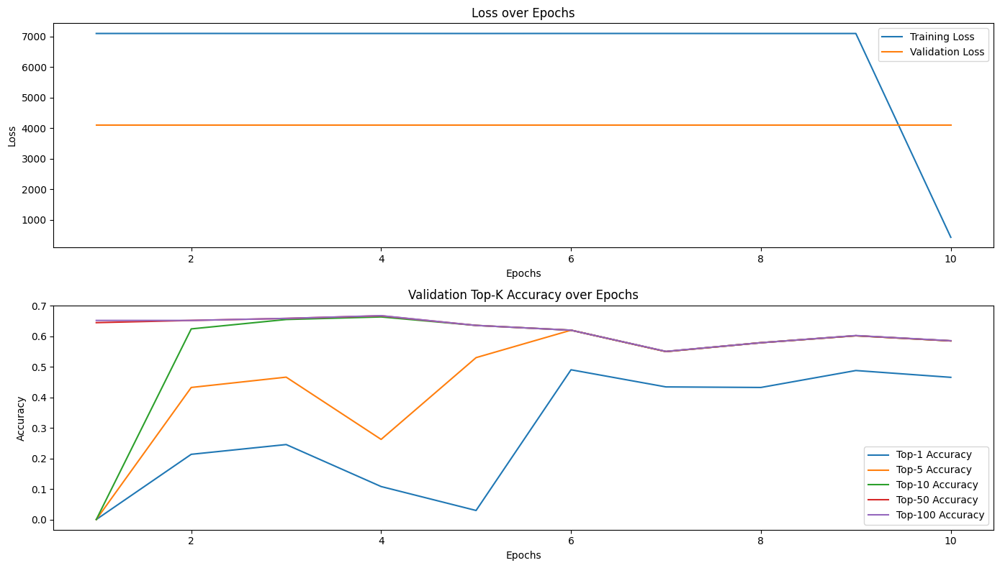

In [8]:
import matplotlib.pyplot as plt


# Plotting function
def plot_metrics(history):
    epochs = range(1, len(history["loss"]) + 1)

    plt.figure(figsize=(14, 8))

    # Plot Loss
    plt.subplot(2, 1, 1)
    plt.plot(epochs, history["loss"], label="Training Loss")
    plt.plot(epochs, history["val_loss"], label="Validation Loss")
    plt.title("Loss over Epochs")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()

    # Plot Top-K Accuracies
    plt.subplot(2, 1, 2)
    for k in [1, 5, 10, 50, 100]:
        metric = f"val_factorized_top_k/top_{k}_categorical_accuracy"
        plt.plot(epochs, history[metric], label=f"Top-{k} Accuracy")

    plt.title("Validation Top-K Accuracy over Epochs")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.tight_layout()
    plt.show()

# Call the function to plot
#plot_metrics(history)
plot_metrics(model_history.history)


In [14]:
query_df = train_df[QUERY_FEATURES]


In [9]:
user_batch = val_df.sample(1)
item_batch = item_df.sample(20)

user_input = {k: tf.constant(user_batch[k].values) for k in QUERY_FEATURES}
item_input = {k: tf.constant(item_batch[k].values) for k in CANDIDATE_FEATURES}

user_emb = model.query_model(user_input)
item_emb = model.item_model(item_input)

scores = tf.linalg.matmul(user_emb, item_emb, transpose_b=True)
print("Scores:", scores.numpy())


Scores: [[-0.00031465 -0.00031465 -0.00031465 -0.00031465 -0.00031465 -0.00031465
  -0.00031465 -0.00031465 -0.00031465 -0.00031465 -0.00031465 -0.00031465
  -0.00031465 -0.00031465 -0.00031465 -0.00031465 -0.00031465 -0.00031465
  -0.00031465 -0.00031465]]


In [ ]:
import hopsworks

project = hopsworks.login()
mr = project.get_model_registry()

In [11]:
import tensorflow as tf

# Connect to Hopsworks Model Registry
mr = project.get_model_registry()

# Create a wrapper module for the query model
class QueryModelModule(tf.Module):
    def __init__(self, query_model):
        self.query_model = query_model

    @tf.function()
    def compute_emb(self, instances):
        query_emb = self.query_model(instances)
        return {
            "user_id": instances["user_id"],
            "user_city": instances["user_city"],
            "age": instances["age"],
            "user_interests": instances["user_interests"],
            "query_emb": query_emb,
        }

# Wrap query_model
query_model = QueryModelModule(model.query_model)

In [ ]:

# Define features for query and candidate towers (retrieval model only)
QUERY_FEATURES = ["user_id", "user_city", "age", "user_interests"]
CANDIDATE_FEATURES = ["event_id", "title","event_type", "event_city"]

In [12]:
# Define the input specifications for the instances
instances_spec = {
    'user_id': tf.TensorSpec(shape=(None,), dtype=tf.string, name='user_id'),   # Specification for user IDs
    'user_city': tf.TensorSpec(shape=(None,), dtype=tf.string, name='user_city'),    # Specification for user city
    'user_interests': tf.TensorSpec(shape=(None,), dtype=tf.string, name='user_interests'), # Specification for user interests
    'age': tf.TensorSpec(shape=(None,), dtype=tf.int64, name='age'),              # Specification for age
}

# Get the concrete function for the query_model's compute_emb function using the specified input signatures
signatures = query_model.compute_emb.get_concrete_function(instances_spec)

# Save the query_model along with the concrete function signatures
tf.saved_model.save(
    query_model,           # The model to save
    "query_model",         # Path to save the model
    signatures=signatures, # Concrete function signatures to include
)

tf.saved_model.save(
    model.item_model,    # The model to save
    "candidate_model",   # Path to save the model
)

2025-05-21 12:47:33,469 INFO: Function `compute_emb` contains input name(s) table_handle, 43153, 43163, 43179, resource with unsupported characters which will be renamed to query_tower_sequential_string_lookup_none_lookup_lookuptablefindv2_table_handle, query_tower_embedding_2_embedding_lookup_43153, query_tower_sequential_1_embedding_1_embedding_lookup_43163, query_tower_sequential_embedding_embedding_lookup_43179, query_tower_sequential_2_dense_1_biasadd_readvariableop_resource in the SavedModel.
INFO:tensorflow:Assets written to: query_model/assets
2025-05-21 12:47:41,021 INFO: Assets written to: query_model/assets
INFO:tensorflow:Assets written to: candidate_model/assets
2025-05-21 12:47:44,098 INFO: Assets written to: candidate_model/assets


In [15]:
from hsml.schema import Schema
from hsml.model_schema import ModelSchema

query_df = train_df[QUERY_FEATURES]

# Infer input schema from data.
query_model_input_schema = Schema(query_df)

# Manually specify output schema.
query_model_output_schema = Schema([{
    "name": "query_embedding",
    "type": "float32",
    "shape": [EMBED_DIM],
}])

query_model_schema = ModelSchema(
    input_schema=query_model_input_schema,
    output_schema=query_model_output_schema,
)

query_model_schema.to_dict()

{'input_schema': {'columnar_schema': [{'name': 'user_id', 'type': 'object'},
   {'name': 'user_city', 'type': 'object'},
   {'name': 'age', 'type': 'int64'},
   {'name': 'user_interests', 'type': 'object'}]},
 'output_schema': {'tensor_schema': [{'name': 'query_embedding',
    'shape': '[32]',
    'type': 'float32'}]}}

In [16]:
# Sample a query example from the query DataFrame
query_example = query_df.sample().to_dict("records")

# Create a tensorflow model for the query_model in the Model Registry 
mr_query_model = mr.tensorflow.create_model(
    name="query_model",                                           # Name of the model
    description="Model that generates query embeddings from user features",  # Description of the model
    input_example=query_example,                                  # Example input for the model
    model_schema=query_model_schema,                              # Schema of the model
)

# Save the query_model to the Model Registry
mr_query_model.save("query_model")                                # Path to save the model

  0%|          | 0/6 [00:00<?, ?it/s]

Uploading /home/nkama/masters_thesis_project/thesis/notebooks/query_model/fingerprint.pb: 0.000%|          | 0…

Uploading /home/nkama/masters_thesis_project/thesis/notebooks/query_model/saved_model.pb: 0.000%|          | 0…

Uploading /home/nkama/masters_thesis_project/thesis/notebooks/query_model/variables/variables.index: 0.000%|  …

Uploading /home/nkama/masters_thesis_project/thesis/notebooks/query_model/variables/variables.data-00000-of-00…

Uploading /home/nkama/masters_thesis_project/thesis/notebooks/input_example.json: 0.000%|          | 0/106 ela…

Uploading /home/nkama/masters_thesis_project/thesis/notebooks/model_schema.json: 0.000%|          | 0/494 elap…

Model created, explore it at https://c.app.hopsworks.ai:443/p/1220788/models/query_model/1


Model(name: 'query_model', version: 1)

In [17]:
# Define the input schema for the candidate_model based on item_df
candidate_model_input_schema = Schema(item_df)

# Define the output schema for the candidate_model, specifying the shape and type of the output
candidate_model_output_schema = Schema([{
    "name": "candidate_embedding",   # Name of the output feature
    "type": "float32",               # Data type of the output feature
    "shape": [EMBED_DIM],              # Shape of the output feature
}])

# Combine the input and output schemas to create the overall model schema for the candidate_model
candidate_model_schema = ModelSchema(
    input_schema=candidate_model_input_schema,    # Input schema for the model
    output_schema=candidate_model_output_schema,  # Output schema for the model
)

# Sample a candidate example from the item DataFrame
candidate_example = item_df.sample().to_dict("records")

# Create a tensorflow model for the candidate_model in the Model Registry
mr_candidate_model = mr.tensorflow.create_model(
    name="candidate_model",                                        # Name of the model
    description="Model that generates candidate embeddings from video features",  # Description of the model
    input_example=candidate_example,                              # Example input for the model
    model_schema=candidate_model_schema,                          # Schema of the model
)

# Save the candidate_model to the Model Registry
mr_candidate_model.save("candidate_model")                        # Path to save the model

  0%|          | 0/6 [00:00<?, ?it/s]

Uploading /home/nkama/masters_thesis_project/thesis/notebooks/candidate_model/fingerprint.pb: 0.000%|         …

Uploading /home/nkama/masters_thesis_project/thesis/notebooks/candidate_model/saved_model.pb: 0.000%|         …

Uploading /home/nkama/masters_thesis_project/thesis/notebooks/candidate_model/variables/variables.index: 0.000…

Uploading /home/nkama/masters_thesis_project/thesis/notebooks/candidate_model/variables/variables.data-00000-o…

Uploading /home/nkama/masters_thesis_project/thesis/notebooks/input_example.json: 0.000%|          | 0/158 ela…

Uploading /home/nkama/masters_thesis_project/thesis/notebooks/model_schema.json: 0.000%|          | 0/499 elap…

Model created, explore it at https://c.app.hopsworks.ai:443/p/1220788/models/candidate_model/1


Model(name: 'candidate_model', version: 1)

In [ ]:
# import tensorflow as tf
# import numpy as np
# import pandas as pd
# import faiss
# import matplotlib.pyplot as plt
# from sklearn.metrics import precision_recall_curve, average_precision_score, roc_curve, auc
# query_model = model.query_model
# candidate_model = model.item_model
# # --- 1. Precompute item (candidate) embeddings ---
# CANDIDATE_FEATURES = ["event_id", "event_type", "event_city", "title"]

# def precompute_item_embeddings(item_model, item_df, batch_size=1024):
#     item_features = {
#         "event_id": item_df["event_id"].values,
#         "event_type": item_df["event_type"].values,
#         "event_city": item_df["event_city"].values,
#         "title": item_df["title"].values
#     }
#     ds = tf.data.Dataset.from_tensor_slices(item_features).batch(batch_size)
#     embeddings = []
#     for batch in ds:
#         emb = item_model(batch).numpy()
#         embeddings.append(emb)
#     item_embeddings = np.vstack(embeddings)
#     return item_embeddings

# # --- 2. Build Faiss index (cosine similarity via normalized dot product) ---
# def build_faiss_index(item_embeddings):
#     faiss.normalize_L2(item_embeddings)
#     index = faiss.IndexFlatIP(item_embeddings.shape[1])
#     index.add(item_embeddings)
#     return index

# # --- 3. Evaluate Recall@K on test set ---
# QUERY_FEATURES = ["user_id", "user_city", "age", "user_interests"]
# K_VALUES = [10, 50, 100, 1000]

# def get_user_embedding(query_model, user_row):
#     user_features = {
#         "user_id": np.array([user_row["user_id"]]),
#         "user_city": np.array([user_row["user_city"]]),
#         "age": np.array([user_row["age"]], dtype=np.float32),
#         "user_interests": np.array([user_row["user_interests"]])
#     }
#     emb = query_model(user_features).numpy()
#     faiss.normalize_L2(emb)
#     return emb

# def evaluate_model(query_model, test_df, faiss_index, item_embeddings, item_ids, item_df, k_values=K_VALUES):
#     hits_at_k = {k: 0 for k in k_values}
#     total = 0
#     all_scores = []
#     all_labels = []

#     for user_id, group in test_df.groupby('user_id'):
#         # 1) All events the user actually attended in test:
#         attended = set(group['event_id'].tolist())

#         # 2) All events in the catalog whose metadata matches at least one of the user's interest keywords:
#         user_interests = group.iloc[0]['user_interests'].split(",")
#         interest_matched = {
#             ev_id for ev_id, ev_cat in zip(item_df['event_id'], item_df['event_type'])
#             if any(interest.lower() in ev_cat.lower() for interest in user_interests)
#         }

#         # Union of the two sets:
#         actual_relevant = attended.union(interest_matched)

#         # Get user embedding
#         user_emb = get_user_embedding(query_model, group.iloc[0])

#         # Retrieve top max(k_values) items
#         D, I = faiss_index.search(user_emb, max(k_values))
#         recommended_ids = [item_ids[i] for i in I[0]]

#         for k in k_values:
#             # Check if all attended events are retrieved and if retrieved events match user interests
#             # We consider a hit if all attended events are in the top-k recommendations and at least one recommended event matches user interests
#             attended_in_top_k = attended.issubset(set(recommended_ids[:k]))
#             interest_in_top_k = any(ev in interest_matched for ev in recommended_ids[:k])
#             if attended_in_top_k or interest_in_top_k:
#                 hits_at_k[k] += 1

#         # For PR/ROC: positive and negatives
#         for event_id in actual_relevant:
#             if event_id in item_ids:
#                 actual_item_idx = item_ids.index(event_id)
#                 actual_item_embedding = item_embeddings[actual_item_idx]
#                 actual_score = np.dot(user_emb[0], actual_item_embedding)
#                 all_scores.append(actual_score)
#                 all_labels.append(1)

#                 neg_indices = np.random.choice(
#                     [i for i in range(len(item_embeddings)) if i != actual_item_idx],
#                     size=min(9, len(item_embeddings)-1),
#                     replace=False
#                 )
#                 for neg_idx in neg_indices:
#                     neg_score = np.dot(user_emb[0], item_embeddings[neg_idx])
#                     all_scores.append(neg_score)
#                     all_labels.append(0)

#         total += 1

#     recall_at_k = {k: hits_at_k[k] / len(actual_relevant) for k in k_values}
#     return recall_at_k, np.array(all_scores), np.array(all_labels)


# def plot_evaluation_metrics(recall_at_k, all_scores, all_labels):
#     fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5))
#     ax1.plot(list(recall_at_k.keys()), list(recall_at_k.values()), marker='o')
#     ax1.set_title('Recall@K')
#     ax1.set_xlabel('K')
#     ax1.set_ylabel('Recall')
#     ax1.grid(True)
#     precision, recall, _ = precision_recall_curve(all_labels, all_scores)
#     ap = average_precision_score(all_labels, all_scores)
#     ax2.plot(recall, precision, label=f'AP = {ap:.3f}')
#     ax2.set_title('Precision-Recall Curve')
#     ax2.set_xlabel('Recall')
#     ax2.set_ylabel('Precision')
#     ax2.legend()
#     ax2.grid(True)
#     fpr, tpr, _ = roc_curve(all_labels, all_scores)
#     roc_auc = auc(fpr, tpr)
#     ax3.plot(fpr, tpr, label=f'AUC = {roc_auc:.3f}')
#     ax3.plot([0, 1], [0, 1], 'k--')
#     ax3.set_title('ROC Curve')
#     ax3.set_xlabel('False Positive Rate')
#     ax3.set_ylabel('True Positive Rate')
#     ax3.legend()
#     ax3.grid(True)
#     plt.tight_layout()
#     plt.savefig('model_evaluation_metrics.png')
#     plt.show()
#     return fig


# def main():
#     # Assume you have train_df, val_df, test_df, query_model, candidate_model already in memory
#     # Prepare unique item DataFrame
#     item_df = train_df[CANDIDATE_FEATURES].drop_duplicates(subset="event_id").dropna()
#     item_ids = item_df["event_id"].tolist()
#     print(f"Found {len(item_df)} unique items for evaluation")
#     # Precompute item embeddings
#     print("Precomputing item embeddings...")
#     item_embeddings = precompute_item_embeddings(item_model, item_df)
#     # Build Faiss index
#     print("Building Faiss index...")
#     faiss_index = build_faiss_index(item_embeddings)
#     # Evaluate model
#     print("Evaluating model...")
#     recall_at_k, all_scores, all_labels = evaluate_model(
#         query_model, val_df, faiss_index, item_embeddings, item_ids, item_df
#     )
#     print("\nModel Evaluation Results:")
#     for k, recall in recall_at_k.items():
#         print(f"Recall@{k}: {recall:.4f}")
#     ap = average_precision_score(all_labels, all_scores)
#     print(f"Average Precision: {ap:.4f}")
#     fpr, tpr, _ = roc_curve(all_labels, all_scores)
#     roc_auc = auc(fpr, tpr)
#     print(f"ROC AUC: {roc_auc:.4f}")
#     plot_evaluation_metrics(recall_at_k, all_scores, all_labels)
#     # Sample recommendations
#     print("\nSample Recommendations:")
#     sample_user = val_df.iloc[10]
#     user_emb = get_user_embedding(query_model, sample_user)
#     D, I = faiss_index.search(user_emb, 500)
#     recommendations = [item_ids[i] for i in I[0]]
#     print(f"User: {sample_user['user_id']}")
#     print(f"User Interests: {sample_user['user_interests']}")
#     if sample_user['event_id'] in recommendations:
#         print("User in sequence - Position:", recommendations.index(sample_user['event_id']) + 1)
#     else:
#         print("user not in sequence")
#     print(f"Actual Interaction: {sample_user['event_id']}")
#     print(f"Top 5 Recommendations: {recommendations}")
#     return recall_at_k, all_scores, all_labels

# if __name__ == "__main__":
#     main()


In [ ]:
# # import tensorflow as tf
# # import numpy as np
# # import pandas as pd
# # import faiss
# # import matplotlib.pyplot as plt
# # from sklearn.metrics import precision_recall_curve, average_precision_score, roc_curve, auc

# # Load new test data
# users_df = pd.read_csv('/home/nkama/masters_thesis_project/thesis/partially_synthetic/data/main_data/users.csv')
# events_df = pd.read_csv("/home/nkama/masters_thesis_project/thesis/partially_synthetic/data/main_data/events.csv")
# interactions_df = pd.read_csv('/home/nkama/masters_thesis_project/thesis/partially_synthetic/data/main_data/interactions.csv')

# users_df.rename(columns={'location': 'user_city'}, inplace=True)

# # Drop the 'event_type' column first, then rename the remaining columns
# events_df.drop(columns=["event_type"], inplace=True)  # Use a list for consistency
# events_df.rename(columns={'city': 'event_city', 'category': 'event_type'}, inplace=True)




# # Merge user/event features into interactions
# interactions_df = interactions_df.merge(users_df, on="user_id", how="inner")
# interactions_df = interactions_df.merge(events_df, on="event_id", how="inner")
# print(interactions_df.columns)
# # # Feature sets
# # USER_FEATURES = ['user_id', 'gender', 'age', 'indoor_outdoor_preference', 'user_lat', 'user_lng', 'user_interests']
# # EVENT_FEATURES = ['event_id', 'category', 'title', 'event_type', 'event_lat', 'event_lng', 'hour', 'day_of_week', 'is_weekend']
# # string_cols = ['user_id', 'event_id', 'gender', 'indoor_outdoor_preference', 'category', 'title', 'event_type', 'user_interests']

# QUERY_FEATURES = ["user_id", "user_city", "age", "user_interests"]
# CANDIDATE_FEATURES = ["event_id", "event_city", "event_type", "title"]

# # Drop missing values
# #interactions_df = interactions_df.dropna()
# interactions_df = interactions_df[QUERY_FEATURES + CANDIDATE_FEATURES]
# #interactions_df = interactions_df.sample(n=50000, random_state=42)
# print(interactions_df.info())
# print(len(interactions_df))
# print(interactions_df["user_id"].nunique())
# print(interactions_df["event_id"].nunique())

# interactions_df["user_id"] = interactions_df["user_id"].astype(str)
# interactions_df["event_id"] = interactions_df["event_id"].astype(str)
# events_df["event_id"] = events_df["event_id"].astype(str)

# # def df_to_ds(df):
# #     return tf.data.Dataset.from_tensor_slices({
# #         col: tf.constant(df[col].values) for col in df.columns
# #     })


# # # Define features for query and candidate towers
# # QUERY_FEATURES = ["user_id", "user_city", "age", "user_interests"]
# # CANDIDATE_FEATURES = ["event_id", "event_city", "event_type", "title"]

# train_df = interactions_df.sample(frac=0.9, random_state=42)
# val_df = interactions_df.drop(train_df.index)





# # Build tf.data.Dataset with proper tensor shapes
# def df_to_ds(df):
#     return tf.data.Dataset.from_tensor_slices({
#         col: tf.constant(df[col].values) for col in df.columns
#     })

# # Create datasets with proper batching and shuffling
# train_ds = df_to_ds(train_df).batch(BATCH_SIZE).shuffle(BATCH_SIZE * 10)
# val_ds = df_to_ds(val_df).batch(BATCH_SIZE).cache()

# # Create item dataset with proper tensor shapes
# item_df = train_df[CANDIDATE_FEATURES].drop_duplicates(subset="event_id").dropna()
# item_ds = tf.data.Dataset.from_tensor_slices({
#     col: tf.constant(item_df[col].astype(str).values) for col in CANDIDATE_FEATURES
# })
# import tensorflow as tf
# import numpy as np
# import pandas as pd
# import faiss
# import matplotlib.pyplot as plt
# from sklearn.metrics import precision_recall_curve, average_precision_score, roc_curve, auc
# query_model = model.query_model
# candidate_model = model.item_model
# # --- 1. Precompute item (candidate) embeddings ---
# CANDIDATE_FEATURES = ["event_id", "event_type", "event_city", "title"]

# def precompute_item_embeddings(item_model, item_df, batch_size=1024):
#     item_features = {
#         "event_id": item_df["event_id"].values,
#         "event_type": item_df["event_type"].values,
#         "event_city": item_df["event_city"].values,
#         "title": item_df["title"].values
#     }
#     ds = tf.data.Dataset.from_tensor_slices(item_features).batch(batch_size)
#     embeddings = []
#     for batch in ds:
#         emb = item_model(batch).numpy()
#         embeddings.append(emb)
#     item_embeddings = np.vstack(embeddings)
#     return item_embeddings

# # --- 2. Build Faiss index (cosine similarity via normalized dot product) ---
# def build_faiss_index(item_embeddings):
#     faiss.normalize_L2(item_embeddings)
#     index = faiss.IndexFlatIP(item_embeddings.shape[1])
#     index.add(item_embeddings)
#     return index

# # --- 3. Evaluate Recall@K on test set ---
# QUERY_FEATURES = ["user_id", "user_city", "age", "user_interests"]
# K_VALUES = [10, 50, 100, 1000]

# def get_user_embedding(query_model, user_row):
#     user_features = {
#         "user_id": np.array([user_row["user_id"]]),
#         "user_city": np.array([user_row["user_city"]]),
#         "age": np.array([user_row["age"]], dtype=np.float32),
#         "user_interests": np.array([user_row["user_interests"]])
#     }
#     emb = query_model(user_features).numpy()
#     faiss.normalize_L2(emb)
#     return emb

# def evaluate_model(query_model, test_df, faiss_index, item_embeddings, item_ids, item_df, k_values=K_VALUES):
#     hits_at_k = {k: 0 for k in k_values}
#     total = 0
#     all_scores = []
#     all_labels = []

#     for user_id, group in test_df.groupby('user_id'):
#         # 1) All events the user actually attended in test:
#         attended = set(group['event_id'].tolist())

#         # 2) All events in the catalog whose metadata matches at least one of the user's interest keywords:
#         user_interests = group.iloc[0]['user_interests'].split(",")
#         interest_matched = {
#             ev_id for ev_id, ev_cat in zip(item_df['event_id'], item_df['event_type'])
#             if any(interest.lower() in ev_cat.lower() for interest in user_interests)
#         }

#         # Union of the two sets:
#         actual_relevant = attended.union(interest_matched)

#         # Get user embedding
#         user_emb = get_user_embedding(query_model, group.iloc[0])

#         # Retrieve top max(k_values) items
#         D, I = faiss_index.search(user_emb, max(k_values))
#         recommended_ids = [item_ids[i] for i in I[0]]

#         for k in k_values:
#             # Check if all attended events are retrieved and if retrieved events match user interests
#             # We consider a hit if all attended events are in the top-k recommendations and at least one recommended event matches user interests
#             attended_in_top_k = attended.issubset(set(recommended_ids[:k]))
#             interest_in_top_k = any(ev in interest_matched for ev in recommended_ids[:k])
#             if attended_in_top_k or interest_in_top_k:
#                 hits_at_k[k] += 1

#         # For PR/ROC: positive and negatives
#         for event_id in actual_relevant:
#             if event_id in item_ids:
#                 actual_item_idx = item_ids.index(event_id)
#                 actual_item_embedding = item_embeddings[actual_item_idx]
#                 actual_score = np.dot(user_emb[0], actual_item_embedding)
#                 all_scores.append(actual_score)
#                 all_labels.append(1)

#                 neg_indices = np.random.choice(
#                     [i for i in range(len(item_embeddings)) if i != actual_item_idx],
#                     size=min(9, len(item_embeddings)-1),
#                     replace=False
#                 )
#                 for neg_idx in neg_indices:
#                     neg_score = np.dot(user_emb[0], item_embeddings[neg_idx])
#                     all_scores.append(neg_score)
#                     all_labels.append(0)

#         total += 1

#     recall_at_k = {k: hits_at_k[k] / len(actual_relevant) for k in k_values}
#     return recall_at_k, np.array(all_scores), np.array(all_labels)


# def plot_evaluation_metrics(recall_at_k, all_scores, all_labels):
#     fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5))
#     ax1.plot(list(recall_at_k.keys()), list(recall_at_k.values()), marker='o')
#     ax1.set_title('Recall@K')
#     ax1.set_xlabel('K')
#     ax1.set_ylabel('Recall')
#     ax1.grid(True)
#     precision, recall, _ = precision_recall_curve(all_labels, all_scores)
#     ap = average_precision_score(all_labels, all_scores)
#     ax2.plot(recall, precision, label=f'AP = {ap:.3f}')
#     ax2.set_title('Precision-Recall Curve')
#     ax2.set_xlabel('Recall')
#     ax2.set_ylabel('Precision')
#     ax2.legend()
#     ax2.grid(True)
#     fpr, tpr, _ = roc_curve(all_labels, all_scores)
#     roc_auc = auc(fpr, tpr)
#     ax3.plot(fpr, tpr, label=f'AUC = {roc_auc:.3f}')
#     ax3.plot([0, 1], [0, 1], 'k--')
#     ax3.set_title('ROC Curve')
#     ax3.set_xlabel('False Positive Rate')
#     ax3.set_ylabel('True Positive Rate')
#     ax3.legend()
#     ax3.grid(True)
#     plt.tight_layout()
#     plt.savefig('model_evaluation_metrics.png')
#     plt.show()
#     return fig


# def main():
#     # Assume you have train_df, val_df, test_df, query_model, candidate_model already in memory
#     # Prepare unique item DataFrame
#     item_df = train_df[CANDIDATE_FEATURES].drop_duplicates(subset="event_id").dropna()
#     item_ids = item_df["event_id"].tolist()
#     print(f"Found {len(item_df)} unique items for evaluation")
#     # Precompute item embeddings
#     print("Precomputing item embeddings...")
#     item_embeddings = precompute_item_embeddings(item_model, item_df)
#     # Build Faiss index
#     print("Building Faiss index...")
#     faiss_index = build_faiss_index(item_embeddings)
#     # Evaluate model
#     print("Evaluating model...")
#     recall_at_k, all_scores, all_labels = evaluate_model(
#         query_model, val_df, faiss_index, item_embeddings, item_ids, item_df
#     )
#     print("\nModel Evaluation Results:")
#     for k, recall in recall_at_k.items():
#         print(f"Recall@{k}: {recall:.4f}")
#     ap = average_precision_score(all_labels, all_scores)
#     print(f"Average Precision: {ap:.4f}")
#     fpr, tpr, _ = roc_curve(all_labels, all_scores)
#     roc_auc = auc(fpr, tpr)
#     print(f"ROC AUC: {roc_auc:.4f}")
#     plot_evaluation_metrics(recall_at_k, all_scores, all_labels)
#     # Sample recommendations
#     print("\nSample Recommendations:")
#     sample_user = val_df.iloc[10]
#     user_emb = get_user_embedding(query_model, sample_user)
#     D, I = faiss_index.search(user_emb, 1000)
#     recommendations = [item_ids[i] for i in I[0]]
#     print(f"User: {sample_user['user_id']}")
#     print(f"User Interests: {sample_user['user_interests']}")
#     if sample_user['event_id'] in recommendations:
#         print("User in sequence - Position:", recommendations.index(sample_user['event_id']) + 1)
#     else:
#         print("user not in sequence")
#     print(f"Actual Interaction: {sample_user['event_id']}")
#     print(f"Top 5 Recommendations: {recommendations}")
#     return recall_at_k, all_scores, all_labels

# if __name__ == "__main__":
#     main()




In [ ]:
import tensorflow as tf
import numpy as np

def recommend_events_for_user(user_id, top_k=10):
    """
    Recommend top-k events for a specific user
    
    Args:
        user_id: The ID of the user to recommend events for
        top_k: Number of recommendations to return
        
    Returns:
        List of recommended event IDs with their scores
    """
    # Get user features
    user_data = users_df[users_df['user_id'] == user_id].iloc[0]
    
    # Prepare user input for the query tower
    user_input = {
        "user_id": tf.constant([str(user_id)]),
        "user_city": tf.constant([user_data['location']]),  # Assuming 'location' is the city field
        "age": tf.constant([user_data['age']], dtype=tf.float32),
        "user_interests": tf.constant([user_data['user_interests']])
    }
    
    # Get user embedding from query tower
    user_embedding = query_model(user_input)
    
    # Prepare all events data for the item tower
    events_data = events_df.copy()
    events_data["event_id"] = events_data["event_id"].astype(str)
    
    # Convert to TensorFlow dataset
    events_dataset = tf.data.Dataset.from_tensor_slices({
        "event_id": tf.constant(events_data["event_id"].values),
        "event_city": tf.constant(events_data["city"].values),  # Assuming 'city' is the city field
        "event_type": tf.constant(events_data["category"].values),  # Assuming 'category' is the event_type field
        "title": tf.constant(events_data["title"].values)
    }).batch(128)
    
    # Get embeddings for all events
    event_ids = []
    event_embeddings = []
    
    for batch in events_dataset:
        batch_embeddings = item_model(batch)
        event_ids.extend(batch["event_id"].numpy())
        event_embeddings.append(batch_embeddings.numpy())
    
    event_embeddings = np.vstack(event_embeddings)
    
    # Calculate similarity scores
    similarities = tf.matmul(
        user_embedding, 
        tf.transpose(event_embeddings)
    ).numpy()[0]
    
    # Get top-k events
    top_indices = np.argsort(similarities)[-top_k:][::-1]
    
    # Return event IDs with their scores
    recommendations = [
        {"event_id": event_ids[idx], "score": float(similarities[idx])}
        for idx in top_indices
    ]
    
    return recommendations

# Example usage
recommended_events = recommend_events_for_user("user_123", top_k=5)
print("Recommended events:", recommended_events)

# Get full details of recommended events
recommended_event_ids = [rec["event_id"] for rec in recommended_events]
recommended_events_details = events_df[events_df["event_id"].astype(str).isin(recommended_event_ids)]
print(recommended_events_details)

---

# Model implementation to compare with baseline models

Unnamed: 0                 0
user_id                    0
event_id                   0
interaction_type           0
distance_to_event          0
interaction_label          0
event_weather_condition    0
event_temperature          0
event_precipitation_sum    0
user_weather_condition     0
user_temperature           0
user_precipitation         0
dtype: int64
Sample user_id in interactions data after conversion: ['3468617687', '487910947', '2769572227', '2974942354', '3468617687']
Sample user_id in users data after conversion: ['3197468391', '1091720544', '3341263967', '1363661070', '3104149470']

First 10 user IDs in interactions_df: ['1000957666', '1002026815', '1002319016', '1002366476', '1003737814', '1003911464', '1004675047', '1005100691', '1005787999', '1007165855']
First 10 user IDs in users_df: ['1000957666', '1002026815', '1002319016', '1002366476', '1003737814', '1003911464', '1004675047', '1005100691', '1005787999', '1007165855']
Number of common users: 5315
First 10 common 

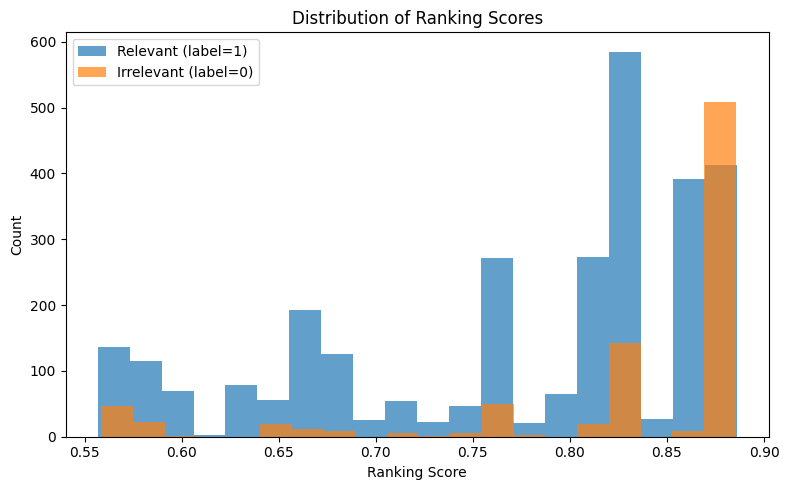


Evaluation Results:
Total users evaluated: 5315
Users with successful evaluation: 1187

Hits@K:
Hits@1: 0.2149
Hits@5: 0.0282
Hits@10: 0.0124
Hits@50: 0.0004
Hits@100: 0.0000

Recall@K:
Recall@1: 0.4086
Recall@5: 0.1091
Recall@10: 0.1157
Recall@50: 0.0998
Recall@100: 0.0000

Precision@K:
Precision@1: 0.9621
Precision@5: 0.9404
Precision@10: 0.9682
Precision@50: 0.8700
Precision@100: 0.0000

NDCG@K:
NDCG@1: 0.9621
NDCG@5: 0.9805
NDCG@10: 0.9845
NDCG@50: 0.9487
NDCG@100: 0.0000

MRR: 0.9675
Average Precision: 0.6591
ROC AUC: 0.2873


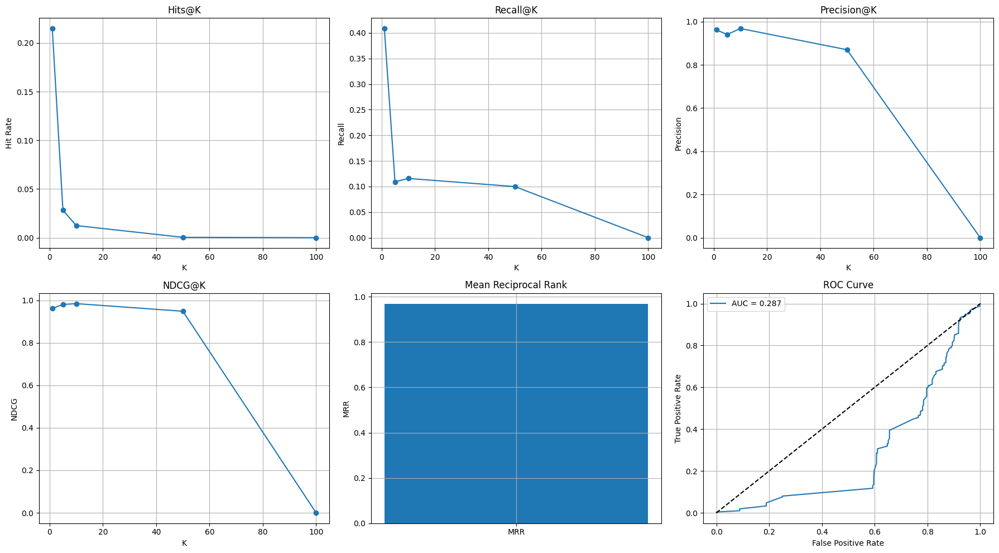


Evaluating Integrated Retrieval-Ranking Pipeline (No-Weather Model)

=== Evaluating Integrated Retrieval-Ranking Pipeline ===
Processed 100 users successfully
Processed 200 users successfully
Processed 300 users successfully
Processed 400 users successfully
Processed 500 users successfully
Processed 600 users successfully
Processed 700 users successfully
Processed 800 users successfully
Processed 900 users successfully
Processed 1000 users successfully
Processed 1100 users successfully
Processed 1200 users successfully
Processed 1300 users successfully
Processed 1400 users successfully
Processed 1500 users successfully
Processed 1600 users successfully
Processed 1700 users successfully
Processed 1800 users successfully
Processed 1900 users successfully


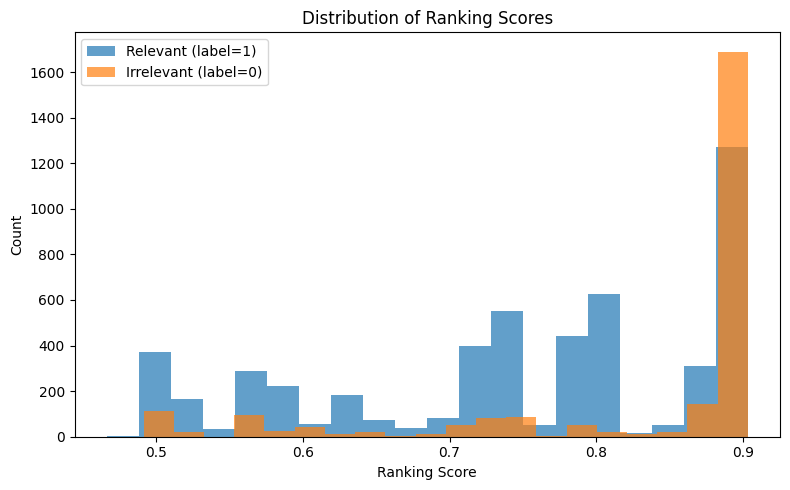


Evaluation Results:
Total users evaluated: 5315
Users with successful evaluation: 1932

Hits@K:
Hits@1: 0.3490
Hits@5: 0.0389
Hits@10: 0.0214
Hits@50: 0.0017
Hits@100: 0.0000

Recall@K:
Recall@1: 0.4447
Recall@5: 0.1388
Recall@10: 0.1351
Recall@50: 0.1497
Recall@100: 0.0000

Precision@K:
Precision@1: 0.9601
Precision@5: 0.9385
Precision@10: 0.9456
Precision@50: 0.9622
Precision@100: 0.0000

NDCG@K:
NDCG@1: 0.9601
NDCG@5: 0.9722
NDCG@10: 0.9718
NDCG@50: 0.9927
NDCG@100: 0.0000

MRR: 0.9678
Average Precision: 0.5435
ROC AUC: 0.2735


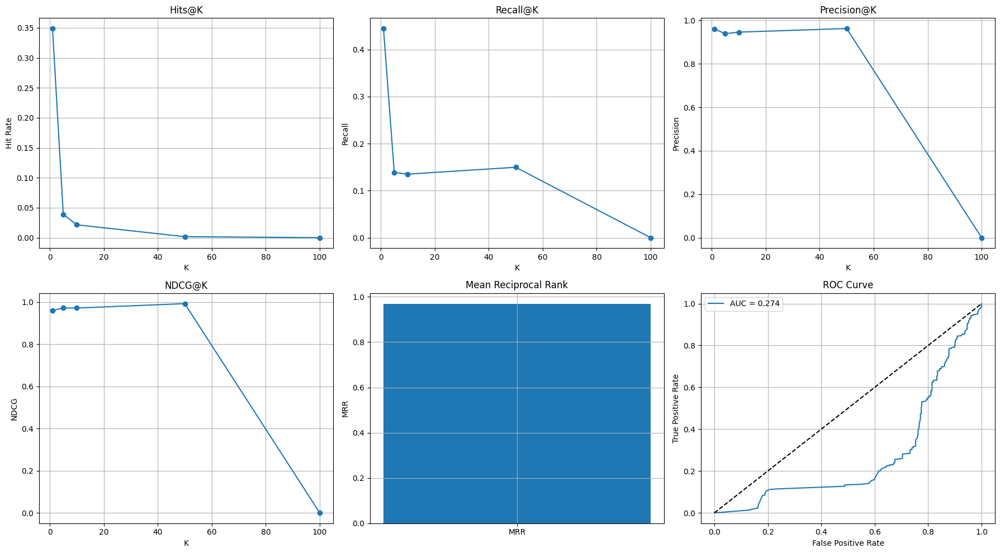


Comparison of Integrated Pipelines:
Weather Model MRR: 0.9675
No-Weather Model MRR: 0.9678
Weather features decrease MRR by 0.02%

Evaluation pipeline complete!


,hits_at_k,recall_at_k,precision_at_k,ndcg_at_k,mrr,average_precision,roc_auc,total_users,successful_users
hits_at_k,NaN,NaN,NaN,NaN,0.967545,0.659124,0.28733,5315,1187
recall_at_k,NaN,NaN,NaN,NaN,0.967545,0.659124,0.28733,5315,1187
precision_at_k,NaN,NaN,NaN,NaN,0.967545,0.659124,0.28733,5315,1187
ndcg_at_k,NaN,NaN,NaN,NaN,0.967545,0.659124,0.28733,5315,1187
mrr,NaN,NaN,NaN,NaN,0.967545,0.659124,0.28733,5315,1187
average_precision,NaN,NaN,NaN,NaN,0.967545,0.659124,0.28733,5315,1187
roc_auc,NaN,NaN,NaN,NaN,0.967545,0.659124,0.28733,5315,1187
total_users,NaN,NaN,NaN,NaN,0.967545,0.659124,0.28733,5315,1187
successful_users,NaN,NaN,NaN,NaN,0.967545,0.659124,0.28733,5315,1187


In [43]:
import tensorflow as tf
import numpy as np
import pandas as pd
import faiss
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, average_precision_score, roc_curve, auc
from catboost import CatBoostClassifier, Pool
import joblib
import math
from datetime import datetime

# --- Data loading and renaming (as in your paste.txt) ---


# Load data
users_df = pd.read_csv('/home/nkama/masters_thesis_project/thesis/partially_synthetic/notebooks/test_users_data.csv')
events_df = pd.read_csv("/home/nkama/masters_thesis_project/thesis/partially_synthetic/notebooks/test_events_data.csv")
interactions_df = pd.read_csv('/home/nkama/masters_thesis_project/thesis/partially_synthetic/notebooks/test_interactions_data.csv')
print(interactions_df.isnull().sum())

# Renaming columns in users_df
users_df.rename(columns={
    'lat': 'user_lat',
    'lng': 'user_lon',
    'location': 'user_city',
    'indoor_outdoor_preference': 'user_weather_preference',
    'joinedAt': 'signup_date'
}, inplace=True)

# Renaming columns in events_df
events_df.rename(columns={
    'category': 'event_type',
    'lat': 'event_lat',
    'lng': 'event_lon',
    'city': 'event_city',
    'weather_description': 'weather_condition',
    'temperature_2m_mean': 'temperature'
}, inplace=True)

# Renaming columns in interactions_df
interactions_df.rename(columns={
    'distance_to_event': 'interaction_distance_to_event'
}, inplace=True)

def safe_id_convert(x):
    if x is None:
        return "unknown"
    if isinstance(x, float):
        if math.isnan(x):
            return "unknown"
        else:
            return str(int(x))
    try:
        return str(int(float(x)))
    except Exception:
        return "unknown"

# Apply safe conversion
users_df["user_id"] = users_df["user_id"].apply(safe_id_convert)
events_df["event_id"] = events_df["event_id"].apply(safe_id_convert)
interactions_df["user_id"] = interactions_df["user_id"].apply(safe_id_convert)
interactions_df["event_id"] = interactions_df["event_id"].apply(safe_id_convert)

# Remove rows with unknown IDs to avoid mismatches
users_df = users_df[users_df["user_id"] != "unknown"]
events_df = events_df[events_df["event_id"] != "unknown"]
interactions_df = interactions_df[
    (interactions_df["user_id"] != "unknown") & (interactions_df["event_id"] != "unknown")
]

# Verify conversion
print("Sample user_id in interactions data after conversion:", interactions_df["user_id"].head().tolist())
print("Sample user_id in users data after conversion:", users_df["user_id"].head().tolist())

# Print the first few user IDs from each dataset to compare
print("\nFirst 10 user IDs in interactions_df:", sorted(list(interactions_df["user_id"].unique()))[:10])
print("First 10 user IDs in users_df:", sorted(list(users_df["user_id"].unique()))[:10])

# Check intersection properly
common_users = set(interactions_df["user_id"]).intersection(set(users_df["user_id"]))
print(f"Number of common users: {len(common_users)}")
print("First 10 common user IDs:", sorted(list(common_users))[:10])

# Filter interactions to only include users that exist in the users dataset
interactions_df = interactions_df[interactions_df["user_id"].isin(common_users)]
print(f"Filtered interactions with valid users: {len(interactions_df)}")

# Check intersection of event IDs
common_events = set(interactions_df["event_id"]).intersection(set(events_df["event_id"]))
print(f"Number of common events: {len(common_events)}")
print("First 10 common event IDs:", sorted(list(common_events))[:10])

# Filter interactions to only include events that exist in the events dataset
interactions_df = interactions_df[interactions_df["event_id"].isin(common_events)]
print(f"Filtered interactions with valid events: {len(interactions_df)}")

# Define feature sets
QUERY_FEATURES = ["user_id", "user_city", "age", "user_interests"]
CANDIDATE_FEATURES = ["event_id", "event_city", "event_type", "title"]

# Define features for ranking models
NO_WEATHER_SELECTED_FEATURES =['interaction_distance_to_event', 'event_type', 'event_city',
       'attendance_rate', 'event_indoor_capability', 'user_city', 'age',
       'user_interests']

WEATHER_SELECTED_FEATURES =['interaction_distance_to_event', 'event_type', 'event_city', 
       'weather_condition', 'temperature', 'attendance_rate',
       'event_indoor_capability', 'user_city', 'user_weather_preference',
       'age', 'user_interests']

# Print data info
print(f"Users: {len(users_df)}, Events: {len(events_df)}, Interactions: {len(interactions_df)}")
print(f"Unique users: {interactions_df['user_id'].nunique()}")
print(f"Unique events: {interactions_df['event_id'].nunique()}")

# Split data for evaluation
test_interactions = interactions_df.sample(frac=1.0, random_state=42)
print(f"Test interactions: {len(test_interactions)}")

# --- Helper functions ---

def get_user_embeddings(query_model, user_ids):
    batch_users = users_df[users_df['user_id'].isin(user_ids)]
    if batch_users.empty:
        print(f"Warning: No users found for IDs: {user_ids}")
        return None
    batch_input = {
        "user_id": tf.constant(batch_users['user_id'].values),
        "user_city": tf.constant(batch_users['user_city'].values),
        "age": tf.constant(batch_users['age'].values, dtype=tf.float32),
        "user_interests": tf.constant(batch_users['user_interests'].values)
    }
    return query_model(batch_input).numpy()

def get_event_embeddings(candidate_model, events_data=None):
    if events_data is None:
        events_data = events_df.copy()
    events_dataset = tf.data.Dataset.from_tensor_slices({
        "event_id": tf.constant(events_data["event_id"].values),
        "event_city": tf.constant(events_data["event_city"].values),
        "event_type": tf.constant(events_data["event_type"].values),
        "title": tf.constant(events_data["title"].values)
    }).batch(128)
    event_ids = []
    event_embeddings = []
    for batch in events_dataset:
        batch_embeddings = candidate_model(batch)
        event_ids.extend(batch["event_id"].numpy())
        event_embeddings.append(batch_embeddings.numpy())
    return np.vstack(event_embeddings), event_ids

def build_faiss_index(embeddings):
    faiss.normalize_L2(embeddings)
    d = embeddings.shape[1]
    index = faiss.IndexFlatIP(d)
    index.add(embeddings)
    return index

# --- Robust weather match scoring ---

def compute_weather_match(user_weather, event_weather, user_pref, event_type_val, user_temp, event_temp, user_precip, event_precip):
    score = 0.0
    # Weather group match (0.4)
    if user_weather == event_weather:
        score += 0.4
    elif (user_weather in ['Sunny', 'Cloudy', 'Clear', 'Partly Cloudy'] and event_weather in ['Sunny', 'Cloudy', 'Clear', 'Partly Cloudy']):
        score += 0.2
    elif (user_weather in ['Rain', 'Light Drizzle', 'Heavy Rain', 'Thunderstorm'] and event_weather in ['Rain', 'Light Drizzle', 'Heavy Rain', 'Thunderstorm']):
        score += 0.2
    # Indoor/outdoor preference match (0.3)
    if user_pref == 'any':
        score += 0.3
    elif (user_pref == 'indoor' and event_type_val in ['Indoor', 'Hybrid']) or (user_pref == 'outdoor' and event_type_val in ['Outdoor', 'Hybrid']):
        score += 0.3
    # Temperature and precipitation compatibility (0.3)
    temp_diff = abs(user_temp - event_temp)
    precip_diff = abs(user_precip - event_precip)
    temp_score = max(0, 1 - (temp_diff / 20))
    precip_score = max(0, 1 - (precip_diff / 10))
    score += 0.3 * (0.6 * temp_score + 0.4 * precip_score)
    return round(score, 2)

def post_retrieval_filtering(candidates_df, user_context, filter_weather=True, filter_time=True, max_distance_km=500, weather_score_threshold=0.5):
    if filter_time and 'start_time' in candidates_df.columns:
        now = pd.Timestamp.now(tz='UTC')
        candidates_df = candidates_df[
            pd.to_datetime(candidates_df['start_time'], utc=True) > now
        ]
    # Location proximity filtering
    if 'interaction_distance_to_event' in candidates_df.columns:
        candidates_df = candidates_df[candidates_df['interaction_distance_to_event'] <= max_distance_km]
    # Weather filtering
    if filter_weather:
        scores = []
        for _, event in candidates_df.iterrows():
            score = compute_weather_match(
                user_context.get('user_weather_condition', 'any'),
                event.get('weather_condition', 'unknown'),
                user_context.get('user_weather_preference', 'any'),
                event.get('event_type', 'unknown'),
                user_context.get('user_temperature', 20),
                event.get('temperature', 20),
                user_context.get('user_precipitation', 0),
                event.get('precipitation_sum', 0)
            )
            scores.append(score)
        candidates_df = candidates_df.assign(weather_match_score=scores)
        candidates_df = candidates_df[candidates_df['weather_match_score'] >= weather_score_threshold]
    return candidates_df

# --- Main retrieval-ranking pipeline with filtering ---

def integrated_retrieval_ranking_pipeline(
    query_model, candidate_model, ranking_model, test_interactions, feature_list, 
    k_retrieval=100, max_k=100, filter_weather=True, filter_time=True, max_distance_km=5000, weather_score_threshold=0.5
):
    print("\n=== Evaluating Integrated Retrieval-Ranking Pipeline ===")
    event_embeddings, event_ids_bytes = get_event_embeddings(candidate_model)
    event_ids = [eid.decode('utf-8') if isinstance(eid, bytes) else str(eid) for eid in event_ids_bytes]
    faiss_index = build_faiss_index(event_embeddings)
    hits_at_k = {k: 0 for k in [1, 5, 10, 50, 100]}
    ndcg_at_k = {k: [] for k in [1, 5, 10, 50, 100]}
    recall_at_k = {k: [] for k in [1, 5, 10, 50, 100]}
    precision_at_k = {k: [] for k in [1, 5, 10, 50, 100]}
    mrr = []
    total_users = 0
    successful_users = 0
    all_scores = []
    all_labels = []
    user_groups = test_interactions.groupby('user_id')
    for user_id, group in user_groups:
        try:
            total_users += 1
            attended_events = set(group[group['interaction_label'] == 1]['event_id'].tolist())
            if not attended_events:
                continue
            user_embedding = get_user_embeddings(query_model, [user_id])
            if user_embedding is None or len(user_embedding) == 0:
                continue
            faiss.normalize_L2(user_embedding)
            distances, indices = faiss_index.search(user_embedding, k_retrieval)
            retrieved_indices = indices[0]
            retrieved_event_ids = [event_ids[idx] for idx in retrieved_indices]
            retrieved_events_df = events_df[events_df['event_id'].isin(retrieved_event_ids)].copy()
            if retrieved_events_df.empty:
                continue
            user_data = users_df[users_df['user_id'] == user_id].iloc[0]
            # Add contextual columns from interactions_df if available
            merged = pd.merge(
                retrieved_events_df,
                interactions_df[interactions_df['user_id'] == user_id][['event_id', 'interaction_distance_to_event']],
                on='event_id', how='inner'
            )
            # Fill missing distances with mean
            merged['interaction_distance_to_event'] = merged['interaction_distance_to_event'].fillna(interactions_df['interaction_distance_to_event'].mean())
            # Post-retrieval filtering
            user_context = {
                'user_weather_condition': group['user_weather_condition'].iloc[0] if 'user_weather_condition' in group.columns else 'any',
                'user_weather_preference': user_data.get('user_weather_preference', 'any'),
                'user_temperature': group['user_temperature'].iloc[0] if 'user_temperature' in group.columns else 20,
                'user_precipitation': group['user_precipitation'].iloc[0] if 'user_precipitation' in group.columns else 0,
                'user_interests': user_data['user_interests'],
                'user_city': user_data['user_city'],
                'age': user_data['age']
            }
            filtered_candidates = post_retrieval_filtering(
                merged, user_context,
                filter_weather=filter_weather,
                filter_time=filter_time,
                max_distance_km=max_distance_km,
                weather_score_threshold=weather_score_threshold
            )
            if filtered_candidates.empty:
                continue
            ranking_data = []
            for _, event in filtered_candidates.iterrows():
                row = {
                    'event_id': event['event_id'],
                    'event_type': event['event_type'],
                    'event_city': event['event_city'],
                    'attendance_rate': event['attendance_rate'],
                    'event_indoor_capability': event['event_indoor_capability'],
                    'user_city': user_data['user_city'],
                    'age': user_data['age'],
                    'user_interests': user_data['user_interests']
                }
                if 'weather_condition' in feature_list:
                    row['weather_condition'] = event['weather_condition']
                    row['temperature'] = event['temperature']
                    row['user_weather_preference'] = user_data['user_weather_preference']
                row['interaction_distance_to_event'] = event['interaction_distance_to_event']
                ranking_data.append(row)
            ranking_df = pd.DataFrame(ranking_data)
            for feat in feature_list:
                if feat not in ranking_df.columns:
                    if feat in ['user_interests', 'event_type', 'event_city', 'user_city', 'user_weather_preference', 'weather_condition']:
                        ranking_df[feat] = 'unknown'
                    elif feat in ['interaction_distance_to_event', 'temperature', 'attendance_rate']:
                        ranking_df[feat] = 0.0
                    elif feat == 'age':
                        ranking_df[feat] = 30
                    elif feat == 'event_indoor_capability':
                        ranking_df[feat] = True
            text_cols = ["title", "user_interests"]
            ranking_features = ranking_df[feature_list].drop(columns=[c for c in text_cols if c in ranking_df.columns])
            for col in ranking_features.columns:
                if ranking_features[col].dtype == 'object':
                    ranking_features[col] = ranking_features[col].fillna('unknown')
                elif ranking_features[col].dtype in ['float64', 'float32']:
                    ranking_features[col] = ranking_features[col].fillna(0.0)
                elif ranking_features[col].dtype in ['int64', 'int32']:
                    ranking_features[col] = ranking_features[col].fillna(0)
                elif ranking_features[col].dtype == 'bool':
                    ranking_features[col] = ranking_features[col].fillna(False)
            cat_features = ranking_features.select_dtypes(include=["object", "bool"]).columns.tolist()
            ranking_pool = Pool(data=ranking_features, cat_features=cat_features)
            ranking_scores = ranking_model.predict_proba(ranking_pool)[:, 1]
            ranked_results = pd.DataFrame({'event_id': ranking_df['event_id'], 'ranking_score': ranking_scores})
            ranked_results.sort_values('ranking_score', ascending=False, inplace=True)
            final_recommendation_ids = ranked_results['event_id'].tolist()[:max_k]
            # Calculate metrics for each K
            for k in hits_at_k.keys():
                if k > len(final_recommendation_ids):
                    continue
                top_k = set(final_recommendation_ids[:k])
                hits = len(top_k.intersection(attended_events))
                hits_at_k[k] += 1 if hits > 0 else 0
                recall_at_k[k].append(hits / len(attended_events))
                precision_at_k[k].append(hits / k)
                relevance = [1 if eid in attended_events else 0 for eid in final_recommendation_ids[:k]]
                dcg = sum(rel / np.log2(i + 2) for i, rel in enumerate(relevance))
                ideal_relevance = sorted(relevance, reverse=True)
                idcg = sum(rel / np.log2(i + 2) for i, rel in enumerate(ideal_relevance))
                ndcg = dcg / idcg if idcg > 0 else 0
                ndcg_at_k[k].append(ndcg)
            # MRR
            mrr_score = 0
            for i, eid in enumerate(final_recommendation_ids):
                if eid in attended_events:
                    mrr_score = 1.0 / (i + 1)
                    break
            mrr.append(mrr_score)
            # For precision-recall and ROC
            for eid in attended_events:
                if eid in ranked_results['event_id'].values:
                    idx = ranked_results[ranked_results['event_id'] == eid].index[0]
                    score = ranked_results.loc[idx, 'ranking_score']
                    all_scores.append(score)
                    all_labels.append(1)
                    negs = [e for e in ranked_results['event_id'] if e not in attended_events][:9]
                    for neg in negs:
                        neg_idx = ranked_results[ranked_results['event_id'] == neg].index[0]
                        all_scores.append(ranked_results.loc[neg_idx, 'ranking_score'])
                        all_labels.append(0)
            successful_users += 1
            if successful_users % 100 == 0:
                print(f"Processed {successful_users} users successfully")
        except Exception as e:
            print(f"Error processing user {user_id}: {e}")
            continue
    plt.figure(figsize=(8,5))
    plt.hist(np.array(all_scores)[np.array(all_labels)==1], bins=20, alpha=0.7, label='Relevant (label=1)')
    plt.hist(np.array(all_scores)[np.array(all_labels)==0], bins=20, alpha=0.7, label='Irrelevant (label=0)')
    plt.xlabel('Ranking Score')
    plt.ylabel('Count')
    plt.title('Distribution of Ranking Scores')
    plt.legend()
    plt.tight_layout()
    plt.show()

        
    hits_at_k = {k: hits / total_users for k, hits in hits_at_k.items()}
    recall_at_k = {k: np.mean(vals) if vals else 0 for k, vals in recall_at_k.items()}
    precision_at_k = {k: np.mean(vals) if vals else 0 for k, vals in precision_at_k.items()}
    ndcg_at_k = {k: np.mean(vals) if vals else 0 for k, vals in ndcg_at_k.items()}
    mrr_avg = np.mean(mrr) if mrr else 0
    print("\nEvaluation Results:")
    print(f"Total users evaluated: {total_users}")
    print(f"Users with successful evaluation: {successful_users}")
    print("\nHits@K:")
    for k, v in hits_at_k.items():
        print(f"Hits@{k}: {v:.4f}")
    print("\nRecall@K:")
    for k, v in recall_at_k.items():
        print(f"Recall@{k}: {v:.4f}")
    print("\nPrecision@K:")
    for k, v in precision_at_k.items():
        print(f"Precision@{k}: {v:.4f}")
    print("\nNDCG@K:")
    for k, v in ndcg_at_k.items():
        print(f"NDCG@{k}: {v:.4f}")
    print(f"\nMRR: {mrr_avg:.4f}")
    if all_scores:
        ap = average_precision_score(all_labels, all_scores)
        fpr, tpr, _ = roc_curve(all_labels, all_scores)
        roc_auc = auc(fpr, tpr)
        print(f"Average Precision: {ap:.4f}")
        print(f"ROC AUC: {roc_auc:.4f}")
    else:
        ap = None
        roc_auc = None
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    axes[0, 0].plot(list(hits_at_k.keys()), list(hits_at_k.values()), marker='o')
    axes[0, 0].set_title('Hits@K')
    axes[0, 0].set_xlabel('K')
    axes[0, 0].set_ylabel('Hit Rate')
    axes[0, 0].grid(True)
    axes[0, 1].plot(list(recall_at_k.keys()), list(recall_at_k.values()), marker='o')
    axes[0, 1].set_title('Recall@K')
    axes[0, 1].set_xlabel('K')
    axes[0, 1].set_ylabel('Recall')
    axes[0, 1].grid(True)
    axes[0, 2].plot(list(precision_at_k.keys()), list(precision_at_k.values()), marker='o')
    axes[0, 2].set_title('Precision@K')
    axes[0, 2].set_xlabel('K')
    axes[0, 2].set_ylabel('Precision')
    axes[0, 2].grid(True)
    axes[1, 0].plot(list(ndcg_at_k.keys()), list(ndcg_at_k.values()), marker='o')
    axes[1, 0].set_title('NDCG@K')
    axes[1, 0].set_xlabel('K')
    axes[1, 0].set_ylabel('NDCG')
    axes[1, 0].grid(True)
    axes[1, 1].bar(['MRR'], [mrr_avg])
    axes[1, 1].set_title('Mean Reciprocal Rank')
    axes[1, 1].set_ylabel('MRR')
    axes[1, 1].grid(True)
    if all_scores:
        axes[1, 2].plot(fpr, tpr, label=f'AUC = {roc_auc:.3f}')
        axes[1, 2].plot([0, 1], [0, 1], 'k--')
        axes[1, 2].set_title('ROC Curve')
        axes[1, 2].set_xlabel('False Positive Rate')
        axes[1, 2].set_ylabel('True Positive Rate')
        axes[1, 2].legend()
        axes[1, 2].grid(True)
    else:
        axes[1, 2].axis('off')
    plt.tight_layout()
    plt.savefig('integrated_pipeline_evaluation.png')
    plt.show()
    import plotly.graph_objects as go

    # Prepare summary metrics for bar plot
    metrics = []
    values = []

    # Add Hits@K, Recall@K, Precision@K, NDCG@K
    for k in [1, 5, 10, 50, 100]:
        metrics.append(f"Hits@{k}")
        values.append(hits_at_k[k])
        metrics.append(f"Recall@{k}")
        values.append(recall_at_k[k])
        metrics.append(f"Precision@{k}")
        values.append(precision_at_k[k])
        metrics.append(f"NDCG@{k}")
        values.append(ndcg_at_k[k])

    # Add MRR, MAP, AUC
    metrics.append("MRR")
    values.append(mrr_avg)
    if ap is not None:
        metrics.append("MAP@10")
        values.append(ap)
    if roc_auc is not None:
        metrics.append("AUC")
        values.append(roc_auc)

    # Create Plotly bar plot
    fig = go.Figure(data=[go.Bar(x=metrics, y=values, marker_color='indianred')])
    fig.update_layout(
        title='Summary Bar Plot of Recommendation Metrics',
        xaxis_title='Metric',
        yaxis_title='Value',
        yaxis=dict(range=[0, 1.05]),
        template='simple_white'
    )
    fig.show()


    return {
        "hits_at_k": hits_at_k,
        "recall_at_k": recall_at_k,
        "precision_at_k": precision_at_k,
        "ndcg_at_k": ndcg_at_k,
        "mrr": mrr_avg,
        "average_precision": ap,
        "roc_auc": roc_auc,
        "total_users": total_users,
        "successful_users": successful_users
    }


def main():
    print("Starting evaluation pipeline for retrieval and ranking models...")
    print(f"Current date: Wednesday, May 14, 2025, 1:03 PM CEST")
    print("=" * 50)
    # Load models (replace with your actual model loading code)
    query_model =model.query_model
    candidate_model = model.item_model
    weather_model = joblib.load("/home/nkama/masters_thesis_project/thesis/models/weather_ranking_model.pkl")
    no_weather_model = joblib.load("/home/nkama/masters_thesis_project/thesis/models/no_weather_ranking_model_2.pkl")
    print("\nEvaluating Integrated Retrieval-Ranking Pipeline (Weather Model)")
    weather_results = integrated_retrieval_ranking_pipeline(
        query_model,
        candidate_model,
        weather_model,
        test_interactions,
        WEATHER_SELECTED_FEATURES,
        k_retrieval=1000,
        max_k=100,
        filter_weather=True,
        filter_time=False
    )
    print("\nEvaluating Integrated Retrieval-Ranking Pipeline (No-Weather Model)")
    no_weather_results = integrated_retrieval_ranking_pipeline(
        query_model,
        candidate_model,
        no_weather_model,
        test_interactions,
        NO_WEATHER_SELECTED_FEATURES,
        k_retrieval=1000,
        max_k=100,
        filter_weather=False,  # No weather filtering
        filter_time=False
    )
    print("\nComparison of Integrated Pipelines:")
    print(f"Weather Model MRR: {weather_results['mrr']:.4f}")
    print(f"No-Weather Model MRR: {no_weather_results['mrr']:.4f}")
    if weather_results["mrr"] > no_weather_results["mrr"]:
        improvement = ((weather_results["mrr"] - no_weather_results["mrr"]) / no_weather_results["mrr"]) * 100
        print(f"Weather features improve MRR by {improvement:.2f}%")
    else:
        diff = ((no_weather_results["mrr"] - weather_results["mrr"]) / weather_results["mrr"]) * 100
        print(f"Weather features decrease MRR by {diff:.2f}%")
    print("\nEvaluation pipeline complete!")
    results = pd.DataFrame(weather_results, weather_results)
    results.to_csv("retriever-filtering-ranking-results.csv")
    display(results)
if __name__ == "__main__":
    main()


# Implementation with added inerest match filter

## calculating actual relevance for both weather and non-weather implementations.

Unnamed: 0                 0
user_id                    0
event_id                   0
interaction_type           0
distance_to_event          0
interaction_label          0
event_weather_condition    0
event_temperature          0
event_precipitation_sum    0
user_weather_condition     0
user_temperature           0
user_precipitation         0
dtype: int64
Sample user_id in interactions data after conversion: ['3468617687', '487910947', '2769572227', '2974942354', '3468617687']
Sample user_id in users data after conversion: ['3197468391', '1091720544', '3341263967', '1363661070', '3104149470']

First 10 user IDs in interactions_df: ['1000957666', '1002026815', '1002319016', '1002366476', '1003737814', '1003911464', '1004675047', '1005100691', '1005787999', '1007165855']
First 10 user IDs in users_df: ['1000957666', '1002026815', '1002319016', '1002366476', '1003737814', '1003911464', '1004675047', '1005100691', '1005787999', '1007165855']
Number of common users: 5315
First 10 common 

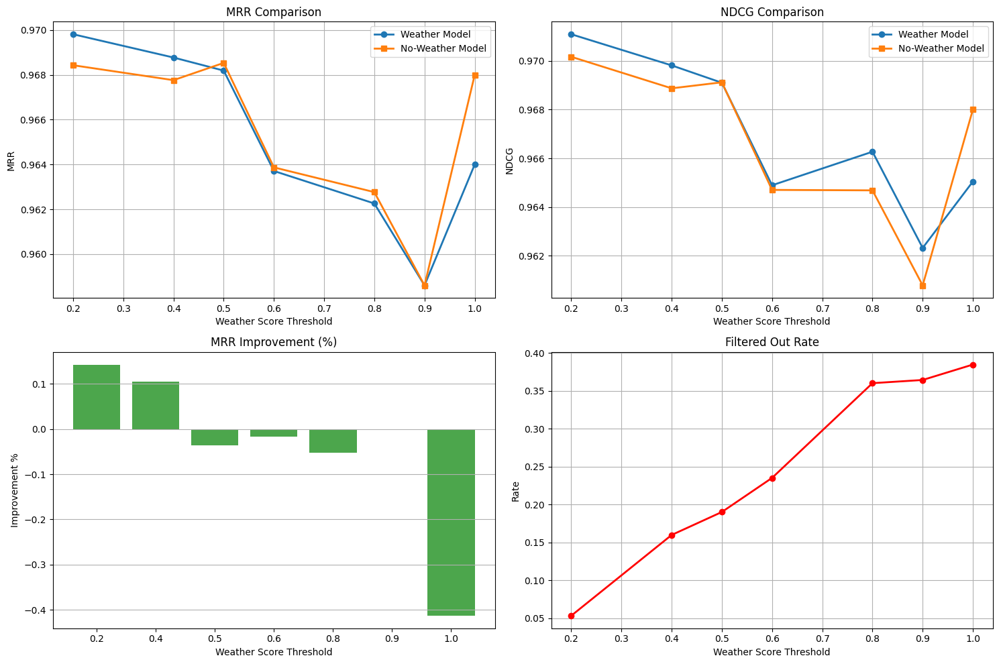

Weather features decrease MRR by 0.04%

Evaluation pipeline complete!


In [48]:
import tensorflow as tf
import numpy as np
import pandas as pd
import faiss
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, average_precision_score, roc_curve, auc
from catboost import CatBoostClassifier, Pool
import joblib
import math
from datetime import datetime

# --- Data loading and renaming (as in your paste.txt) ---


# Load data
users_df = pd.read_csv('/home/nkama/masters_thesis_project/thesis/partially_synthetic/notebooks/test_users_data.csv')
events_df = pd.read_csv("/home/nkama/masters_thesis_project/thesis/partially_synthetic/notebooks/test_events_data.csv")
interactions_df = pd.read_csv('/home/nkama/masters_thesis_project/thesis/partially_synthetic/notebooks/test_interactions_data.csv')
print(interactions_df.isnull().sum())

# Renaming columns in users_df
users_df.rename(columns={
    'lat': 'user_lat',
    'lng': 'user_lon',
    'location': 'user_city',
    'indoor_outdoor_preference': 'user_weather_preference',
    'joinedAt': 'signup_date'
}, inplace=True)

# Renaming columns in events_df
events_df.rename(columns={
    'category': 'event_type',
    'lat': 'event_lat',
    'lng': 'event_lon',
    'city': 'event_city',
    'weather_description': 'weather_condition',
    'temperature_2m_mean': 'temperature'
}, inplace=True)

# Renaming columns in interactions_df
interactions_df.rename(columns={
    'distance_to_event': 'interaction_distance_to_event'
}, inplace=True)

def safe_id_convert(x):
    if x is None:
        return "unknown"
    if isinstance(x, float):
        if math.isnan(x):
            return "unknown"
        else:
            return str(int(x))
    try:
        return str(int(float(x)))
    except Exception:
        return "unknown"

# Apply safe conversion
users_df["user_id"] = users_df["user_id"].apply(safe_id_convert)
events_df["event_id"] = events_df["event_id"].apply(safe_id_convert)
interactions_df["user_id"] = interactions_df["user_id"].apply(safe_id_convert)
interactions_df["event_id"] = interactions_df["event_id"].apply(safe_id_convert)

# Remove rows with unknown IDs to avoid mismatches
users_df = users_df[users_df["user_id"] != "unknown"]
events_df = events_df[events_df["event_id"] != "unknown"]
interactions_df = interactions_df[
    (interactions_df["user_id"] != "unknown") & (interactions_df["event_id"] != "unknown")
]

# Verify conversion
print("Sample user_id in interactions data after conversion:", interactions_df["user_id"].head().tolist())
print("Sample user_id in users data after conversion:", users_df["user_id"].head().tolist())

# Print the first few user IDs from each dataset to compare
print("\nFirst 10 user IDs in interactions_df:", sorted(list(interactions_df["user_id"].unique()))[:10])
print("First 10 user IDs in users_df:", sorted(list(users_df["user_id"].unique()))[:10])

# Check intersection properly
common_users = set(interactions_df["user_id"]).intersection(set(users_df["user_id"]))
print(f"Number of common users: {len(common_users)}")
print("First 10 common user IDs:", sorted(list(common_users))[:10])

# Filter interactions to only include users that exist in the users dataset
interactions_df = interactions_df[interactions_df["user_id"].isin(common_users)]
print(f"Filtered interactions with valid users: {len(interactions_df)}")

# Check intersection of event IDs
common_events = set(interactions_df["event_id"]).intersection(set(events_df["event_id"]))
print(f"Number of common events: {len(common_events)}")
print("First 10 common event IDs:", sorted(list(common_events))[:10])

# Filter interactions to only include events that exist in the events dataset
interactions_df = interactions_df[interactions_df["event_id"].isin(common_events)]
print(f"Filtered interactions with valid events: {len(interactions_df)}")

# Define feature sets
QUERY_FEATURES = ["user_id", "user_city", "age", "user_interests"]
CANDIDATE_FEATURES = ["event_id", "event_city", "event_type", "title"]
# Define features for ranking models
NO_WEATHER_SELECTED_FEATURES =['interaction_distance_to_event', 'event_type', 'event_city',
       'attendance_rate', 'event_indoor_capability', 'user_city', 'age',
       'user_interests']

WEATHER_SELECTED_FEATURES =['interaction_distance_to_event', 'event_type', 'event_city', 
       'weather_condition', 'temperature', 'attendance_rate',
       'event_indoor_capability', 'user_city', 'user_weather_preference',
       'age', 'user_interests']

# Print data info
print(f"Users: {len(users_df)}, Events: {len(events_df)}, Interactions: {len(interactions_df)}")
print(f"Unique users: {interactions_df['user_id'].nunique()}")
print(f"Unique events: {interactions_df['event_id'].nunique()}")

# Split data for evaluation
test_interactions = interactions_df.sample(frac=1.0, random_state=42)
print(f"Test interactions: {len(test_interactions)}")

# --- Helper functions ---

def get_user_embeddings(query_model, user_ids):
    batch_users = users_df[users_df['user_id'].isin(user_ids)]
    if batch_users.empty:
        print(f"Warning: No users found for IDs: {user_ids}")
        return None
    batch_input = {
        "user_id": tf.constant(batch_users['user_id'].values),
        "user_city": tf.constant(batch_users['user_city'].values),
        "age": tf.constant(batch_users['age'].values, dtype=tf.float32),
        "user_interests": tf.constant(batch_users['user_interests'].values)
    }
    return query_model(batch_input).numpy()

def get_event_embeddings(candidate_model, events_data=None):
    if events_data is None:
        events_data = events_df.copy()
    events_dataset = tf.data.Dataset.from_tensor_slices({
        "event_id": tf.constant(events_data["event_id"].values),
        "event_city": tf.constant(events_data["event_city"].values),
        "event_type": tf.constant(events_data["event_type"].values),
        "title": tf.constant(events_data["title"].values)
    }).batch(128)
    event_ids = []
    event_embeddings = []
    for batch in events_dataset:
        batch_embeddings = candidate_model(batch)
        event_ids.extend(batch["event_id"].numpy())
        event_embeddings.append(batch_embeddings.numpy())
    return np.vstack(event_embeddings), event_ids

def build_faiss_index(embeddings):
    faiss.normalize_L2(embeddings)
    d = embeddings.shape[1]
    index = faiss.IndexFlatIP(d)
    index.add(embeddings)
    return index

# --- Robust weather match scoring ---

def compute_weather_match(user_weather, event_weather, user_pref, event_type_val, user_temp, event_temp, user_precip, event_precip):
    score = 0.0
    # Weather group match (0.4)
    if user_weather == event_weather:
        score += 0.4
    elif (user_weather in ['Sunny', 'Cloudy', 'Clear', 'Partly Cloudy'] and event_weather in ['Sunny', 'Cloudy', 'Clear', 'Partly Cloudy']):
        score += 0.2
    elif (user_weather in ['Rain', 'Light Drizzle', 'Heavy Rain', 'Thunderstorm'] and event_weather in ['Rain', 'Light Drizzle', 'Heavy Rain', 'Thunderstorm']):
        score += 0.2
    # Indoor/outdoor preference match (0.3)
    if user_pref == 'any':
        score += 0.3
    elif (user_pref == 'indoor' and event_type_val in ['Indoor', 'Hybrid']) or (user_pref == 'outdoor' and event_type_val in ['Outdoor', 'Hybrid']):
        score += 0.3
    # Temperature and precipitation compatibility (0.3)
    temp_diff = abs(user_temp - event_temp)
    precip_diff = abs(user_precip - event_precip)
    temp_score = max(0, 1 - (temp_diff / 20))
    precip_score = max(0, 1 - (precip_diff / 10))
    score += 0.3 * (0.6 * temp_score + 0.4 * precip_score)
    return round(score, 2)

def post_retrieval_filtering(candidates_df, user_context, filter_weather=True, filter_time=True, max_distance_km=500, weather_score_threshold=0.5):
    if filter_time and 'start_time' in candidates_df.columns:
        now = pd.Timestamp.now(tz='UTC')
        candidates_df = candidates_df[
            pd.to_datetime(candidates_df['start_time'], utc=True) > now
        ]
    # Location proximity filtering
    if 'interaction_distance_to_event' in candidates_df.columns:
        candidates_df = candidates_df[candidates_df['interaction_distance_to_event'] <= max_distance_km]
    
    # Weather filtering
    if filter_weather:
        scores = []
        for _, event in candidates_df.iterrows():
            score = compute_weather_match(
                user_context.get('user_weather_condition', 'any'),
                event.get('weather_condition', 'unknown'),
                user_context.get('user_weather_preference', 'any'),
                event.get('event_type', 'unknown'),
                user_context.get('user_temperature', 20),
                event.get('temperature', 20),
                user_context.get('user_precipitation', 0),
                event.get('precipitation_sum', 0)
            )
            scores.append(score)
        candidates_df = candidates_df.assign(weather_match_score=scores)
        candidates_df = candidates_df[candidates_df['weather_match_score'] >= weather_score_threshold]
    return candidates_df

# --- Main retrieval-ranking pipeline with filtering ---

def evaluate_weather_thresholds_comparison(
    query_model, candidate_model, weather_model, no_weather_model, test_interactions, 
    weather_features, no_weather_features, 
    k_retrieval=100, k=10, filter_time=True, max_distance_km=5000, 
    weather_score_thresholds=[0.2, 0.4, 0.5, 0.6, 0.8, 0.9, 1.0]
):
    print("\n=== Comparing Weather vs No-Weather Models Across Thresholds ===")
    event_embeddings, event_ids_bytes = get_event_embeddings(candidate_model)
    event_ids = [eid.decode('utf-8') if isinstance(eid, bytes) else str(eid) for eid in event_ids_bytes]
    faiss_index = build_faiss_index(event_embeddings)
    
    # Initialize metrics storage for each threshold
    weather_results = {
        threshold: {
            "hit_rate": 0,
            "recall": [],
            "precision": [],
            "ndcg": [],
            "mrr": [],
            "total_users": 0,
            "successful_users": 0,
            "filtered_out_rate": []
        }
        for threshold in weather_score_thresholds
    }
    
    no_weather_results = {
        threshold: {
            "hit_rate": 0,
            "recall": [],
            "precision": [],
            "ndcg": [],
            "mrr": [],
            "total_users": 0,
            "successful_users": 0
        }
        for threshold in weather_score_thresholds
    }
    
    user_groups = test_interactions.groupby('user_id')
    total_users = 0
    
    for user_id, group in user_groups:
        try:
            total_users += 1
            
            # Get ground truth events the user actually interacted with
            attended_events = set(group[group['interaction_label'] == 1]['event_id'].tolist())
            if not attended_events:
                continue
                
            # Get events matching user interests
            user_data = users_df[users_df['user_id'] == user_id].iloc[0]
            
            # Skip users with missing data
            if pd.isna(user_data['user_interests']):
                print(f"Skipping user {user_id} due to missing user_interests")
                continue
                
            user_interests = user_data['user_interests'].split(",")
            interest_matched = {
                ev_id for ev_id, ev_type in zip(events_df['event_id'], events_df['event_type'])
                if any(interest.strip().lower() in str(ev_type).lower() for interest in user_interests)
            }
            
            # Union of the two sets for relevance evaluation
            actual_relevant = attended_events.union(interest_matched)
            
            # Get user embedding and retrieve candidates
            user_embedding = get_user_embeddings(query_model, [user_id])
            if user_embedding is None or len(user_embedding) == 0:
                continue
                
            faiss.normalize_L2(user_embedding)
            distances, indices = faiss_index.search(user_embedding, k_retrieval)
            retrieved_indices = indices[0]
            retrieved_event_ids = [event_ids[idx] for idx in retrieved_indices]
            retrieved_events_df = events_df[events_df['event_id'].isin(retrieved_event_ids)].copy()
            
            if retrieved_events_df.empty:
                continue
                
            # Add contextual columns from interactions_df if available
            merged = pd.merge(
                retrieved_events_df,
                interactions_df[interactions_df['user_id'] == user_id][['event_id', 'interaction_distance_to_event']],
                on='event_id', how='inner'
            )
            
            # Fill missing distances with mean
            merged['interaction_distance_to_event'] = merged['interaction_distance_to_event'].fillna(interactions_df['interaction_distance_to_event'].mean())
            
            # User context for weather filtering
            user_context = {
                'user_weather_condition': group['user_weather_condition'].iloc[0] if 'user_weather_condition' in group.columns else 'any',
                'user_weather_preference': user_data.get('user_weather_preference', 'any'),
                'user_temperature': group['user_temperature'].iloc[0] if 'user_temperature' in group.columns else 20,
                'user_precipitation': group['user_precipitation'].iloc[0] if 'user_precipitation' in group.columns else 0,
                'user_city': user_data['user_city'],
                'age': user_data['age']
            }
            
            # Calculate weather scores for all candidates without filtering
            scores = []
            for _, event in merged.iterrows():
                score = compute_weather_match(
                    user_context.get('user_weather_condition', 'any'),
                    event.get('weather_condition', 'unknown'),
                    user_context.get('user_weather_preference', 'any'),
                    event.get('event_type', 'unknown'),
                    user_context.get('user_temperature', 20),
                    event.get('temperature', 20),
                    user_context.get('user_precipitation', 0),
                    event.get('precipitation_sum', 0)
                )
                scores.append(score)
            merged['weather_match_score'] = scores
            
            # Process each threshold for weather model
            for threshold in weather_score_thresholds:
                weather_results[threshold]["total_users"] += 1
                
                # Apply weather threshold filtering
                filtered_candidates = merged[merged['weather_match_score'] >= threshold].copy()
                
                # Calculate filtered out rate
                filtered_out_rate = 1 - (len(filtered_candidates) / len(merged)) if len(merged) > 0 else 0
                weather_results[threshold]["filtered_out_rate"].append(filtered_out_rate)
                
                if filtered_candidates.empty:
                    continue
                
                # Process weather model
                weather_recommendations = process_model_recommendations(
                    filtered_candidates, user_data, weather_model, weather_features, 
                    actual_relevant, attended_events, interest_matched, k
                )
                
                if weather_recommendations:
                    # Update weather metrics
                    if weather_recommendations["hit"]:
                        weather_results[threshold]["hit_rate"] += 1
                    weather_results[threshold]["recall"].append(weather_recommendations["recall"])
                    weather_results[threshold]["precision"].append(weather_recommendations["precision"])
                    weather_results[threshold]["ndcg"].append(weather_recommendations["ndcg"])
                    weather_results[threshold]["mrr"].append(weather_recommendations["mrr"])
                    weather_results[threshold]["successful_users"] += 1
                
                # Process no-weather model with same candidates
                no_weather_recommendations = process_model_recommendations(
                    filtered_candidates, user_data, no_weather_model, no_weather_features, 
                    actual_relevant, attended_events, interest_matched, k
                )
                
                if no_weather_recommendations:
                    # Update no-weather metrics
                    if no_weather_recommendations["hit"]:
                        no_weather_results[threshold]["hit_rate"] += 1
                    no_weather_results[threshold]["recall"].append(no_weather_recommendations["recall"])
                    no_weather_results[threshold]["precision"].append(no_weather_recommendations["precision"])
                    no_weather_results[threshold]["ndcg"].append(no_weather_recommendations["ndcg"])
                    no_weather_results[threshold]["mrr"].append(no_weather_recommendations["mrr"])
                    no_weather_results[threshold]["successful_users"] += 1
            
            if total_users % 100 == 0:
                print(f"Processed {total_users} users")
                
        except Exception as e:
            print(f"Error processing user {user_id}: {e}")
            continue
    
    # Calculate average metrics for each threshold
    weather_summary = {}
    no_weather_summary = {}
    comparison = {}
    
    for threshold in weather_score_thresholds:
        # Weather metrics
        w_metrics = weather_results[threshold]
        w_hit_rate = w_metrics["hit_rate"] / w_metrics["total_users"] if w_metrics["total_users"] > 0 else 0
        w_recall = np.mean(w_metrics["recall"]) if w_metrics["recall"] else 0
        w_precision = np.mean(w_metrics["precision"]) if w_metrics["precision"] else 0
        w_ndcg = np.mean(w_metrics["ndcg"]) if w_metrics["ndcg"] else 0
        w_mrr = np.mean(w_metrics["mrr"]) if w_metrics["mrr"] else 0
        w_filtered_out_rate = np.mean(w_metrics["filtered_out_rate"]) if w_metrics["filtered_out_rate"] else 0
        
        weather_summary[threshold] = {
            "hit_rate": w_hit_rate,
            "recall": w_recall,
            "precision": w_precision,
            "ndcg": w_ndcg,
            "mrr": w_mrr,
            "successful_users": w_metrics["successful_users"],
            "total_users": w_metrics["total_users"],
            "filtered_out_rate": w_filtered_out_rate
        }
        
        # No-weather metrics
        nw_metrics = no_weather_results[threshold]
        nw_hit_rate = nw_metrics["hit_rate"] / nw_metrics["total_users"] if nw_metrics["total_users"] > 0 else 0
        nw_recall = np.mean(nw_metrics["recall"]) if nw_metrics["recall"] else 0
        nw_precision = np.mean(nw_metrics["precision"]) if nw_metrics["precision"] else 0
        nw_ndcg = np.mean(nw_metrics["ndcg"]) if nw_metrics["ndcg"] else 0
        nw_mrr = np.mean(nw_metrics["mrr"]) if nw_metrics["mrr"] else 0
        
        no_weather_summary[threshold] = {
            "hit_rate": nw_hit_rate,
            "recall": nw_recall,
            "precision": nw_precision,
            "ndcg": nw_ndcg,
            "mrr": nw_mrr,
            "successful_users": nw_metrics["successful_users"],
            "total_users": nw_metrics["total_users"]
        }
        
        # Calculate improvement percentages
        if nw_mrr > 0:
            mrr_improvement = ((w_mrr - nw_mrr) / nw_mrr) * 100
        else:
            mrr_improvement = float('inf') if w_mrr > 0 else 0
            
        if nw_ndcg > 0:
            ndcg_improvement = ((w_ndcg - nw_ndcg) / nw_ndcg) * 100
        else:
            ndcg_improvement = float('inf') if w_ndcg > 0 else 0
            
        if nw_recall > 0:
            recall_improvement = ((w_recall - nw_recall) / nw_recall) * 100
        else:
            recall_improvement = float('inf') if w_recall > 0 else 0
            
        comparison[threshold] = {
            "mrr_improvement": mrr_improvement,
            "ndcg_improvement": ndcg_improvement,
            "recall_improvement": recall_improvement,
            "weather_mrr": w_mrr,
            "no_weather_mrr": nw_mrr
        }
    
    # Convert to DataFrames for easier visualization
    weather_df = pd.DataFrame(weather_summary).T
    weather_df.index.name = 'Weather Score Threshold'
    
    no_weather_df = pd.DataFrame(no_weather_summary).T
    no_weather_df.index.name = 'Weather Score Threshold'
    
    comparison_df = pd.DataFrame(comparison).T
    comparison_df.index.name = 'Weather Score Threshold'
    
    # Print results
    print(f"\nEvaluation Results for k={k}:")
    print(f"Total users evaluated: {total_users}")
    
    print("\nWeather Model Metrics:")
    print(weather_df)
    
    print("\nNo-Weather Model Metrics:")
    print(no_weather_df)
    
    print("\nImprovement Percentages:")
    print(comparison_df[["mrr_improvement", "ndcg_improvement", "recall_improvement"]])
    
    # Plot comparison
    plt.figure(figsize=(15, 10))
    
    # MRR Comparison
    plt.subplot(2, 2, 1)
    plt.plot(weather_df.index, weather_df["mrr"], marker='o', linewidth=2, label="Weather Model")
    plt.plot(no_weather_df.index, no_weather_df["mrr"], marker='s', linewidth=2, label="No-Weather Model")
    plt.title('MRR Comparison')
    plt.xlabel('Weather Score Threshold')
    plt.ylabel('MRR')
    plt.legend()
    plt.grid(True)
    
    # NDCG Comparison
    plt.subplot(2, 2, 2)
    plt.plot(weather_df.index, weather_df["ndcg"], marker='o', linewidth=2, label="Weather Model")
    plt.plot(no_weather_df.index, no_weather_df["ndcg"], marker='s', linewidth=2, label="No-Weather Model")
    plt.title('NDCG Comparison')
    plt.xlabel('Weather Score Threshold')
    plt.ylabel('NDCG')
    plt.legend()
    plt.grid(True)
    
    # Improvement Percentages
    plt.subplot(2, 2, 3)
    plt.bar(comparison_df.index.astype(str), comparison_df["mrr_improvement"], color='green', alpha=0.7)
    plt.title('MRR Improvement (%)')
    plt.xlabel('Weather Score Threshold')
    plt.ylabel('Improvement %')
    plt.grid(True, axis='y')
    
    # Filtered Out Rate
    plt.subplot(2, 2, 4)
    plt.plot(weather_df.index, weather_df["filtered_out_rate"], marker='o', linewidth=2, color='red')
    plt.title('Filtered Out Rate')
    plt.xlabel('Weather Score Threshold')
    plt.ylabel('Rate')
    plt.grid(True)
    
    plt.tight_layout()
    plt.savefig('weather_vs_no_weather_comparison.png')
    plt.show()
    
    return weather_df, no_weather_df, comparison_df

def process_model_recommendations(candidates_df, user_data, model, feature_list, actual_relevant, attended_events, interest_matched, k):
    """Helper function to process model recommendations and calculate metrics"""
    try:
        # Prepare data for ranking
        ranking_data = []
        for _, event in candidates_df.iterrows():
            row = {
                'event_id': event['event_id'],
                'event_type': event['event_type'],
                'event_city': event['event_city'],
                'attendance_rate': event['attendance_rate'],
                'event_indoor_capability': event['event_indoor_capability'],
                'user_city': user_data['user_city'],
                'age': user_data['age'],
                'user_interests': user_data['user_interests']
            }
            if 'weather_condition' in feature_list:
                row['weather_condition'] = event['weather_condition']
                row['temperature'] = event['temperature']
                row['user_weather_preference'] = user_data['user_weather_preference']
            row['interaction_distance_to_event'] = event['interaction_distance_to_event']
            ranking_data.append(row)
        
        ranking_df = pd.DataFrame(ranking_data)
        
        # Fill missing features
        for feat in feature_list:
            if feat not in ranking_df.columns:
                if feat in ['user_interests', 'event_type', 'event_city', 'user_city', 'user_weather_preference', 'weather_condition']:
                    ranking_df[feat] = 'unknown'
                elif feat in ['interaction_distance_to_event', 'temperature', 'attendance_rate']:
                    ranking_df[feat] = 0.0
                elif feat == 'age':
                    ranking_df[feat] = 30
                elif feat == 'event_indoor_capability':
                    ranking_df[feat] = True
        
        # Prepare features for ranking model
        text_cols = ["title", "user_interests"]
        ranking_features = ranking_df[feature_list].drop(columns=[c for c in text_cols if c in ranking_df.columns])
        
        for col in ranking_features.columns:
            if ranking_features[col].dtype == 'object':
                ranking_features[col] = ranking_features[col].fillna('unknown')
            elif ranking_features[col].dtype in ['float64', 'float32']:
                ranking_features[col] = ranking_features[col].fillna(0.0)
            elif ranking_features[col].dtype in ['int64', 'int32']:
                ranking_features[col] = ranking_features[col].fillna(0)
            elif ranking_features[col].dtype == 'bool':
                ranking_features[col] = ranking_features[col].fillna(False)
        
        cat_features = ranking_features.select_dtypes(include=["object", "bool"]).columns.tolist()
        ranking_pool = Pool(data=ranking_features, cat_features=cat_features)
        ranking_scores = model.predict_proba(ranking_pool)[:, 1]
        ranked_results = pd.DataFrame({'event_id': ranking_df['event_id'], 'ranking_score': ranking_scores})
        ranked_results.sort_values('ranking_score', ascending=False, inplace=True)
        final_recommendation_ids = ranked_results['event_id'].tolist()[:k]
        
        if not final_recommendation_ids:
            return None
        
        # Calculate metrics
        top_k = set(final_recommendation_ids)
        
        # Check if all attended events are in top-k or if any recommended event matches user interests
        attended_in_top_k = attended_events.issubset(top_k)
        interest_in_top_k = any(ev in interest_matched for ev in top_k)
        hit = attended_in_top_k or interest_in_top_k
        
        # Calculate other metrics
        hits = len(top_k.intersection(actual_relevant))
        recall = hits / len(actual_relevant) if actual_relevant else 0
        precision = hits / k if k > 0 else 0
        
        # NDCG calculation
        relevance = [1 if eid in actual_relevant else 0 for eid in final_recommendation_ids]
        dcg = sum(rel / np.log2(i + 2) for i, rel in enumerate(relevance))
        ideal_relevance = sorted(relevance, reverse=True)
        idcg = sum(rel / np.log2(i + 2) for i, rel in enumerate(ideal_relevance))
        ndcg = dcg / idcg if idcg > 0 else 0
        
        # MRR calculation
        mrr = 0
        for i, eid in enumerate(final_recommendation_ids):
            if eid in actual_relevant:
                mrr = 1.0 / (i + 1)
                break
        
        return {
            "hit": hit,
            "recall": recall,
            "precision": precision,
            "ndcg": ndcg,
            "mrr": mrr
        }
    
    except Exception as e:
        print(f"Error processing recommendations: {e}")
        return None

def main():
    print("Starting evaluation pipeline for weather score threshold impact...")
    print(f"Current date: Sunday, May 18, 2025, 1:13 PM CEST")
    print("=" * 50)
    
    # Load models (replace with your actual model loading code)
    query_model = model.query_model
    candidate_model = model.item_model
    weather_model = joblib.load("/home/nkama/masters_thesis_project/thesis/models/weather_ranking_model.pkl")
    no_weather_model = joblib.load("/home/nkama/masters_thesis_project/thesis/models/no_weather_ranking_model_2.pkl")
    
    # Define weather score thresholds to evaluate
    weather_thresholds = [0.2, 0.4, 0.5, 0.6, 0.8, 0.9, 1.0]
    
    # Evaluate impact of weather score thresholds with comparison to no-weather model
    weather_df, no_weather_df, comparison_df = evaluate_weather_thresholds_comparison(
        query_model,
        candidate_model,
        weather_model,
        no_weather_model,
        test_interactions,
        WEATHER_SELECTED_FEATURES,
        NO_WEATHER_SELECTED_FEATURES,
        k_retrieval=1000,
        k=10,  # Fixed k for evaluation
        filter_time=False,
        max_distance_km=500,
        weather_score_thresholds=weather_thresholds
    )
    
    # Save results
    weather_df.to_csv("weather_model_results.csv")
    no_weather_df.to_csv("no_weather_model_results.csv")
    comparison_df.to_csv("model_comparison_results.csv")
    
    # Calculate overall improvement
    if weather_df["mrr"].mean() > no_weather_df["mrr"].mean():
        improvement = ((weather_df["mrr"].mean() - no_weather_df["mrr"].mean()) / no_weather_df["mrr"].mean()) * 100
        print(f"Weather features improve MRR by {improvement:.2f}%")
    else:
        diff = ((no_weather_df["mrr"].mean() - weather_df["mrr"].mean()) / weather_df["mrr"].mean()) * 100
        print(f"Weather features decrease MRR by {diff:.2f}%")
    
    print("\nEvaluation pipeline complete!")



if __name__ == "__main__":
    main()


## updated relevance logic to include attended and interest match

In [1]:
import tensorflow as tf
import numpy as np
import pandas as pd
import faiss
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, average_precision_score, roc_curve, auc
from catboost import CatBoostClassifier, Pool
import joblib
import math
from datetime import datetime

# --- Data loading and renaming (as in your paste.txt) ---


# Load data
users_df = pd.read_csv('/home/nkama/masters_thesis_project/thesis/partially_synthetic/notebooks/test_users_data.csv')
events_df = pd.read_csv("/home/nkama/masters_thesis_project/thesis/partially_synthetic/notebooks/test_events_data.csv")
interactions_df = pd.read_csv('/home/nkama/masters_thesis_project/thesis/partially_synthetic/notebooks/test_interactions_data.csv')
print(interactions_df.isnull().sum())

# Renaming columns in users_df
users_df.rename(columns={
    'lat': 'user_lat',
    'lng': 'user_lon',
    'location': 'user_city',
    'indoor_outdoor_preference': 'user_weather_preference',
    'joinedAt': 'signup_date'
}, inplace=True)

# Renaming columns in events_df
events_df.rename(columns={
    'category': 'event_type',
    'lat': 'event_lat',
    'lng': 'event_lon',
    'city': 'event_city',
    'weather_description': 'weather_condition',
    'temperature_2m_mean': 'temperature'
}, inplace=True)

# Renaming columns in interactions_df
interactions_df.rename(columns={
    'distance_to_event': 'interaction_distance_to_event'
}, inplace=True)

def safe_id_convert(x):
    if x is None:
        return "unknown"
    if isinstance(x, float):
        if math.isnan(x):
            return "unknown"
        else:
            return str(int(x))
    try:
        return str(int(float(x)))
    except Exception:
        return "unknown"

# Apply safe conversion
users_df["user_id"] = users_df["user_id"].apply(safe_id_convert)
events_df["event_id"] = events_df["event_id"].apply(safe_id_convert)
interactions_df["user_id"] = interactions_df["user_id"].apply(safe_id_convert)
interactions_df["event_id"] = interactions_df["event_id"].apply(safe_id_convert)

# Remove rows with unknown IDs to avoid mismatches
users_df = users_df[users_df["user_id"] != "unknown"]
events_df = events_df[events_df["event_id"] != "unknown"]
interactions_df = interactions_df[
    (interactions_df["user_id"] != "unknown") & (interactions_df["event_id"] != "unknown")
]

# Verify conversion
print("Sample user_id in interactions data after conversion:", interactions_df["user_id"].head().tolist())
print("Sample user_id in users data after conversion:", users_df["user_id"].head().tolist())

# Print the first few user IDs from each dataset to compare
print("\nFirst 10 user IDs in interactions_df:", sorted(list(interactions_df["user_id"].unique()))[:10])
print("First 10 user IDs in users_df:", sorted(list(users_df["user_id"].unique()))[:10])

# Check intersection properly
common_users = set(interactions_df["user_id"]).intersection(set(users_df["user_id"]))
print(f"Number of common users: {len(common_users)}")
print("First 10 common user IDs:", sorted(list(common_users))[:10])

# Filter interactions to only include users that exist in the users dataset
interactions_df = interactions_df[interactions_df["user_id"].isin(common_users)]
print(f"Filtered interactions with valid users: {len(interactions_df)}")

# Check intersection of event IDs
common_events = set(interactions_df["event_id"]).intersection(set(events_df["event_id"]))
print(f"Number of common events: {len(common_events)}")
print("First 10 common event IDs:", sorted(list(common_events))[:10])

# Filter interactions to only include events that exist in the events dataset
interactions_df = interactions_df[interactions_df["event_id"].isin(common_events)]
print(f"Filtered interactions with valid events: {len(interactions_df)}")

# Define feature sets
QUERY_FEATURES = ["user_id", "user_city", "age", "user_interests"]
CANDIDATE_FEATURES = ["event_id", "event_city", "event_type", "title"]
# Define features for ranking models
NO_WEATHER_SELECTED_FEATURES =['interaction_distance_to_event', 'event_type', 'event_city',
       'attendance_rate', 'event_indoor_capability', 'user_city', 'age',
       'user_interests']

WEATHER_SELECTED_FEATURES =['interaction_distance_to_event', 'event_type', 'event_city', 
       'weather_condition', 'temperature', 'attendance_rate',
       'event_indoor_capability', 'user_city', 'user_weather_preference',
       'age', 'user_interests']

# Print data info
print(f"Users: {len(users_df)}, Events: {len(events_df)}, Interactions: {len(interactions_df)}")
print(f"Unique users: {interactions_df['user_id'].nunique()}")
print(f"Unique events: {interactions_df['event_id'].nunique()}")

# Split data for evaluation
test_interactions = interactions_df.sample(frac=1.0, random_state=42)
print(f"Test interactions: {len(test_interactions)}")

# --- Helper functions ---

def get_user_embeddings(query_model, user_ids):
    batch_users = users_df[users_df['user_id'].isin(user_ids)]
    if batch_users.empty:
        print(f"Warning: No users found for IDs: {user_ids}")
        return None
    batch_input = {
        "user_id": tf.constant(batch_users['user_id'].values),
        "user_city": tf.constant(batch_users['user_city'].values),
        "age": tf.constant(batch_users['age'].values, dtype=tf.float32),
        "user_interests": tf.constant(batch_users['user_interests'].values)
    }
    return query_model(batch_input).numpy()

def get_event_embeddings(candidate_model, events_data=None):
    if events_data is None:
        events_data = events_df.copy()
    events_dataset = tf.data.Dataset.from_tensor_slices({
        "event_id": tf.constant(events_data["event_id"].values),
        "event_city": tf.constant(events_data["event_city"].values),
        "event_type": tf.constant(events_data["event_type"].values),
        "title": tf.constant(events_data["title"].values)
    }).batch(128)
    event_ids = []
    event_embeddings = []
    for batch in events_dataset:
        batch_embeddings = candidate_model(batch)
        event_ids.extend(batch["event_id"].numpy())
        event_embeddings.append(batch_embeddings.numpy())
    return np.vstack(event_embeddings), event_ids

def build_faiss_index(embeddings):
    faiss.normalize_L2(embeddings)
    d = embeddings.shape[1]
    index = faiss.IndexFlatIP(d)
    index.add(embeddings)
    return index

# --- Robust weather match scoring ---

def compute_weather_match(user_weather, event_weather, user_pref, event_type_val, user_temp, event_temp, user_precip, event_precip):
    score = 0.0
    # Weather group match (0.4)
    if user_weather == event_weather:
        score += 0.4
    elif (user_weather in ['Sunny', 'Cloudy', 'Clear', 'Partly Cloudy'] and event_weather in ['Sunny', 'Cloudy', 'Clear', 'Partly Cloudy']):
        score += 0.2
    elif (user_weather in ['Rain', 'Light Drizzle', 'Heavy Rain', 'Thunderstorm'] and event_weather in ['Rain', 'Light Drizzle', 'Heavy Rain', 'Thunderstorm']):
        score += 0.2
    # Indoor/outdoor preference match (0.3)
    if user_pref == 'any':
        score += 0.3
    elif (user_pref == 'indoor' and event_type_val in ['Indoor', 'Hybrid']) or (user_pref == 'outdoor' and event_type_val in ['Outdoor', 'Hybrid']):
        score += 0.3
    # Temperature and precipitation compatibility (0.3)
    temp_diff = abs(user_temp - event_temp)
    precip_diff = abs(user_precip - event_precip)
    temp_score = max(0, 1 - (temp_diff / 20))
    precip_score = max(0, 1 - (precip_diff / 10))
    score += 0.3 * (0.6 * temp_score + 0.4 * precip_score)
    return round(score, 2)

def post_retrieval_filtering(candidates_df, user_context, filter_weather=True, filter_time=True, max_distance_km=500, weather_score_threshold=0.5):
    if filter_time and 'start_time' in candidates_df.columns:
        now = pd.Timestamp.now(tz='UTC')
        candidates_df = candidates_df[
            pd.to_datetime(candidates_df['start_time'], utc=True) > now
        ]
    # Location proximity filtering
    if 'interaction_distance_to_event' in candidates_df.columns:
        candidates_df = candidates_df[candidates_df['interaction_distance_to_event'] <= max_distance_km]
    
    # Weather filtering
    if filter_weather:
        scores = []
        for _, event in candidates_df.iterrows():
            score = compute_weather_match(
                user_context.get('user_weather_condition', 'any'),
                event.get('weather_condition', 'unknown'),
                user_context.get('user_weather_preference', 'any'),
                event.get('event_type', 'unknown'),
                user_context.get('user_temperature', 20),
                event.get('temperature', 20),
                user_context.get('user_precipitation', 0),
                event.get('precipitation_sum', 0)
            )
            scores.append(score)
        candidates_df = candidates_df.assign(weather_match_score=scores)
        candidates_df = candidates_df[candidates_df['weather_match_score'] >= weather_score_threshold]
    return candidates_df

# --- Main retrieval-ranking pipeline with filtering ---

def evaluate_weather_thresholds_comparison(
    query_model, candidate_model, weather_model, no_weather_model, test_interactions, 
    weather_features, no_weather_features, 
    k_retrieval=100, k=10, filter_time=True, max_distance_km=5000, 
    weather_score_thresholds=[0.2, 0.4, 0.5, 0.6, 0.8, 0.9, 1.0]
):
    print("\n=== Comparing Weather vs No-Weather Models Across Thresholds ===")
    event_embeddings, event_ids_bytes = get_event_embeddings(candidate_model)
    event_ids = [eid.decode('utf-8') if isinstance(eid, bytes) else str(eid) for eid in event_ids_bytes]
    faiss_index = build_faiss_index(event_embeddings)
    
    # Initialize metrics storage for each threshold
    weather_results = {
        threshold: {
            "hit_rate": 0,
            "recall": [],
            "precision": [],
            "ndcg": [],
            "mrr": [],
            "total_users": 0,
            "successful_users": 0,
            "filtered_out_rate": []
        }
        for threshold in weather_score_thresholds
    }
    
    no_weather_results = {
        threshold: {
            "hit_rate": 0,
            "recall": [],
            "precision": [],
            "ndcg": [],
            "mrr": [],
            "total_users": 0,
            "successful_users": 0
        }
        for threshold in weather_score_thresholds
    }
    
    user_groups = test_interactions.groupby('user_id')
    total_users = 0
    
    for user_id, group in user_groups:
        try:
            total_users += 1
            
            # Get ground truth events the user actually interacted with
            attended_events = set(group[group['interaction_label'] == 1]['event_id'].tolist())
            
            # Get events matching user interests
            user_data = users_df[users_df['user_id'] == user_id].iloc[0]
            
            # Skip users with missing data
            if pd.isna(user_data['user_interests']):
                print(f"Skipping user {user_id} due to missing user_interests")
                continue
                
            user_interests = user_data['user_interests'].split(",")
            interest_matched = {
                ev_id for ev_id, ev_type in zip(events_df['event_id'], events_df['event_type'])
                if any(interest.strip().lower() in str(ev_type).lower() for interest in user_interests)
            }
            
            # Union of the two sets for relevance evaluation
            actual_relevant = attended_events.union(interest_matched)
            
            # Get user embedding and retrieve candidates
            user_embedding = get_user_embeddings(query_model, [user_id])
            if user_embedding is None or len(user_embedding) == 0:
                continue
                
            faiss.normalize_L2(user_embedding)
            distances, indices = faiss_index.search(user_embedding, k_retrieval)
            retrieved_indices = indices[0]
            retrieved_event_ids = [event_ids[idx] for idx in retrieved_indices]
            retrieved_events_df = events_df[events_df['event_id'].isin(retrieved_event_ids)].copy()
            
            if retrieved_events_df.empty:
                continue
                
            # Add contextual columns from interactions_df if available
            merged = pd.merge(
                retrieved_events_df,
                interactions_df[interactions_df['user_id'] == user_id][['event_id', 'interaction_distance_to_event']],
                on='event_id', how='inner'
            )
            
            # Fill missing distances with mean
            merged['interaction_distance_to_event'] = merged['interaction_distance_to_event'].fillna(interactions_df['interaction_distance_to_event'].mean())
            
            # User context for weather filtering
            user_context = {
                'user_weather_condition': group['user_weather_condition'].iloc[0] if 'user_weather_condition' in group.columns else 'any',
                'user_weather_preference': user_data.get('user_weather_preference', 'any'),
                'user_temperature': group['user_temperature'].iloc[0] if 'user_temperature' in group.columns else 20,
                'user_precipitation': group['user_precipitation'].iloc[0] if 'user_precipitation' in group.columns else 0,
                'user_city': user_data['user_city'],
                'age': user_data['age']
            }
            
            # Calculate weather scores for all candidates without filtering
            scores = []
            for _, event in merged.iterrows():
                score = compute_weather_match(
                    user_context.get('user_weather_condition', 'any'),
                    event.get('weather_condition', 'unknown'),
                    user_context.get('user_weather_preference', 'any'),
                    event.get('event_type', 'unknown'),
                    user_context.get('user_temperature', 20),
                    event.get('temperature', 20),
                    user_context.get('user_precipitation', 0),
                    event.get('precipitation_sum', 0)
                )
                scores.append(score)
            merged['weather_match_score'] = scores
            
            # Process each threshold for weather model
            for threshold in weather_score_thresholds:
                weather_results[threshold]["total_users"] += 1
                
                # Apply weather threshold filtering
                filtered_candidates = merged[merged['weather_match_score'] >= threshold].copy()
                
                # Calculate filtered out rate
                filtered_out_rate = 1 - (len(filtered_candidates) / len(merged)) if len(merged) > 0 else 0
                weather_results[threshold]["filtered_out_rate"].append(filtered_out_rate)
                
                if filtered_candidates.empty:
                    continue
                
                # Process weather model
                weather_recommendations = process_model_recommendations(
                    filtered_candidates, user_data, weather_model, weather_features, 
                    actual_relevant, attended_events, interest_matched, k
                )
                
                if weather_recommendations:
                    # Update weather metrics
                    if weather_recommendations["hit"]:
                        weather_results[threshold]["hit_rate"] += 1
                    weather_results[threshold]["recall"].append(weather_recommendations["recall"])
                    weather_results[threshold]["precision"].append(weather_recommendations["precision"])
                    weather_results[threshold]["ndcg"].append(weather_recommendations["ndcg"])
                    weather_results[threshold]["mrr"].append(weather_recommendations["mrr"])
                    weather_results[threshold]["successful_users"] += 1
                
                # Process no-weather model with same candidates
                no_weather_recommendations = process_model_recommendations(
                    filtered_candidates, user_data, no_weather_model, no_weather_features, 
                    actual_relevant, attended_events, interest_matched, k
                )
                
                if no_weather_recommendations:
                    # Update no-weather metrics
                    if no_weather_recommendations["hit"]:
                        no_weather_results[threshold]["hit_rate"] += 1
                    no_weather_results[threshold]["recall"].append(no_weather_recommendations["recall"])
                    no_weather_results[threshold]["precision"].append(no_weather_recommendations["precision"])
                    no_weather_results[threshold]["ndcg"].append(no_weather_recommendations["ndcg"])
                    no_weather_results[threshold]["mrr"].append(no_weather_recommendations["mrr"])
                    no_weather_results[threshold]["successful_users"] += 1
            
            if total_users % 100 == 0:
                print(f"Processed {total_users} users")
                
        except Exception as e:
            print(f"Error processing user {user_id}: {e}")
            continue
    
    # Calculate average metrics for each threshold
    weather_summary = {}
    no_weather_summary = {}
    comparison = {}
    
    for threshold in weather_score_thresholds:
        # Weather metrics
        w_metrics = weather_results[threshold]
        w_hit_rate = w_metrics["hit_rate"] / w_metrics["total_users"] if w_metrics["total_users"] > 0 else 0
        w_recall = np.mean(w_metrics["recall"]) if w_metrics["recall"] else 0
        w_precision = np.mean(w_metrics["precision"]) if w_metrics["precision"] else 0
        w_ndcg = np.mean(w_metrics["ndcg"]) if w_metrics["ndcg"] else 0
        w_mrr = np.mean(w_metrics["mrr"]) if w_metrics["mrr"] else 0
        w_filtered_out_rate = np.mean(w_metrics["filtered_out_rate"]) if w_metrics["filtered_out_rate"] else 0
        
        weather_summary[threshold] = {
            "hit_rate": w_hit_rate,
            "recall": w_recall,
            "precision": w_precision,
            "ndcg": w_ndcg,
            "mrr": w_mrr,
            "successful_users": w_metrics["successful_users"],
            "total_users": w_metrics["total_users"],
            "filtered_out_rate": w_filtered_out_rate
        }
        
        # No-weather metrics
        nw_metrics = no_weather_results[threshold]
        nw_hit_rate = nw_metrics["hit_rate"] / nw_metrics["total_users"] if nw_metrics["total_users"] > 0 else 0
        nw_recall = np.mean(nw_metrics["recall"]) if nw_metrics["recall"] else 0
        nw_precision = np.mean(nw_metrics["precision"]) if nw_metrics["precision"] else 0
        nw_ndcg = np.mean(nw_metrics["ndcg"]) if nw_metrics["ndcg"] else 0
        nw_mrr = np.mean(nw_metrics["mrr"]) if nw_metrics["mrr"] else 0
        
        no_weather_summary[threshold] = {
            "hit_rate": nw_hit_rate,
            "recall": nw_recall,
            "precision": nw_precision,
            "ndcg": nw_ndcg,
            "mrr": nw_mrr,
            "successful_users": nw_metrics["successful_users"],
            "total_users": nw_metrics["total_users"]
        }
        
        # Calculate improvement percentages
        if nw_mrr > 0:
            mrr_improvement = ((w_mrr - nw_mrr) / nw_mrr) * 100
        else:
            mrr_improvement = float('inf') if w_mrr > 0 else 0
            
        if nw_ndcg > 0:
            ndcg_improvement = ((w_ndcg - nw_ndcg) / nw_ndcg) * 100
        else:
            ndcg_improvement = float('inf') if w_ndcg > 0 else 0
            
        if nw_recall > 0:
            recall_improvement = ((w_recall - nw_recall) / nw_recall) * 100
        else:
            recall_improvement = float('inf') if w_recall > 0 else 0
            
        comparison[threshold] = {
            "mrr_improvement": mrr_improvement,
            "ndcg_improvement": ndcg_improvement,
            "recall_improvement": recall_improvement,
            "weather_mrr": w_mrr,
            "no_weather_mrr": nw_mrr
        }
    
    # Convert to DataFrames for easier visualization
    weather_df = pd.DataFrame(weather_summary).T
    weather_df.index.name = 'Weather Score Threshold'
    
    no_weather_df = pd.DataFrame(no_weather_summary).T
    no_weather_df.index.name = 'Weather Score Threshold'
    
    comparison_df = pd.DataFrame(comparison).T
    comparison_df.index.name = 'Weather Score Threshold'
    
    # Print results
    print(f"\nEvaluation Results for k={k}:")
    print(f"Total users evaluated: {total_users}")
    
    print("\nWeather Model Metrics:")
    print(weather_df)
    
    print("\nNo-Weather Model Metrics:")
    print(no_weather_df)
    
    print("\nImprovement Percentages:")
    print(comparison_df[["mrr_improvement", "ndcg_improvement", "recall_improvement"]])
    
    # Plot comparison
    plt.figure(figsize=(15, 10))
    
    # MRR Comparison
    plt.subplot(2, 2, 1)
    plt.plot(weather_df.index, weather_df["mrr"], marker='o', linewidth=2, label="Weather Model")
    plt.plot(no_weather_df.index, no_weather_df["mrr"], marker='s', linewidth=2, label="No-Weather Model")
    plt.title('MRR Comparison')
    plt.xlabel('Weather Score Threshold')
    plt.ylabel('MRR')
    plt.legend()
    plt.grid(True)
    
    # NDCG Comparison
    plt.subplot(2, 2, 2)
    plt.plot(weather_df.index, weather_df["ndcg"], marker='o', linewidth=2, label="Weather Model")
    plt.plot(no_weather_df.index, no_weather_df["ndcg"], marker='s', linewidth=2, label="No-Weather Model")
    plt.title('NDCG Comparison')
    plt.xlabel('Weather Score Threshold')
    plt.ylabel('NDCG')
    plt.legend()
    plt.grid(True)
    
    # Improvement Percentages
    plt.subplot(2, 2, 3)
    plt.bar(comparison_df.index.astype(str), comparison_df["mrr_improvement"], color='green', alpha=0.7)
    plt.title('MRR Improvement (%)')
    plt.xlabel('Weather Score Threshold')
    plt.ylabel('Improvement %')
    plt.grid(True, axis='y')
    
    # Filtered Out Rate
    plt.subplot(2, 2, 4)
    plt.plot(weather_df.index, weather_df["filtered_out_rate"], marker='o', linewidth=2, color='red')
    plt.title('Filtered Out Rate')
    plt.xlabel('Weather Score Threshold')
    plt.ylabel('Rate')
    plt.grid(True)
    
    plt.tight_layout()
    plt.savefig('weather_vs_no_weather_comparison.png')
    plt.show()
    
    # Plot individual metrics
    plt.figure(figsize=(15, 10))
    
    # HIT_RATE by Weather Score Threshold
    plt.subplot(2, 3, 1)
    plt.plot(weather_df.index, weather_df["hit_rate"], marker='o', linewidth=2)
    plt.title('HIT_RATE by Weather Score Threshold')
    plt.xlabel('Weather Score Threshold')
    plt.ylabel('HIT_RATE')
    plt.grid(True)
    
    # RECALL by Weather Score Threshold
    plt.subplot(2, 3, 2)
    plt.plot(weather_df.index, weather_df["recall"], marker='o', linewidth=2)
    plt.title('RECALL by Weather Score Threshold')
    plt.xlabel('Weather Score Threshold')
    plt.ylabel('RECALL')
    plt.grid(True)
    
    # PRECISION by Weather Score Threshold
    plt.subplot(2, 3, 3)
    plt.plot(weather_df.index, weather_df["precision"], marker='o', linewidth=2)
    plt.title('PRECISION by Weather Score Threshold')
    plt.xlabel('Weather Score Threshold')
    plt.ylabel('PRECISION')
    plt.grid(True)
    
    # NDCG by Weather Score Threshold
    plt.subplot(2, 3, 4)
    plt.plot(weather_df.index, weather_df["ndcg"], marker='o', linewidth=2)
    plt.title('NDCG by Weather Score Threshold')
    plt.xlabel('Weather Score Threshold')
    plt.ylabel('NDCG')
    plt.grid(True)
    
    # MRR by Weather Score Threshold
    plt.subplot(2, 3, 5)
    plt.plot(weather_df.index, weather_df["mrr"], marker='o', linewidth=2)
    plt.title('MRR by Weather Score Threshold')
    plt.xlabel('Weather Score Threshold')
    plt.ylabel('MRR')
    plt.grid(True)
    
    # Filtered Out Rate by Weather Score Threshold
    plt.subplot(2, 3, 6)
    plt.plot(weather_df.index, weather_df["filtered_out_rate"], marker='o', linewidth=2, color='red')
    plt.title('Filtered Out Rate by Weather Score Threshold')
    plt.xlabel('Weather Score Threshold')
    plt.ylabel('Filtered Out Rate')
    plt.grid(True)
    
    plt.tight_layout()
    plt.savefig('weather_metrics_by_threshold.png')
    plt.show()
    
    return weather_df, no_weather_df, comparison_df

def process_model_recommendations(candidates_df, user_data, model, feature_list, actual_relevant, attended_events, interest_matched, k):
    """Helper function to process model recommendations and calculate metrics"""
    try:
        # Prepare data for ranking
        ranking_data = []
        for _, event in candidates_df.iterrows():
            row = {
                'event_id': event['event_id'],
                'event_type': event['event_type'],
                'event_city': event['event_city'],
                'attendance_rate': event['attendance_rate'],
                'event_indoor_capability': event['event_indoor_capability'],
                'user_city': user_data['user_city'],
                'age': user_data['age'],
                'user_interests': user_data['user_interests']
            }
            if 'weather_condition' in feature_list:
                row['weather_condition'] = event['weather_condition']
                row['temperature'] = event['temperature']
                row['user_weather_preference'] = user_data['user_weather_preference']
            row['interaction_distance_to_event'] = event['interaction_distance_to_event']
            ranking_data.append(row)
        
        ranking_df = pd.DataFrame(ranking_data)
        
        # Fill missing features
        for feat in feature_list:
            if feat not in ranking_df.columns:
                if feat in ['user_interests', 'event_type', 'event_city', 'user_city', 'user_weather_preference', 'weather_condition']:
                    ranking_df[feat] = 'unknown'
                elif feat in ['interaction_distance_to_event', 'temperature', 'attendance_rate']:
                    ranking_df[feat] = 0.0
                elif feat == 'age':
                    ranking_df[feat] = 30
                elif feat == 'event_indoor_capability':
                    ranking_df[feat] = True
        
        # Prepare features for ranking model
        text_cols = ["title", "user_interests"]
        ranking_features = ranking_df[feature_list].drop(columns=[c for c in text_cols if c in ranking_df.columns])
        
        for col in ranking_features.columns:
            if ranking_features[col].dtype == 'object':
                ranking_features[col] = ranking_features[col].fillna('unknown')
            elif ranking_features[col].dtype in ['float64', 'float32']:
                ranking_features[col] = ranking_features[col].fillna(0.0)
            elif ranking_features[col].dtype in ['int64', 'int32']:
                ranking_features[col] = ranking_features[col].fillna(0)
            elif ranking_features[col].dtype == 'bool':
                ranking_features[col] = ranking_features[col].fillna(False)
        
        cat_features = ranking_features.select_dtypes(include=["object", "bool"]).columns.tolist()
        ranking_pool = Pool(data=ranking_features, cat_features=cat_features)
        ranking_scores = model.predict_proba(ranking_pool)[:, 1]
        ranked_results = pd.DataFrame({'event_id': ranking_df['event_id'], 'ranking_score': ranking_scores})
        ranked_results.sort_values('ranking_score', ascending=False, inplace=True)
        final_recommendation_ids = ranked_results['event_id'].tolist()[:k]
        
        if not final_recommendation_ids:
            return None
        
        # Calculate metrics
        top_k = set(final_recommendation_ids)
        
        # Check if any attended events are in top-k or if any recommended event matches user interests
        attended_in_top_k = any(ev in attended_events for ev in top_k)
        interest_in_top_k = any(ev in interest_matched for ev in top_k)
        hit = attended_in_top_k or interest_in_top_k
        
        # Calculate other metrics
        hits = len(top_k.intersection(actual_relevant))
        recall = hits / len(actual_relevant) if actual_relevant else 0
        precision = hits / k if k > 0 else 0
        
        # NDCG calculation
        relevance = [1 if eid in actual_relevant else 0 for eid in final_recommendation_ids]
        dcg = sum(rel / np.log2(i + 2) for i, rel in enumerate(relevance))
        ideal_relevance = sorted(relevance, reverse=True)
        idcg = sum(rel / np.log2(i + 2) for i, rel in enumerate(ideal_relevance))
        ndcg = dcg / idcg if idcg > 0 else 0
        
        # MRR calculation
        mrr = 0
        for i, eid in enumerate(final_recommendation_ids):
            if eid in actual_relevant:
                mrr = 1.0 / (i + 1)
                break
        
        return {
            "hit": hit,
            "recall": recall,
            "precision": precision,
            "ndcg": ndcg,
            "mrr": mrr
        }
    except Exception as e:
        print(f"Error processing recommendations: {e}")
        return None

def main():
    print("Starting evaluation pipeline for weather score threshold impact...")
    print(f"Current date: Sunday, May 18, 2025, 1:13 PM CEST")
    print("=" * 50)
    
    # Load models (replace with your actual model loading code)
    query_model = model.query_model
    candidate_model = model.item_model
    weather_model = joblib.load("/home/nkama/masters_thesis_project/thesis/models/weather_ranking_model.pkl")
    no_weather_model = joblib.load("/home/nkama/masters_thesis_project/thesis/models/no_weather_ranking_model_2.pkl")
    
    # Define weather score thresholds to evaluate
    weather_thresholds = [0.2, 0.4, 0.5, 0.6, 0.8, 0.9, 1.0]
    
    # Evaluate impact of weather score thresholds with comparison to no-weather model
    weather_df, no_weather_df, comparison_df = evaluate_weather_thresholds_comparison(
        query_model,
        candidate_model,
        weather_model,
        no_weather_model,
        test_interactions,
        WEATHER_SELECTED_FEATURES,
        NO_WEATHER_SELECTED_FEATURES,
        k_retrieval=1000,
        k=10,  # Fixed k for evaluation
        filter_time=False,
        max_distance_km=500,
        weather_score_thresholds=weather_thresholds
    )
    
    # Save results
    weather_df.to_csv("weather_model_results.csv")
    no_weather_df.to_csv("no_weather_model_results.csv")
    comparison_df.to_csv("model_comparison_results.csv")
    
    # Calculate overall improvement
    if weather_df["mrr"].mean() > no_weather_df["mrr"].mean():
        improvement = ((weather_df["mrr"].mean() - no_weather_df["mrr"].mean()) / no_weather_df["mrr"].mean()) * 100
        print(f"Weather features improve MRR by {improvement:.2f}%")
    else:
        diff = ((no_weather_df["mrr"].mean() - weather_df["mrr"].mean()) / weather_df["mrr"].mean()) * 100
        print(f"Weather features decrease MRR by {diff:.2f}%")
    
    print("\nEvaluation pipeline complete!")

if __name__ == "__main__":
    main()


2025-05-21 11:02:52.434098: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-05-21 11:02:52.832450: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-05-21 11:02:52.832609: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-05-21 11:02:52.907738: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-05-21 11:02:53.020299: I tensorflow/core/platform/cpu_feature_guar

Unnamed: 0                 0
user_id                    0
event_id                   0
interaction_type           0
distance_to_event          0
interaction_label          0
event_weather_condition    0
event_temperature          0
event_precipitation_sum    0
user_weather_condition     0
user_temperature           0
user_precipitation         0
dtype: int64
Sample user_id in interactions data after conversion: ['3468617687', '487910947', '2769572227', '2974942354', '3468617687']
Sample user_id in users data after conversion: ['3197468391', '1091720544', '3341263967', '1363661070', '3104149470']

First 10 user IDs in interactions_df: ['1000957666', '1002026815', '1002319016', '1002366476', '1003737814', '1003911464', '1004675047', '1005100691', '1005787999', '1007165855']
First 10 user IDs in users_df: ['1000957666', '1002026815', '1002319016', '1002366476', '1003737814', '1003911464', '1004675047', '1005100691', '1005787999', '1007165855']
Number of common users: 5315
First 10 common 

NameError: name 'model' is not defined

Unnamed: 0                 0
user_id                    0
event_id                   0
interaction_type           0
distance_to_event          0
interaction_label          0
event_weather_condition    0
event_temperature          0
event_precipitation_sum    0
user_weather_condition     0
user_temperature           0
user_precipitation         0
dtype: int64
Sample user_id in interactions data after conversion: ['3468617687', '487910947', '2769572227', '2974942354', '3468617687']
Sample user_id in users data after conversion: ['3197468391', '1091720544', '3341263967', '1363661070', '3104149470']

First 10 user IDs in interactions_df: ['1000957666', '1002026815', '1002319016', '1002366476', '1003737814', '1003911464', '1004675047', '1005100691', '1005787999', '1007165855']
First 10 user IDs in users_df: ['1000957666', '1002026815', '1002319016', '1002366476', '1003737814', '1003911464', '1004675047', '1005100691', '1005787999', '1007165855']
Number of common users: 5315
First 10 common 

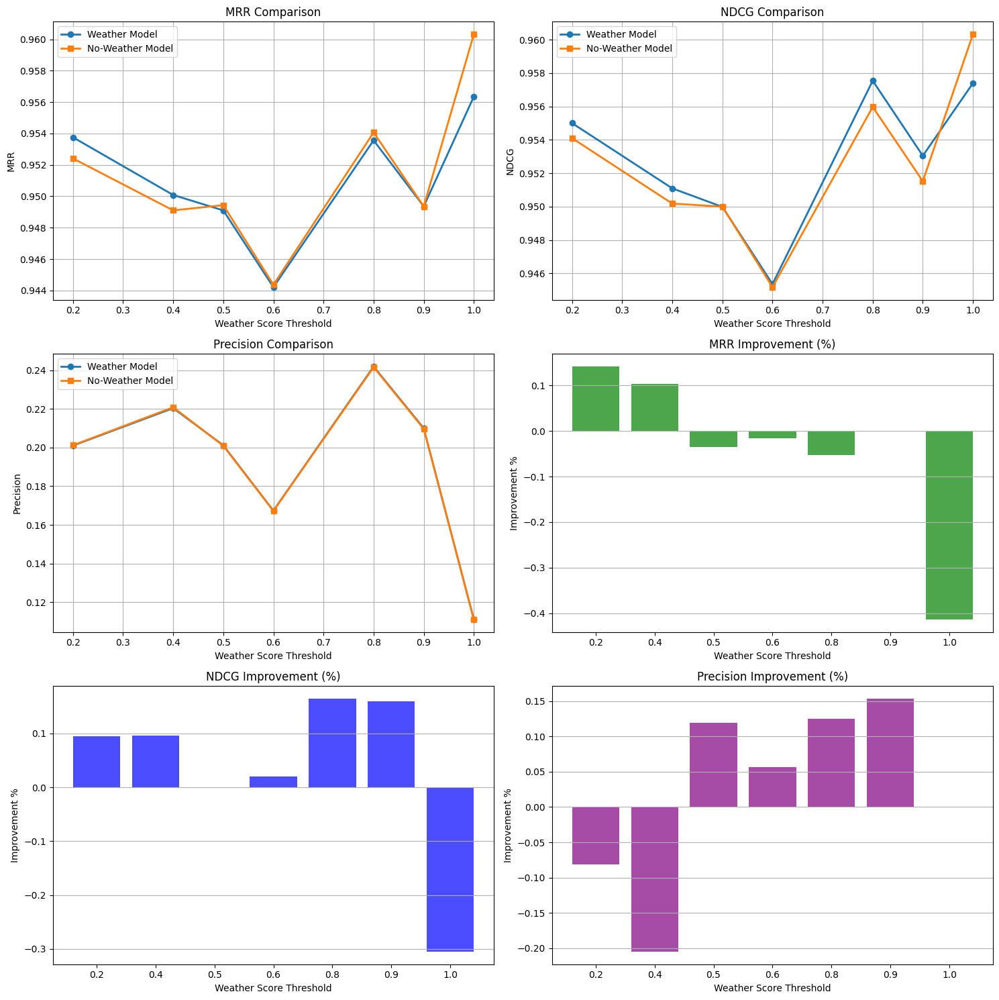

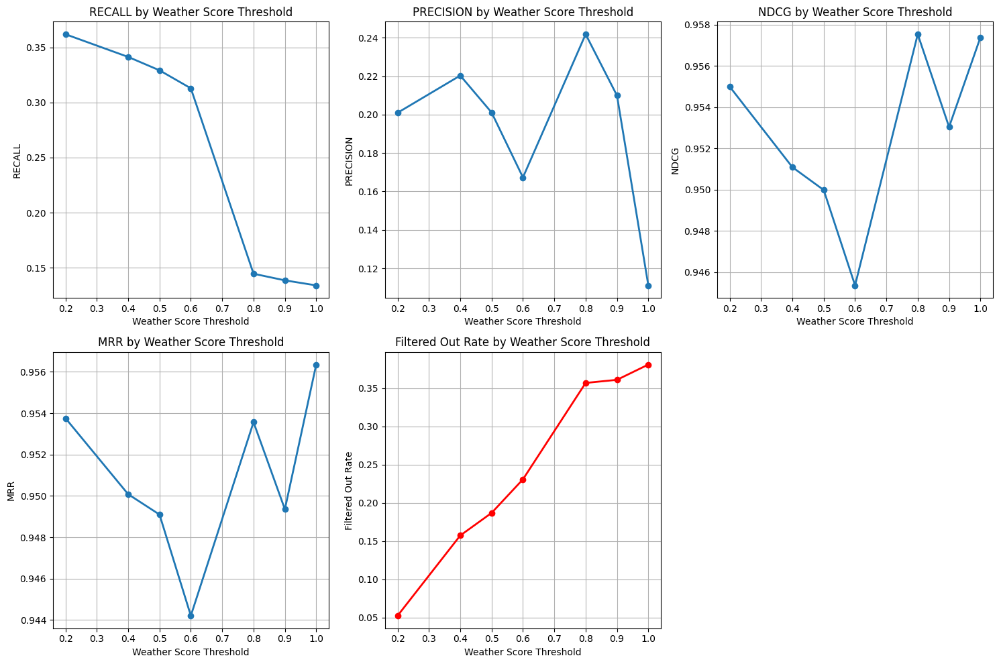

Weather features decrease MRR by 0.04%
Weather features improve NDCG by 0.03%
Weather features improve Precision by 0.03%

Evaluation pipeline complete!


In [50]:
import tensorflow as tf
import numpy as np
import pandas as pd
import faiss
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, average_precision_score, roc_curve, auc
from catboost import CatBoostClassifier, Pool
import joblib
import math
from datetime import datetime

# --- Data loading and renaming (as in your paste.txt) ---


# Load data
users_df = pd.read_csv('/home/nkama/masters_thesis_project/thesis/partially_synthetic/notebooks/test_users_data.csv')
events_df = pd.read_csv("/home/nkama/masters_thesis_project/thesis/partially_synthetic/notebooks/test_events_data.csv")
interactions_df = pd.read_csv('/home/nkama/masters_thesis_project/thesis/partially_synthetic/notebooks/test_interactions_data.csv')
print(interactions_df.isnull().sum())

# Renaming columns in users_df
users_df.rename(columns={
    'lat': 'user_lat',
    'lng': 'user_lon',
    'location': 'user_city',
    'indoor_outdoor_preference': 'user_weather_preference',
    'joinedAt': 'signup_date'
}, inplace=True)

# Renaming columns in events_df
events_df.rename(columns={
    'category': 'event_type',
    'lat': 'event_lat',
    'lng': 'event_lon',
    'city': 'event_city',
    'weather_description': 'weather_condition',
    'temperature_2m_mean': 'temperature'
}, inplace=True)

# Renaming columns in interactions_df
interactions_df.rename(columns={
    'distance_to_event': 'interaction_distance_to_event'
}, inplace=True)

def safe_id_convert(x):
    if x is None:
        return "unknown"
    if isinstance(x, float):
        if math.isnan(x):
            return "unknown"
        else:
            return str(int(x))
    try:
        return str(int(float(x)))
    except Exception:
        return "unknown"

# Apply safe conversion
users_df["user_id"] = users_df["user_id"].apply(safe_id_convert)
events_df["event_id"] = events_df["event_id"].apply(safe_id_convert)
interactions_df["user_id"] = interactions_df["user_id"].apply(safe_id_convert)
interactions_df["event_id"] = interactions_df["event_id"].apply(safe_id_convert)

# Remove rows with unknown IDs to avoid mismatches
users_df = users_df[users_df["user_id"] != "unknown"]
events_df = events_df[events_df["event_id"] != "unknown"]
interactions_df = interactions_df[
    (interactions_df["user_id"] != "unknown") & (interactions_df["event_id"] != "unknown")
]

# Verify conversion
print("Sample user_id in interactions data after conversion:", interactions_df["user_id"].head().tolist())
print("Sample user_id in users data after conversion:", users_df["user_id"].head().tolist())

# Print the first few user IDs from each dataset to compare
print("\nFirst 10 user IDs in interactions_df:", sorted(list(interactions_df["user_id"].unique()))[:10])
print("First 10 user IDs in users_df:", sorted(list(users_df["user_id"].unique()))[:10])

# Check intersection properly
common_users = set(interactions_df["user_id"]).intersection(set(users_df["user_id"]))
print(f"Number of common users: {len(common_users)}")
print("First 10 common user IDs:", sorted(list(common_users))[:10])

# Filter interactions to only include users that exist in the users dataset
interactions_df = interactions_df[interactions_df["user_id"].isin(common_users)]
print(f"Filtered interactions with valid users: {len(interactions_df)}")

# Check intersection of event IDs
common_events = set(interactions_df["event_id"]).intersection(set(events_df["event_id"]))
print(f"Number of common events: {len(common_events)}")
print("First 10 common event IDs:", sorted(list(common_events))[:10])

# Filter interactions to only include events that exist in the events dataset
interactions_df = interactions_df[interactions_df["event_id"].isin(common_events)]
print(f"Filtered interactions with valid events: {len(interactions_df)}")

# Define feature sets
QUERY_FEATURES = ["user_id", "user_city", "age", "user_interests"]
CANDIDATE_FEATURES = ["event_id", "event_city", "event_type", "title"]
# Define features for ranking models
NO_WEATHER_SELECTED_FEATURES =['interaction_distance_to_event', 'event_type', 'event_city',
       'attendance_rate', 'event_indoor_capability', 'user_city', 'age',
       'user_interests']

WEATHER_SELECTED_FEATURES =['interaction_distance_to_event', 'event_type', 'event_city', 
       'weather_condition', 'temperature', 'attendance_rate',
       'event_indoor_capability', 'user_city', 'user_weather_preference',
       'age', 'user_interests']

# Print data info
print(f"Users: {len(users_df)}, Events: {len(events_df)}, Interactions: {len(interactions_df)}")
print(f"Unique users: {interactions_df['user_id'].nunique()}")
print(f"Unique events: {interactions_df['event_id'].nunique()}")

# Split data for evaluation
test_interactions = interactions_df.sample(frac=1.0, random_state=42)
print(f"Test interactions: {len(test_interactions)}")

# --- Helper functions ---

def get_user_embeddings(query_model, user_ids):
    batch_users = users_df[users_df['user_id'].isin(user_ids)]
    if batch_users.empty:
        print(f"Warning: No users found for IDs: {user_ids}")
        return None
    batch_input = {
        "user_id": tf.constant(batch_users['user_id'].values),
        "user_city": tf.constant(batch_users['user_city'].values),
        "age": tf.constant(batch_users['age'].values, dtype=tf.float32),
        "user_interests": tf.constant(batch_users['user_interests'].values)
    }
    return query_model(batch_input).numpy()

def get_event_embeddings(candidate_model, events_data=None):
    if events_data is None:
        events_data = events_df.copy()
    events_dataset = tf.data.Dataset.from_tensor_slices({
        "event_id": tf.constant(events_data["event_id"].values),
        "event_city": tf.constant(events_data["event_city"].values),
        "event_type": tf.constant(events_data["event_type"].values),
        "title": tf.constant(events_data["title"].values)
    }).batch(128)
    event_ids = []
    event_embeddings = []
    for batch in events_dataset:
        batch_embeddings = candidate_model(batch)
        event_ids.extend(batch["event_id"].numpy())
        event_embeddings.append(batch_embeddings.numpy())
    return np.vstack(event_embeddings), event_ids

def build_faiss_index(embeddings):
    faiss.normalize_L2(embeddings)
    d = embeddings.shape[1]
    index = faiss.IndexFlatIP(d)
    index.add(embeddings)
    return index

# --- Robust weather match scoring ---

def compute_weather_match(user_weather, event_weather, user_pref, event_type_val, user_temp, event_temp, user_precip, event_precip):
    score = 0.0
    # Weather group match (0.4)
    if user_weather == event_weather:
        score += 0.4
    elif (user_weather in ['Sunny', 'Cloudy', 'Clear', 'Partly Cloudy'] and event_weather in ['Sunny', 'Cloudy', 'Clear', 'Partly Cloudy']):
        score += 0.2
    elif (user_weather in ['Rain', 'Light Drizzle', 'Heavy Rain', 'Thunderstorm'] and event_weather in ['Rain', 'Light Drizzle', 'Heavy Rain', 'Thunderstorm']):
        score += 0.2
    # Indoor/outdoor preference match (0.3)
    if user_pref == 'any':
        score += 0.3
    elif (user_pref == 'indoor' and event_type_val in ['Indoor', 'Hybrid']) or (user_pref == 'outdoor' and event_type_val in ['Outdoor', 'Hybrid']):
        score += 0.3
    # Temperature and precipitation compatibility (0.3)
    temp_diff = abs(user_temp - event_temp)
    precip_diff = abs(user_precip - event_precip)
    temp_score = max(0, 1 - (temp_diff / 20))
    precip_score = max(0, 1 - (precip_diff / 10))
    score += 0.3 * (0.6 * temp_score + 0.4 * precip_score)
    return round(score, 2)

def post_retrieval_filtering(candidates_df, user_context, filter_weather=True, filter_time=True, max_distance_km=5000, weather_score_threshold=0.5):
    if filter_time and 'start_time' in candidates_df.columns:
        now = pd.Timestamp.now(tz='UTC')
        candidates_df = candidates_df[
            pd.to_datetime(candidates_df['start_time'], utc=True) > now
        ]
    # Location proximity filtering
    if 'interaction_distance_to_event' in candidates_df.columns:
        candidates_df = candidates_df[candidates_df['interaction_distance_to_event'] <= max_distance_km]
    
    # Weather filtering
    if filter_weather:
        scores = []
        for _, event in candidates_df.iterrows():
            score = compute_weather_match(
                user_context.get('user_weather_condition', 'any'),
                event.get('weather_condition', 'unknown'),
                user_context.get('user_weather_preference', 'any'),
                event.get('event_type', 'unknown'),
                user_context.get('user_temperature', 20),
                event.get('temperature', 20),
                user_context.get('user_precipitation', 0),
                event.get('precipitation_sum', 0)
            )
            scores.append(score)
        candidates_df = candidates_df.assign(weather_match_score=scores)
        candidates_df = candidates_df[candidates_df['weather_match_score'] >= weather_score_threshold]
    return candidates_df

# --- Main retrieval-ranking pipeline with filtering ---

def evaluate_weather_thresholds_comparison(
    query_model, candidate_model, weather_model, no_weather_model, test_interactions, 
    weather_features, no_weather_features, 
    k_retrieval=100, k=10, filter_time=True, max_distance_km=5000, 
    weather_score_thresholds=[0.2, 0.4, 0.5, 0.6, 0.8, 0.9, 1.0]
):
    print("\n=== Comparing Weather vs No-Weather Models Across Thresholds ===")
    event_embeddings, event_ids_bytes = get_event_embeddings(candidate_model)
    event_ids = [eid.decode('utf-8') if isinstance(eid, bytes) else str(eid) for eid in event_ids_bytes]
    faiss_index = build_faiss_index(event_embeddings)
    
    # Initialize metrics storage for each threshold
    weather_results = {
        threshold: {
            "recall": [],
            "precision": [],
            "ndcg": [],
            "mrr": [],
            "total_users": 0,
            "successful_users": 0,
            "filtered_out_rate": []
        }
        for threshold in weather_score_thresholds
    }
    
    no_weather_results = {
        threshold: {
            "recall": [],
            "precision": [],
            "ndcg": [],
            "mrr": [],
            "total_users": 0,
            "successful_users": 0
        }
        for threshold in weather_score_thresholds
    }
    
    user_groups = test_interactions.groupby('user_id')
    total_users = 0
    
    for user_id, group in user_groups:
        try:
            total_users += 1
            
            # Get ground truth events the user actually interacted with
            attended_events = set(group[group['interaction_label'] == 1]['event_id'].tolist())
            
            # Get events matching user interests
            user_data = users_df[users_df['user_id'] == user_id].iloc[0]
            
            # Skip users with missing data
            if pd.isna(user_data['user_interests']):
                print(f"Skipping user {user_id} due to missing user_interests")
                continue
                
            user_interests = user_data['user_interests'].split(",")
            interest_matched = {
                ev_id for ev_id, ev_type in zip(events_df['event_id'], events_df['event_type'])
                if any(interest.strip().lower() in str(ev_type).lower() for interest in user_interests)
            }
            
            # Union of the two sets for relevance evaluation
            actual_relevant = attended_events.union(interest_matched)
            
            # Get user embedding and retrieve candidates
            user_embedding = get_user_embeddings(query_model, [user_id])
            if user_embedding is None or len(user_embedding) == 0:
                continue
                
            faiss.normalize_L2(user_embedding)
            distances, indices = faiss_index.search(user_embedding, k_retrieval)
            retrieved_indices = indices[0]
            retrieved_event_ids = [event_ids[idx] for idx in retrieved_indices]
            retrieved_events_df = events_df[events_df['event_id'].isin(retrieved_event_ids)].copy()
            
            if retrieved_events_df.empty:
                continue
                
            # Add contextual columns from interactions_df if available
            merged = pd.merge(
                retrieved_events_df,
                interactions_df[interactions_df['user_id'] == user_id][['event_id', 'interaction_distance_to_event']],
                on='event_id', how='inner'
            )
            
            # Fill missing distances with mean
            merged['interaction_distance_to_event'] = merged['interaction_distance_to_event'].fillna(interactions_df['interaction_distance_to_event'].mean())
            
            # User context for weather filtering
            user_context = {
                'user_weather_condition': group['user_weather_condition'].iloc[0] if 'user_weather_condition' in group.columns else 'any',
                'user_weather_preference': user_data.get('user_weather_preference', 'any'),
                'user_temperature': group['user_temperature'].iloc[0] if 'user_temperature' in group.columns else 20,
                'user_precipitation': group['user_precipitation'].iloc[0] if 'user_precipitation' in group.columns else 0,
                'user_city': user_data['user_city'],
                'age': user_data['age']
            }
            
            # Calculate weather scores for all candidates without filtering
            scores = []
            for _, event in merged.iterrows():
                score = compute_weather_match(
                    user_context.get('user_weather_condition', 'any'),
                    event.get('weather_condition', 'unknown'),
                    user_context.get('user_weather_preference', 'any'),
                    event.get('event_type', 'unknown'),
                    user_context.get('user_temperature', 20),
                    event.get('temperature', 20),
                    user_context.get('user_precipitation', 0),
                    event.get('precipitation_sum', 0)
                )
                scores.append(score)
            merged['weather_match_score'] = scores
            
            # Process each threshold for weather model
            for threshold in weather_score_thresholds:
                weather_results[threshold]["total_users"] += 1
                
                # Apply weather threshold filtering
                filtered_candidates = merged[merged['weather_match_score'] >= threshold].copy()
                
                # Calculate filtered out rate
                filtered_out_rate = 1 - (len(filtered_candidates) / len(merged)) if len(merged) > 0 else 0
                weather_results[threshold]["filtered_out_rate"].append(filtered_out_rate)
                
                if filtered_candidates.empty:
                    continue
                
                # Process weather model
                weather_recommendations = process_model_recommendations(
                    filtered_candidates, user_data, weather_model, weather_features, 
                    actual_relevant, attended_events, interest_matched, k
                )
                
                if weather_recommendations:
                    # Update weather metrics
                    weather_results[threshold]["recall"].append(weather_recommendations["recall"])
                    weather_results[threshold]["precision"].append(weather_recommendations["precision"])
                    weather_results[threshold]["ndcg"].append(weather_recommendations["ndcg"])
                    weather_results[threshold]["mrr"].append(weather_recommendations["mrr"])
                    weather_results[threshold]["successful_users"] += 1
                
                # Process no-weather model with same candidates
                no_weather_recommendations = process_model_recommendations(
                    filtered_candidates, user_data, no_weather_model, no_weather_features, 
                    actual_relevant, attended_events, interest_matched, k
                )
                
                if no_weather_recommendations:
                    # Update no-weather metrics
                    no_weather_results[threshold]["recall"].append(no_weather_recommendations["recall"])
                    no_weather_results[threshold]["precision"].append(no_weather_recommendations["precision"])
                    no_weather_results[threshold]["ndcg"].append(no_weather_recommendations["ndcg"])
                    no_weather_results[threshold]["mrr"].append(no_weather_recommendations["mrr"])
                    no_weather_results[threshold]["successful_users"] += 1
            
            if total_users % 100 == 0:
                print(f"Processed {total_users} users")
                
        except Exception as e:
            print(f"Error processing user {user_id}: {e}")
            continue
    
    # Calculate average metrics for each threshold
    weather_summary = {}
    no_weather_summary = {}
    comparison = {}
    
    for threshold in weather_score_thresholds:
        # Weather metrics
        w_metrics = weather_results[threshold]
        w_recall = np.mean(w_metrics["recall"]) if w_metrics["recall"] else 0
        w_precision = np.mean(w_metrics["precision"]) if w_metrics["precision"] else 0
        w_ndcg = np.mean(w_metrics["ndcg"]) if w_metrics["ndcg"] else 0
        w_mrr = np.mean(w_metrics["mrr"]) if w_metrics["mrr"] else 0
        w_filtered_out_rate = np.mean(w_metrics["filtered_out_rate"]) if w_metrics["filtered_out_rate"] else 0
        
        weather_summary[threshold] = {
            "recall": w_recall,
            "precision": w_precision,
            "ndcg": w_ndcg,
            "mrr": w_mrr,
            "successful_users": w_metrics["successful_users"],
            "total_users": w_metrics["total_users"],
            "filtered_out_rate": w_filtered_out_rate
        }
        
        # No-weather metrics
        nw_metrics = no_weather_results[threshold]
        nw_recall = np.mean(nw_metrics["recall"]) if nw_metrics["recall"] else 0
        nw_precision = np.mean(nw_metrics["precision"]) if nw_metrics["precision"] else 0
        nw_ndcg = np.mean(nw_metrics["ndcg"]) if nw_metrics["ndcg"] else 0
        nw_mrr = np.mean(nw_metrics["mrr"]) if nw_metrics["mrr"] else 0
        
        no_weather_summary[threshold] = {
            "recall": nw_recall,
            "precision": nw_precision,
            "ndcg": nw_ndcg,
            "mrr": nw_mrr,
            "successful_users": nw_metrics["successful_users"],
            "total_users": nw_metrics["total_users"]
        }
        
        # Calculate improvement percentages
        if nw_mrr > 0:
            mrr_improvement = ((w_mrr - nw_mrr) / nw_mrr) * 100
        else:
            mrr_improvement = float('inf') if w_mrr > 0 else 0
            
        if nw_ndcg > 0:
            ndcg_improvement = ((w_ndcg - nw_ndcg) / nw_ndcg) * 100
        else:
            ndcg_improvement = float('inf') if w_ndcg > 0 else 0
            
        if nw_precision > 0:
            precision_improvement = ((w_precision - nw_precision) / nw_precision) * 100
        else:
            precision_improvement = float('inf') if w_precision > 0 else 0
            
        if nw_recall > 0:
            recall_improvement = ((w_recall - nw_recall) / nw_recall) * 100
        else:
            recall_improvement = float('inf') if w_recall > 0 else 0
            
        comparison[threshold] = {
            "mrr_improvement": mrr_improvement,
            "ndcg_improvement": ndcg_improvement,
            "precision_improvement": precision_improvement,
            "recall_improvement": recall_improvement,
            "weather_mrr": w_mrr,
            "no_weather_mrr": nw_mrr,
            "weather_ndcg": w_ndcg,
            "no_weather_ndcg": nw_ndcg,
            "weather_precision": w_precision,
            "no_weather_precision": nw_precision
        }
    
    # Convert to DataFrames for easier visualization
    weather_df = pd.DataFrame(weather_summary).T
    weather_df.index.name = 'Weather Score Threshold'
    
    no_weather_df = pd.DataFrame(no_weather_summary).T
    no_weather_df.index.name = 'Weather Score Threshold'
    
    comparison_df = pd.DataFrame(comparison).T
    comparison_df.index.name = 'Weather Score Threshold'
    
    # Print results
    print(f"\nEvaluation Results for k={k}:")
    print(f"Total users evaluated: {total_users}")
    
    print("\nWeather Model Metrics:")
    print(weather_df)
    
    print("\nNo-Weather Model Metrics:")
    print(no_weather_df)
    
    print("\nImprovement Percentages:")
    print(comparison_df[["mrr_improvement", "ndcg_improvement", "precision_improvement", "recall_improvement"]])
    
    # Plot comparison
    plt.figure(figsize=(15, 15))
    
    # MRR Comparison
    plt.subplot(3, 2, 1)
    plt.plot(weather_df.index, weather_df["mrr"], marker='o', linewidth=2, label="Weather Model")
    plt.plot(no_weather_df.index, no_weather_df["mrr"], marker='s', linewidth=2, label="No-Weather Model")
    plt.title('MRR Comparison')
    plt.xlabel('Weather Score Threshold')
    plt.ylabel('MRR')
    plt.legend()
    plt.grid(True)
    
    # NDCG Comparison
    plt.subplot(3, 2, 2)
    plt.plot(weather_df.index, weather_df["ndcg"], marker='o', linewidth=2, label="Weather Model")
    plt.plot(no_weather_df.index, no_weather_df["ndcg"], marker='s', linewidth=2, label="No-Weather Model")
    plt.title('NDCG Comparison')
    plt.xlabel('Weather Score Threshold')
    plt.ylabel('NDCG')
    plt.legend()
    plt.grid(True)
    
    # Precision Comparison
    plt.subplot(3, 2, 3)
    plt.plot(weather_df.index, weather_df["precision"], marker='o', linewidth=2, label="Weather Model")
    plt.plot(no_weather_df.index, no_weather_df["precision"], marker='s', linewidth=2, label="No-Weather Model")
    plt.title('Precision Comparison')
    plt.xlabel('Weather Score Threshold')
    plt.ylabel('Precision')
    plt.legend()
    plt.grid(True)
    
    # MRR Improvement Percentages
    plt.subplot(3, 2, 4)
    plt.bar(comparison_df.index.astype(str), comparison_df["mrr_improvement"], color='green', alpha=0.7)
    plt.title('MRR Improvement (%)')
    plt.xlabel('Weather Score Threshold')
    plt.ylabel('Improvement %')
    plt.grid(True, axis='y')
    
    # NDCG Improvement Percentages
    plt.subplot(3, 2, 5)
    plt.bar(comparison_df.index.astype(str), comparison_df["ndcg_improvement"], color='blue', alpha=0.7)
    plt.title('NDCG Improvement (%)')
    plt.xlabel('Weather Score Threshold')
    plt.ylabel('Improvement %')
    plt.grid(True, axis='y')
    
    # Precision Improvement Percentages
    plt.subplot(3, 2, 6)
    plt.bar(comparison_df.index.astype(str), comparison_df["precision_improvement"], color='purple', alpha=0.7)
    plt.title('Precision Improvement (%)')
    plt.xlabel('Weather Score Threshold')
    plt.ylabel('Improvement %')
    plt.grid(True, axis='y')
    
    plt.tight_layout()
    plt.savefig('weather_vs_no_weather_comparison.png')
    plt.show()
    
    # Plot individual metrics
    plt.figure(figsize=(15, 10))
    
    # RECALL by Weather Score Threshold
    plt.subplot(2, 3, 1)
    plt.plot(weather_df.index, weather_df["recall"], marker='o', linewidth=2)
    plt.title('RECALL by Weather Score Threshold')
    plt.xlabel('Weather Score Threshold')
    plt.ylabel('RECALL')
    plt.grid(True)
    
    # PRECISION by Weather Score Threshold
    plt.subplot(2, 3, 2)
    plt.plot(weather_df.index, weather_df["precision"], marker='o', linewidth=2)
    plt.title('PRECISION by Weather Score Threshold')
    plt.xlabel('Weather Score Threshold')
    plt.ylabel('PRECISION')
    plt.grid(True)
    
    # NDCG by Weather Score Threshold
    plt.subplot(2, 3, 3)
    plt.plot(weather_df.index, weather_df["ndcg"], marker='o', linewidth=2)
    plt.title('NDCG by Weather Score Threshold')
    plt.xlabel('Weather Score Threshold')
    plt.ylabel('NDCG')
    plt.grid(True)
    
    # MRR by Weather Score Threshold
    plt.subplot(2, 3, 4)
    plt.plot(weather_df.index, weather_df["mrr"], marker='o', linewidth=2)
    plt.title('MRR by Weather Score Threshold')
    plt.xlabel('Weather Score Threshold')
    plt.ylabel('MRR')
    plt.grid(True)
    
    # Filtered Out Rate by Weather Score Threshold
    plt.subplot(2, 3, 5)
    plt.plot(weather_df.index, weather_df["filtered_out_rate"], marker='o', linewidth=2, color='red')
    plt.title('Filtered Out Rate by Weather Score Threshold')
    plt.xlabel('Weather Score Threshold')
    plt.ylabel('Filtered Out Rate')
    plt.grid(True)
    
    plt.tight_layout()
    plt.savefig('weather_metrics_by_threshold.png')
    plt.show()
    
    return weather_df, no_weather_df, comparison_df

def process_model_recommendations(candidates_df, user_data, model, feature_list, actual_relevant, attended_events, interest_matched, k):
    """Helper function to process model recommendations and calculate metrics"""
    try:
        # Prepare data for ranking
        ranking_data = []
        for _, event in candidates_df.iterrows():
            row = {
                'event_id': event['event_id'],
                'event_type': event['event_type'],
                'event_city': event['event_city'],
                'attendance_rate': event['attendance_rate'],
                'event_indoor_capability': event['event_indoor_capability'],
                'user_city': user_data['user_city'],
                'age': user_data['age'],
                'user_interests': user_data['user_interests']
            }
            if 'weather_condition' in feature_list:
                row['weather_condition'] = event['weather_condition']
                row['temperature'] = event['temperature']
                row['user_weather_preference'] = user_data['user_weather_preference']
            row['interaction_distance_to_event'] = event['interaction_distance_to_event']
            ranking_data.append(row)
        
        ranking_df = pd.DataFrame(ranking_data)
        
        # Fill missing features
        for feat in feature_list:
            if feat not in ranking_df.columns:
                if feat in ['user_interests', 'event_type', 'event_city', 'user_city', 'user_weather_preference', 'weather_condition']:
                    ranking_df[feat] = 'unknown'
                elif feat in ['interaction_distance_to_event', 'temperature', 'attendance_rate']:
                    ranking_df[feat] = 0.0
                elif feat == 'age':
                    ranking_df[feat] = 30
                elif feat == 'event_indoor_capability':
                    ranking_df[feat] = True
        
        # Prepare features for ranking model
        text_cols = ["title", "user_interests"]
        ranking_features = ranking_df[feature_list].drop(columns=[c for c in text_cols if c in ranking_df.columns])
        
        for col in ranking_features.columns:
            if ranking_features[col].dtype == 'object':
                ranking_features[col] = ranking_features[col].fillna('unknown')
            elif ranking_features[col].dtype in ['float64', 'float32']:
                ranking_features[col] = ranking_features[col].fillna(0.0)
            elif ranking_features[col].dtype in ['int64', 'int32']:
                ranking_features[col] = ranking_features[col].fillna(0)
            elif ranking_features[col].dtype == 'bool':
                ranking_features[col] = ranking_features[col].fillna(False)
        
        cat_features = ranking_features.select_dtypes(include=["object", "bool"]).columns.tolist()
        ranking_pool = Pool(data=ranking_features, cat_features=cat_features)
        ranking_scores = model.predict_proba(ranking_pool)[:, 1]
        ranked_results = pd.DataFrame({'event_id': ranking_df['event_id'], 'ranking_score': ranking_scores})
        ranked_results.sort_values('ranking_score', ascending=False, inplace=True)
        final_recommendation_ids = ranked_results['event_id'].tolist()[:k]
        
        if not final_recommendation_ids:
            return None
        
        # Calculate metrics
        top_k = set(final_recommendation_ids)
        
        # Calculate other metrics
        hits = len(top_k.intersection(actual_relevant))
        recall = hits / len(actual_relevant) if actual_relevant else 0
        precision = hits / k if k > 0 else 0
        
        # NDCG calculation
        relevance = [1 if eid in actual_relevant else 0 for eid in final_recommendation_ids]
        dcg = sum(rel / np.log2(i + 2) for i, rel in enumerate(relevance))
        ideal_relevance = sorted(relevance, reverse=True)
        idcg = sum(rel / np.log2(i + 2) for i, rel in enumerate(ideal_relevance))
        ndcg = dcg / idcg if idcg > 0 else 0
        
        # MRR calculation
        mrr = 0
        for i, eid in enumerate(final_recommendation_ids):
            if eid in actual_relevant:
                mrr = 1.0 / (i + 1)
                break
        
        return {
            "recall": recall,
            "precision": precision,
            "ndcg": ndcg,
            "mrr": mrr
        }
    except Exception as e:
        print(f"Error processing recommendations: {e}")
        return None

def main():
    print("Starting evaluation pipeline for weather score threshold impact...")
    print(f"Current date: Sunday, May 18, 2025, 1:13 PM CEST")
    print("=" * 50)
    
    # Load models (replace with your actual model loading code)
    query_model = model.query_model
    candidate_model = model.item_model
    weather_model = joblib.load("/home/nkama/masters_thesis_project/thesis/models/weather_ranking_model.pkl")
    no_weather_model = joblib.load("/home/nkama/masters_thesis_project/thesis/models/no_weather_ranking_model_2.pkl")
    
    # Define weather score thresholds to evaluate
    weather_thresholds = [0.2, 0.4, 0.5, 0.6, 0.8, 0.9, 1.0]
    
    # Evaluate impact of weather score thresholds with comparison to no-weather model
    weather_df, no_weather_df, comparison_df = evaluate_weather_thresholds_comparison(
        query_model,
        candidate_model,
        weather_model,
        no_weather_model,
        test_interactions,
        WEATHER_SELECTED_FEATURES,
        NO_WEATHER_SELECTED_FEATURES,
        k_retrieval=1000,
        k=10,  # Fixed k for evaluation
        filter_time=False,
        max_distance_km=500,
        weather_score_thresholds=weather_thresholds
    )
    
    # Save results
    # weather_df.to_csv("weather_model_results.csv")
    # no_weather_df.to_csv("no_weather_model_results.csv")
    # comparison_df.to_csv("model_comparison_results.csv")
    
    # Calculate overall improvement for all metrics
    if weather_df["mrr"].mean() > no_weather_df["mrr"].mean():
        mrr_improvement = ((weather_df["mrr"].mean() - no_weather_df["mrr"].mean()) / no_weather_df["mrr"].mean()) * 100
        print(f"Weather features improve MRR by {mrr_improvement:.2f}%")
    else:
        mrr_diff = ((no_weather_df["mrr"].mean() - weather_df["mrr"].mean()) / weather_df["mrr"].mean()) * 100
        print(f"Weather features decrease MRR by {mrr_diff:.2f}%")
        
    if weather_df["ndcg"].mean() > no_weather_df["ndcg"].mean():
        ndcg_improvement = ((weather_df["ndcg"].mean() - no_weather_df["ndcg"].mean()) / no_weather_df["ndcg"].mean()) * 100
        print(f"Weather features improve NDCG by {ndcg_improvement:.2f}%")
    else:
        ndcg_diff = ((no_weather_df["ndcg"].mean() - weather_df["ndcg"].mean()) / weather_df["ndcg"].mean()) * 100
        print(f"Weather features decrease NDCG by {ndcg_diff:.2f}%")
        
    if weather_df["precision"].mean() > no_weather_df["precision"].mean():
        precision_improvement = ((weather_df["precision"].mean() - no_weather_df["precision"].mean()) / no_weather_df["precision"].mean()) * 100
        print(f"Weather features improve Precision by {precision_improvement:.2f}%")
    else:
        precision_diff = ((no_weather_df["precision"].mean() - weather_df["precision"].mean()) / weather_df["precision"].mean()) * 100
        print(f"Weather features decrease Precision by {precision_diff:.2f}%")
    
    print("\nEvaluation pipeline complete!")

if __name__ == "__main__":
    main()


<Axes: ylabel='Frequency'>

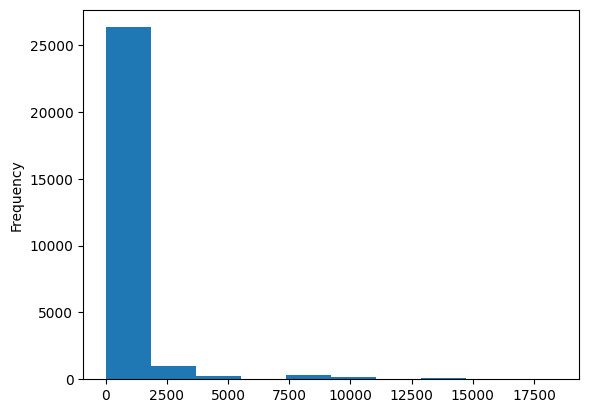

In [21]:
interactions_df["interaction_distance_to_event"].plot(kind="hist")